# Optimal transport

*Selected Topics in Mathematical Optimization: 2017-2018*

**Michiel Stock** ([email](michiel.stock@ugent.be))

![](Figures/logo.png)

In [1]:
from optimal_transport import red, green, orange, yellow, blue, black
import matplotlib.pyplot as plt
import numpy as np
from optimal_transport import pairwise_distances
%matplotlib inline

## Cell tracking

In a microscopy imaging experiment we monitor ten moving cells at time $t_1$ and some time later at time $t_2$. Between these times, the cells have moved. An image processing algorithm determined the coordinates of every cell in the two images. We want to know which cell in the first corresponds to the second image. To this end, search the assignment that minimizes the sum of the squared Euclidian distances between cells from the first image versus the corresponding cell of the second image.

1. `X1` and `X2` contain the $x,y$ coordinates of the cells for the two images. Compute the matrix $C$ containing the pairwise squared Euclidean distance. You can use the function `pairwise_distances` from `sklearn`.
2. Complete the function `monge_brute_force` to use brute-force search for the best permutation.
3. Make a plot connecting the cells.

In [80]:
from cell_tracking import X1, X2, plot_cells

In [18]:
# all permutations can easily be generated in python
from itertools import permutations

for perm in permutations([1, 2, 3]):
    print(perm)

(0, 1, 2, 3, 4, 5, 6, 7, 8, 9)
(0, 1, 2, 3, 4, 5, 6, 7, 9, 8)
(0, 1, 2, 3, 4, 5, 6, 8, 7, 9)
(0, 1, 2, 3, 4, 5, 6, 8, 9, 7)
(0, 1, 2, 3, 4, 5, 6, 9, 7, 8)
(0, 1, 2, 3, 4, 5, 6, 9, 8, 7)
(0, 1, 2, 3, 4, 5, 7, 6, 8, 9)
(0, 1, 2, 3, 4, 5, 7, 6, 9, 8)
(0, 1, 2, 3, 4, 5, 7, 8, 6, 9)
(0, 1, 2, 3, 4, 5, 7, 8, 9, 6)
(0, 1, 2, 3, 4, 5, 7, 9, 6, 8)
(0, 1, 2, 3, 4, 5, 7, 9, 8, 6)
(0, 1, 2, 3, 4, 5, 8, 6, 7, 9)
(0, 1, 2, 3, 4, 5, 8, 6, 9, 7)
(0, 1, 2, 3, 4, 5, 8, 7, 6, 9)
(0, 1, 2, 3, 4, 5, 8, 7, 9, 6)
(0, 1, 2, 3, 4, 5, 8, 9, 6, 7)
(0, 1, 2, 3, 4, 5, 8, 9, 7, 6)
(0, 1, 2, 3, 4, 5, 9, 6, 7, 8)
(0, 1, 2, 3, 4, 5, 9, 6, 8, 7)
(0, 1, 2, 3, 4, 5, 9, 7, 6, 8)
(0, 1, 2, 3, 4, 5, 9, 7, 8, 6)
(0, 1, 2, 3, 4, 5, 9, 8, 6, 7)
(0, 1, 2, 3, 4, 5, 9, 8, 7, 6)
(0, 1, 2, 3, 4, 6, 5, 7, 8, 9)
(0, 1, 2, 3, 4, 6, 5, 7, 9, 8)
(0, 1, 2, 3, 4, 6, 5, 8, 7, 9)
(0, 1, 2, 3, 4, 6, 5, 8, 9, 7)
(0, 1, 2, 3, 4, 6, 5, 9, 7, 8)
(0, 1, 2, 3, 4, 6, 5, 9, 8, 7)
(0, 1, 2, 3, 4, 6, 7, 5, 8, 9)
(0, 1, 2, 3, 4, 6, 7, 5, 9, 8)
(0, 1, 2

(0, 1, 2, 7, 5, 4, 3, 8, 9, 6)
(0, 1, 2, 7, 5, 4, 3, 9, 6, 8)
(0, 1, 2, 7, 5, 4, 3, 9, 8, 6)
(0, 1, 2, 7, 5, 4, 6, 3, 8, 9)
(0, 1, 2, 7, 5, 4, 6, 3, 9, 8)
(0, 1, 2, 7, 5, 4, 6, 8, 3, 9)
(0, 1, 2, 7, 5, 4, 6, 8, 9, 3)
(0, 1, 2, 7, 5, 4, 6, 9, 3, 8)
(0, 1, 2, 7, 5, 4, 6, 9, 8, 3)
(0, 1, 2, 7, 5, 4, 8, 3, 6, 9)
(0, 1, 2, 7, 5, 4, 8, 3, 9, 6)
(0, 1, 2, 7, 5, 4, 8, 6, 3, 9)
(0, 1, 2, 7, 5, 4, 8, 6, 9, 3)
(0, 1, 2, 7, 5, 4, 8, 9, 3, 6)
(0, 1, 2, 7, 5, 4, 8, 9, 6, 3)
(0, 1, 2, 7, 5, 4, 9, 3, 6, 8)
(0, 1, 2, 7, 5, 4, 9, 3, 8, 6)
(0, 1, 2, 7, 5, 4, 9, 6, 3, 8)
(0, 1, 2, 7, 5, 4, 9, 6, 8, 3)
(0, 1, 2, 7, 5, 4, 9, 8, 3, 6)
(0, 1, 2, 7, 5, 4, 9, 8, 6, 3)
(0, 1, 2, 7, 5, 6, 3, 4, 8, 9)
(0, 1, 2, 7, 5, 6, 3, 4, 9, 8)
(0, 1, 2, 7, 5, 6, 3, 8, 4, 9)
(0, 1, 2, 7, 5, 6, 3, 8, 9, 4)
(0, 1, 2, 7, 5, 6, 3, 9, 4, 8)
(0, 1, 2, 7, 5, 6, 3, 9, 8, 4)
(0, 1, 2, 7, 5, 6, 4, 3, 8, 9)
(0, 1, 2, 7, 5, 6, 4, 3, 9, 8)
(0, 1, 2, 7, 5, 6, 4, 8, 3, 9)
(0, 1, 2, 7, 5, 6, 4, 8, 9, 3)
(0, 1, 2, 7, 5, 6, 4, 9, 3, 8)
(0, 1, 2

(0, 1, 3, 5, 7, 9, 4, 6, 8, 2)
(0, 1, 3, 5, 7, 9, 4, 8, 2, 6)
(0, 1, 3, 5, 7, 9, 4, 8, 6, 2)
(0, 1, 3, 5, 7, 9, 6, 2, 4, 8)
(0, 1, 3, 5, 7, 9, 6, 2, 8, 4)
(0, 1, 3, 5, 7, 9, 6, 4, 2, 8)
(0, 1, 3, 5, 7, 9, 6, 4, 8, 2)
(0, 1, 3, 5, 7, 9, 6, 8, 2, 4)
(0, 1, 3, 5, 7, 9, 6, 8, 4, 2)
(0, 1, 3, 5, 7, 9, 8, 2, 4, 6)
(0, 1, 3, 5, 7, 9, 8, 2, 6, 4)
(0, 1, 3, 5, 7, 9, 8, 4, 2, 6)
(0, 1, 3, 5, 7, 9, 8, 4, 6, 2)
(0, 1, 3, 5, 7, 9, 8, 6, 2, 4)
(0, 1, 3, 5, 7, 9, 8, 6, 4, 2)
(0, 1, 3, 5, 8, 2, 4, 6, 7, 9)
(0, 1, 3, 5, 8, 2, 4, 6, 9, 7)
(0, 1, 3, 5, 8, 2, 4, 7, 6, 9)
(0, 1, 3, 5, 8, 2, 4, 7, 9, 6)
(0, 1, 3, 5, 8, 2, 4, 9, 6, 7)
(0, 1, 3, 5, 8, 2, 4, 9, 7, 6)
(0, 1, 3, 5, 8, 2, 6, 4, 7, 9)
(0, 1, 3, 5, 8, 2, 6, 4, 9, 7)
(0, 1, 3, 5, 8, 2, 6, 7, 4, 9)
(0, 1, 3, 5, 8, 2, 6, 7, 9, 4)
(0, 1, 3, 5, 8, 2, 6, 9, 4, 7)
(0, 1, 3, 5, 8, 2, 6, 9, 7, 4)
(0, 1, 3, 5, 8, 2, 7, 4, 6, 9)
(0, 1, 3, 5, 8, 2, 7, 4, 9, 6)
(0, 1, 3, 5, 8, 2, 7, 6, 4, 9)
(0, 1, 3, 5, 8, 2, 7, 6, 9, 4)
(0, 1, 3, 5, 8, 2, 7, 9, 4, 6)
(0, 1, 3

(0, 1, 4, 2, 9, 8, 6, 3, 5, 7)
(0, 1, 4, 2, 9, 8, 6, 3, 7, 5)
(0, 1, 4, 2, 9, 8, 6, 5, 3, 7)
(0, 1, 4, 2, 9, 8, 6, 5, 7, 3)
(0, 1, 4, 2, 9, 8, 6, 7, 3, 5)
(0, 1, 4, 2, 9, 8, 6, 7, 5, 3)
(0, 1, 4, 2, 9, 8, 7, 3, 5, 6)
(0, 1, 4, 2, 9, 8, 7, 3, 6, 5)
(0, 1, 4, 2, 9, 8, 7, 5, 3, 6)
(0, 1, 4, 2, 9, 8, 7, 5, 6, 3)
(0, 1, 4, 2, 9, 8, 7, 6, 3, 5)
(0, 1, 4, 2, 9, 8, 7, 6, 5, 3)
(0, 1, 4, 3, 2, 5, 6, 7, 8, 9)
(0, 1, 4, 3, 2, 5, 6, 7, 9, 8)
(0, 1, 4, 3, 2, 5, 6, 8, 7, 9)
(0, 1, 4, 3, 2, 5, 6, 8, 9, 7)
(0, 1, 4, 3, 2, 5, 6, 9, 7, 8)
(0, 1, 4, 3, 2, 5, 6, 9, 8, 7)
(0, 1, 4, 3, 2, 5, 7, 6, 8, 9)
(0, 1, 4, 3, 2, 5, 7, 6, 9, 8)
(0, 1, 4, 3, 2, 5, 7, 8, 6, 9)
(0, 1, 4, 3, 2, 5, 7, 8, 9, 6)
(0, 1, 4, 3, 2, 5, 7, 9, 6, 8)
(0, 1, 4, 3, 2, 5, 7, 9, 8, 6)
(0, 1, 4, 3, 2, 5, 8, 6, 7, 9)
(0, 1, 4, 3, 2, 5, 8, 6, 9, 7)
(0, 1, 4, 3, 2, 5, 8, 7, 6, 9)
(0, 1, 4, 3, 2, 5, 8, 7, 9, 6)
(0, 1, 4, 3, 2, 5, 8, 9, 6, 7)
(0, 1, 4, 3, 2, 5, 8, 9, 7, 6)
(0, 1, 4, 3, 2, 5, 9, 6, 7, 8)
(0, 1, 4, 3, 2, 5, 9, 6, 8, 7)
(0, 1, 4

(0, 1, 5, 2, 4, 6, 9, 8, 3, 7)
(0, 1, 5, 2, 4, 6, 9, 8, 7, 3)
(0, 1, 5, 2, 4, 7, 3, 6, 8, 9)
(0, 1, 5, 2, 4, 7, 3, 6, 9, 8)
(0, 1, 5, 2, 4, 7, 3, 8, 6, 9)
(0, 1, 5, 2, 4, 7, 3, 8, 9, 6)
(0, 1, 5, 2, 4, 7, 3, 9, 6, 8)
(0, 1, 5, 2, 4, 7, 3, 9, 8, 6)
(0, 1, 5, 2, 4, 7, 6, 3, 8, 9)
(0, 1, 5, 2, 4, 7, 6, 3, 9, 8)
(0, 1, 5, 2, 4, 7, 6, 8, 3, 9)
(0, 1, 5, 2, 4, 7, 6, 8, 9, 3)
(0, 1, 5, 2, 4, 7, 6, 9, 3, 8)
(0, 1, 5, 2, 4, 7, 6, 9, 8, 3)
(0, 1, 5, 2, 4, 7, 8, 3, 6, 9)
(0, 1, 5, 2, 4, 7, 8, 3, 9, 6)
(0, 1, 5, 2, 4, 7, 8, 6, 3, 9)
(0, 1, 5, 2, 4, 7, 8, 6, 9, 3)
(0, 1, 5, 2, 4, 7, 8, 9, 3, 6)
(0, 1, 5, 2, 4, 7, 8, 9, 6, 3)
(0, 1, 5, 2, 4, 7, 9, 3, 6, 8)
(0, 1, 5, 2, 4, 7, 9, 3, 8, 6)
(0, 1, 5, 2, 4, 7, 9, 6, 3, 8)
(0, 1, 5, 2, 4, 7, 9, 6, 8, 3)
(0, 1, 5, 2, 4, 7, 9, 8, 3, 6)
(0, 1, 5, 2, 4, 7, 9, 8, 6, 3)
(0, 1, 5, 2, 4, 8, 3, 6, 7, 9)
(0, 1, 5, 2, 4, 8, 3, 6, 9, 7)
(0, 1, 5, 2, 4, 8, 3, 7, 6, 9)
(0, 1, 5, 2, 4, 8, 3, 7, 9, 6)
(0, 1, 5, 2, 4, 8, 3, 9, 6, 7)
(0, 1, 5, 2, 4, 8, 3, 9, 7, 6)
(0, 1, 5

(0, 1, 5, 9, 4, 8, 2, 6, 3, 7)
(0, 1, 5, 9, 4, 8, 2, 6, 7, 3)
(0, 1, 5, 9, 4, 8, 2, 7, 3, 6)
(0, 1, 5, 9, 4, 8, 2, 7, 6, 3)
(0, 1, 5, 9, 4, 8, 3, 2, 6, 7)
(0, 1, 5, 9, 4, 8, 3, 2, 7, 6)
(0, 1, 5, 9, 4, 8, 3, 6, 2, 7)
(0, 1, 5, 9, 4, 8, 3, 6, 7, 2)
(0, 1, 5, 9, 4, 8, 3, 7, 2, 6)
(0, 1, 5, 9, 4, 8, 3, 7, 6, 2)
(0, 1, 5, 9, 4, 8, 6, 2, 3, 7)
(0, 1, 5, 9, 4, 8, 6, 2, 7, 3)
(0, 1, 5, 9, 4, 8, 6, 3, 2, 7)
(0, 1, 5, 9, 4, 8, 6, 3, 7, 2)
(0, 1, 5, 9, 4, 8, 6, 7, 2, 3)
(0, 1, 5, 9, 4, 8, 6, 7, 3, 2)
(0, 1, 5, 9, 4, 8, 7, 2, 3, 6)
(0, 1, 5, 9, 4, 8, 7, 2, 6, 3)
(0, 1, 5, 9, 4, 8, 7, 3, 2, 6)
(0, 1, 5, 9, 4, 8, 7, 3, 6, 2)
(0, 1, 5, 9, 4, 8, 7, 6, 2, 3)
(0, 1, 5, 9, 4, 8, 7, 6, 3, 2)
(0, 1, 5, 9, 6, 2, 3, 4, 7, 8)
(0, 1, 5, 9, 6, 2, 3, 4, 8, 7)
(0, 1, 5, 9, 6, 2, 3, 7, 4, 8)
(0, 1, 5, 9, 6, 2, 3, 7, 8, 4)
(0, 1, 5, 9, 6, 2, 3, 8, 4, 7)
(0, 1, 5, 9, 6, 2, 3, 8, 7, 4)
(0, 1, 5, 9, 6, 2, 4, 3, 7, 8)
(0, 1, 5, 9, 6, 2, 4, 3, 8, 7)
(0, 1, 5, 9, 6, 2, 4, 7, 3, 8)
(0, 1, 5, 9, 6, 2, 4, 7, 8, 3)
(0, 1, 5

(0, 1, 6, 8, 4, 3, 7, 5, 2, 9)
(0, 1, 6, 8, 4, 3, 7, 5, 9, 2)
(0, 1, 6, 8, 4, 3, 7, 9, 2, 5)
(0, 1, 6, 8, 4, 3, 7, 9, 5, 2)
(0, 1, 6, 8, 4, 3, 9, 2, 5, 7)
(0, 1, 6, 8, 4, 3, 9, 2, 7, 5)
(0, 1, 6, 8, 4, 3, 9, 5, 2, 7)
(0, 1, 6, 8, 4, 3, 9, 5, 7, 2)
(0, 1, 6, 8, 4, 3, 9, 7, 2, 5)
(0, 1, 6, 8, 4, 3, 9, 7, 5, 2)
(0, 1, 6, 8, 4, 5, 2, 3, 7, 9)
(0, 1, 6, 8, 4, 5, 2, 3, 9, 7)
(0, 1, 6, 8, 4, 5, 2, 7, 3, 9)
(0, 1, 6, 8, 4, 5, 2, 7, 9, 3)
(0, 1, 6, 8, 4, 5, 2, 9, 3, 7)
(0, 1, 6, 8, 4, 5, 2, 9, 7, 3)
(0, 1, 6, 8, 4, 5, 3, 2, 7, 9)
(0, 1, 6, 8, 4, 5, 3, 2, 9, 7)
(0, 1, 6, 8, 4, 5, 3, 7, 2, 9)
(0, 1, 6, 8, 4, 5, 3, 7, 9, 2)
(0, 1, 6, 8, 4, 5, 3, 9, 2, 7)
(0, 1, 6, 8, 4, 5, 3, 9, 7, 2)
(0, 1, 6, 8, 4, 5, 7, 2, 3, 9)
(0, 1, 6, 8, 4, 5, 7, 2, 9, 3)
(0, 1, 6, 8, 4, 5, 7, 3, 2, 9)
(0, 1, 6, 8, 4, 5, 7, 3, 9, 2)
(0, 1, 6, 8, 4, 5, 7, 9, 2, 3)
(0, 1, 6, 8, 4, 5, 7, 9, 3, 2)
(0, 1, 6, 8, 4, 5, 9, 2, 3, 7)
(0, 1, 6, 8, 4, 5, 9, 2, 7, 3)
(0, 1, 6, 8, 4, 5, 9, 3, 2, 7)
(0, 1, 6, 8, 4, 5, 9, 3, 7, 2)
(0, 1, 6

(0, 1, 7, 3, 8, 6, 2, 4, 5, 9)
(0, 1, 7, 3, 8, 6, 2, 4, 9, 5)
(0, 1, 7, 3, 8, 6, 2, 5, 4, 9)
(0, 1, 7, 3, 8, 6, 2, 5, 9, 4)
(0, 1, 7, 3, 8, 6, 2, 9, 4, 5)
(0, 1, 7, 3, 8, 6, 2, 9, 5, 4)
(0, 1, 7, 3, 8, 6, 4, 2, 5, 9)
(0, 1, 7, 3, 8, 6, 4, 2, 9, 5)
(0, 1, 7, 3, 8, 6, 4, 5, 2, 9)
(0, 1, 7, 3, 8, 6, 4, 5, 9, 2)
(0, 1, 7, 3, 8, 6, 4, 9, 2, 5)
(0, 1, 7, 3, 8, 6, 4, 9, 5, 2)
(0, 1, 7, 3, 8, 6, 5, 2, 4, 9)
(0, 1, 7, 3, 8, 6, 5, 2, 9, 4)
(0, 1, 7, 3, 8, 6, 5, 4, 2, 9)
(0, 1, 7, 3, 8, 6, 5, 4, 9, 2)
(0, 1, 7, 3, 8, 6, 5, 9, 2, 4)
(0, 1, 7, 3, 8, 6, 5, 9, 4, 2)
(0, 1, 7, 3, 8, 6, 9, 2, 4, 5)
(0, 1, 7, 3, 8, 6, 9, 2, 5, 4)
(0, 1, 7, 3, 8, 6, 9, 4, 2, 5)
(0, 1, 7, 3, 8, 6, 9, 4, 5, 2)
(0, 1, 7, 3, 8, 6, 9, 5, 2, 4)
(0, 1, 7, 3, 8, 6, 9, 5, 4, 2)
(0, 1, 7, 3, 8, 9, 2, 4, 5, 6)
(0, 1, 7, 3, 8, 9, 2, 4, 6, 5)
(0, 1, 7, 3, 8, 9, 2, 5, 4, 6)
(0, 1, 7, 3, 8, 9, 2, 5, 6, 4)
(0, 1, 7, 3, 8, 9, 2, 6, 4, 5)
(0, 1, 7, 3, 8, 9, 2, 6, 5, 4)
(0, 1, 7, 3, 8, 9, 4, 2, 5, 6)
(0, 1, 7, 3, 8, 9, 4, 2, 6, 5)
(0, 1, 7

(0, 1, 7, 8, 6, 5, 2, 9, 3, 4)
(0, 1, 7, 8, 6, 5, 2, 9, 4, 3)
(0, 1, 7, 8, 6, 5, 3, 2, 4, 9)
(0, 1, 7, 8, 6, 5, 3, 2, 9, 4)
(0, 1, 7, 8, 6, 5, 3, 4, 2, 9)
(0, 1, 7, 8, 6, 5, 3, 4, 9, 2)
(0, 1, 7, 8, 6, 5, 3, 9, 2, 4)
(0, 1, 7, 8, 6, 5, 3, 9, 4, 2)
(0, 1, 7, 8, 6, 5, 4, 2, 3, 9)
(0, 1, 7, 8, 6, 5, 4, 2, 9, 3)
(0, 1, 7, 8, 6, 5, 4, 3, 2, 9)
(0, 1, 7, 8, 6, 5, 4, 3, 9, 2)
(0, 1, 7, 8, 6, 5, 4, 9, 2, 3)
(0, 1, 7, 8, 6, 5, 4, 9, 3, 2)
(0, 1, 7, 8, 6, 5, 9, 2, 3, 4)
(0, 1, 7, 8, 6, 5, 9, 2, 4, 3)
(0, 1, 7, 8, 6, 5, 9, 3, 2, 4)
(0, 1, 7, 8, 6, 5, 9, 3, 4, 2)
(0, 1, 7, 8, 6, 5, 9, 4, 2, 3)
(0, 1, 7, 8, 6, 5, 9, 4, 3, 2)
(0, 1, 7, 8, 6, 9, 2, 3, 4, 5)
(0, 1, 7, 8, 6, 9, 2, 3, 5, 4)
(0, 1, 7, 8, 6, 9, 2, 4, 3, 5)
(0, 1, 7, 8, 6, 9, 2, 4, 5, 3)
(0, 1, 7, 8, 6, 9, 2, 5, 3, 4)
(0, 1, 7, 8, 6, 9, 2, 5, 4, 3)
(0, 1, 7, 8, 6, 9, 3, 2, 4, 5)
(0, 1, 7, 8, 6, 9, 3, 2, 5, 4)
(0, 1, 7, 8, 6, 9, 3, 4, 2, 5)
(0, 1, 7, 8, 6, 9, 3, 4, 5, 2)
(0, 1, 7, 8, 6, 9, 3, 5, 2, 4)
(0, 1, 7, 8, 6, 9, 3, 5, 4, 2)
(0, 1, 7

(0, 1, 8, 3, 7, 2, 4, 9, 6, 5)
(0, 1, 8, 3, 7, 2, 5, 4, 6, 9)
(0, 1, 8, 3, 7, 2, 5, 4, 9, 6)
(0, 1, 8, 3, 7, 2, 5, 6, 4, 9)
(0, 1, 8, 3, 7, 2, 5, 6, 9, 4)
(0, 1, 8, 3, 7, 2, 5, 9, 4, 6)
(0, 1, 8, 3, 7, 2, 5, 9, 6, 4)
(0, 1, 8, 3, 7, 2, 6, 4, 5, 9)
(0, 1, 8, 3, 7, 2, 6, 4, 9, 5)
(0, 1, 8, 3, 7, 2, 6, 5, 4, 9)
(0, 1, 8, 3, 7, 2, 6, 5, 9, 4)
(0, 1, 8, 3, 7, 2, 6, 9, 4, 5)
(0, 1, 8, 3, 7, 2, 6, 9, 5, 4)
(0, 1, 8, 3, 7, 2, 9, 4, 5, 6)
(0, 1, 8, 3, 7, 2, 9, 4, 6, 5)
(0, 1, 8, 3, 7, 2, 9, 5, 4, 6)
(0, 1, 8, 3, 7, 2, 9, 5, 6, 4)
(0, 1, 8, 3, 7, 2, 9, 6, 4, 5)
(0, 1, 8, 3, 7, 2, 9, 6, 5, 4)
(0, 1, 8, 3, 7, 4, 2, 5, 6, 9)
(0, 1, 8, 3, 7, 4, 2, 5, 9, 6)
(0, 1, 8, 3, 7, 4, 2, 6, 5, 9)
(0, 1, 8, 3, 7, 4, 2, 6, 9, 5)
(0, 1, 8, 3, 7, 4, 2, 9, 5, 6)
(0, 1, 8, 3, 7, 4, 2, 9, 6, 5)
(0, 1, 8, 3, 7, 4, 5, 2, 6, 9)
(0, 1, 8, 3, 7, 4, 5, 2, 9, 6)
(0, 1, 8, 3, 7, 4, 5, 6, 2, 9)
(0, 1, 8, 3, 7, 4, 5, 6, 9, 2)
(0, 1, 8, 3, 7, 4, 5, 9, 2, 6)
(0, 1, 8, 3, 7, 4, 5, 9, 6, 2)
(0, 1, 8, 3, 7, 4, 6, 2, 5, 9)
(0, 1, 8

(0, 1, 8, 7, 6, 9, 3, 2, 4, 5)
(0, 1, 8, 7, 6, 9, 3, 2, 5, 4)
(0, 1, 8, 7, 6, 9, 3, 4, 2, 5)
(0, 1, 8, 7, 6, 9, 3, 4, 5, 2)
(0, 1, 8, 7, 6, 9, 3, 5, 2, 4)
(0, 1, 8, 7, 6, 9, 3, 5, 4, 2)
(0, 1, 8, 7, 6, 9, 4, 2, 3, 5)
(0, 1, 8, 7, 6, 9, 4, 2, 5, 3)
(0, 1, 8, 7, 6, 9, 4, 3, 2, 5)
(0, 1, 8, 7, 6, 9, 4, 3, 5, 2)
(0, 1, 8, 7, 6, 9, 4, 5, 2, 3)
(0, 1, 8, 7, 6, 9, 4, 5, 3, 2)
(0, 1, 8, 7, 6, 9, 5, 2, 3, 4)
(0, 1, 8, 7, 6, 9, 5, 2, 4, 3)
(0, 1, 8, 7, 6, 9, 5, 3, 2, 4)
(0, 1, 8, 7, 6, 9, 5, 3, 4, 2)
(0, 1, 8, 7, 6, 9, 5, 4, 2, 3)
(0, 1, 8, 7, 6, 9, 5, 4, 3, 2)
(0, 1, 8, 7, 9, 2, 3, 4, 5, 6)
(0, 1, 8, 7, 9, 2, 3, 4, 6, 5)
(0, 1, 8, 7, 9, 2, 3, 5, 4, 6)
(0, 1, 8, 7, 9, 2, 3, 5, 6, 4)
(0, 1, 8, 7, 9, 2, 3, 6, 4, 5)
(0, 1, 8, 7, 9, 2, 3, 6, 5, 4)
(0, 1, 8, 7, 9, 2, 4, 3, 5, 6)
(0, 1, 8, 7, 9, 2, 4, 3, 6, 5)
(0, 1, 8, 7, 9, 2, 4, 5, 3, 6)
(0, 1, 8, 7, 9, 2, 4, 5, 6, 3)
(0, 1, 8, 7, 9, 2, 4, 6, 3, 5)
(0, 1, 8, 7, 9, 2, 4, 6, 5, 3)
(0, 1, 8, 7, 9, 2, 5, 3, 4, 6)
(0, 1, 8, 7, 9, 2, 5, 3, 6, 4)
(0, 1, 8

(0, 1, 9, 3, 8, 4, 7, 6, 2, 5)
(0, 1, 9, 3, 8, 4, 7, 6, 5, 2)
(0, 1, 9, 3, 8, 5, 2, 4, 6, 7)
(0, 1, 9, 3, 8, 5, 2, 4, 7, 6)
(0, 1, 9, 3, 8, 5, 2, 6, 4, 7)
(0, 1, 9, 3, 8, 5, 2, 6, 7, 4)
(0, 1, 9, 3, 8, 5, 2, 7, 4, 6)
(0, 1, 9, 3, 8, 5, 2, 7, 6, 4)
(0, 1, 9, 3, 8, 5, 4, 2, 6, 7)
(0, 1, 9, 3, 8, 5, 4, 2, 7, 6)
(0, 1, 9, 3, 8, 5, 4, 6, 2, 7)
(0, 1, 9, 3, 8, 5, 4, 6, 7, 2)
(0, 1, 9, 3, 8, 5, 4, 7, 2, 6)
(0, 1, 9, 3, 8, 5, 4, 7, 6, 2)
(0, 1, 9, 3, 8, 5, 6, 2, 4, 7)
(0, 1, 9, 3, 8, 5, 6, 2, 7, 4)
(0, 1, 9, 3, 8, 5, 6, 4, 2, 7)
(0, 1, 9, 3, 8, 5, 6, 4, 7, 2)
(0, 1, 9, 3, 8, 5, 6, 7, 2, 4)
(0, 1, 9, 3, 8, 5, 6, 7, 4, 2)
(0, 1, 9, 3, 8, 5, 7, 2, 4, 6)
(0, 1, 9, 3, 8, 5, 7, 2, 6, 4)
(0, 1, 9, 3, 8, 5, 7, 4, 2, 6)
(0, 1, 9, 3, 8, 5, 7, 4, 6, 2)
(0, 1, 9, 3, 8, 5, 7, 6, 2, 4)
(0, 1, 9, 3, 8, 5, 7, 6, 4, 2)
(0, 1, 9, 3, 8, 6, 2, 4, 5, 7)
(0, 1, 9, 3, 8, 6, 2, 4, 7, 5)
(0, 1, 9, 3, 8, 6, 2, 5, 4, 7)
(0, 1, 9, 3, 8, 6, 2, 5, 7, 4)
(0, 1, 9, 3, 8, 6, 2, 7, 4, 5)
(0, 1, 9, 3, 8, 6, 2, 7, 5, 4)
(0, 1, 9

(0, 1, 9, 7, 5, 4, 8, 6, 3, 2)
(0, 1, 9, 7, 5, 6, 2, 3, 4, 8)
(0, 1, 9, 7, 5, 6, 2, 3, 8, 4)
(0, 1, 9, 7, 5, 6, 2, 4, 3, 8)
(0, 1, 9, 7, 5, 6, 2, 4, 8, 3)
(0, 1, 9, 7, 5, 6, 2, 8, 3, 4)
(0, 1, 9, 7, 5, 6, 2, 8, 4, 3)
(0, 1, 9, 7, 5, 6, 3, 2, 4, 8)
(0, 1, 9, 7, 5, 6, 3, 2, 8, 4)
(0, 1, 9, 7, 5, 6, 3, 4, 2, 8)
(0, 1, 9, 7, 5, 6, 3, 4, 8, 2)
(0, 1, 9, 7, 5, 6, 3, 8, 2, 4)
(0, 1, 9, 7, 5, 6, 3, 8, 4, 2)
(0, 1, 9, 7, 5, 6, 4, 2, 3, 8)
(0, 1, 9, 7, 5, 6, 4, 2, 8, 3)
(0, 1, 9, 7, 5, 6, 4, 3, 2, 8)
(0, 1, 9, 7, 5, 6, 4, 3, 8, 2)
(0, 1, 9, 7, 5, 6, 4, 8, 2, 3)
(0, 1, 9, 7, 5, 6, 4, 8, 3, 2)
(0, 1, 9, 7, 5, 6, 8, 2, 3, 4)
(0, 1, 9, 7, 5, 6, 8, 2, 4, 3)
(0, 1, 9, 7, 5, 6, 8, 3, 2, 4)
(0, 1, 9, 7, 5, 6, 8, 3, 4, 2)
(0, 1, 9, 7, 5, 6, 8, 4, 2, 3)
(0, 1, 9, 7, 5, 6, 8, 4, 3, 2)
(0, 1, 9, 7, 5, 8, 2, 3, 4, 6)
(0, 1, 9, 7, 5, 8, 2, 3, 6, 4)
(0, 1, 9, 7, 5, 8, 2, 4, 3, 6)
(0, 1, 9, 7, 5, 8, 2, 4, 6, 3)
(0, 1, 9, 7, 5, 8, 2, 6, 3, 4)
(0, 1, 9, 7, 5, 8, 2, 6, 4, 3)
(0, 1, 9, 7, 5, 8, 3, 2, 4, 6)
(0, 1, 9

(0, 2, 1, 4, 6, 3, 7, 9, 5, 8)
(0, 2, 1, 4, 6, 3, 7, 9, 8, 5)
(0, 2, 1, 4, 6, 3, 8, 5, 7, 9)
(0, 2, 1, 4, 6, 3, 8, 5, 9, 7)
(0, 2, 1, 4, 6, 3, 8, 7, 5, 9)
(0, 2, 1, 4, 6, 3, 8, 7, 9, 5)
(0, 2, 1, 4, 6, 3, 8, 9, 5, 7)
(0, 2, 1, 4, 6, 3, 8, 9, 7, 5)
(0, 2, 1, 4, 6, 3, 9, 5, 7, 8)
(0, 2, 1, 4, 6, 3, 9, 5, 8, 7)
(0, 2, 1, 4, 6, 3, 9, 7, 5, 8)
(0, 2, 1, 4, 6, 3, 9, 7, 8, 5)
(0, 2, 1, 4, 6, 3, 9, 8, 5, 7)
(0, 2, 1, 4, 6, 3, 9, 8, 7, 5)
(0, 2, 1, 4, 6, 5, 3, 7, 8, 9)
(0, 2, 1, 4, 6, 5, 3, 7, 9, 8)
(0, 2, 1, 4, 6, 5, 3, 8, 7, 9)
(0, 2, 1, 4, 6, 5, 3, 8, 9, 7)
(0, 2, 1, 4, 6, 5, 3, 9, 7, 8)
(0, 2, 1, 4, 6, 5, 3, 9, 8, 7)
(0, 2, 1, 4, 6, 5, 7, 3, 8, 9)
(0, 2, 1, 4, 6, 5, 7, 3, 9, 8)
(0, 2, 1, 4, 6, 5, 7, 8, 3, 9)
(0, 2, 1, 4, 6, 5, 7, 8, 9, 3)
(0, 2, 1, 4, 6, 5, 7, 9, 3, 8)
(0, 2, 1, 4, 6, 5, 7, 9, 8, 3)
(0, 2, 1, 4, 6, 5, 8, 3, 7, 9)
(0, 2, 1, 4, 6, 5, 8, 3, 9, 7)
(0, 2, 1, 4, 6, 5, 8, 7, 3, 9)
(0, 2, 1, 4, 6, 5, 8, 7, 9, 3)
(0, 2, 1, 4, 6, 5, 8, 9, 3, 7)
(0, 2, 1, 4, 6, 5, 8, 9, 7, 3)
(0, 2, 1

(0, 2, 1, 9, 3, 8, 6, 7, 4, 5)
(0, 2, 1, 9, 3, 8, 6, 7, 5, 4)
(0, 2, 1, 9, 3, 8, 7, 4, 5, 6)
(0, 2, 1, 9, 3, 8, 7, 4, 6, 5)
(0, 2, 1, 9, 3, 8, 7, 5, 4, 6)
(0, 2, 1, 9, 3, 8, 7, 5, 6, 4)
(0, 2, 1, 9, 3, 8, 7, 6, 4, 5)
(0, 2, 1, 9, 3, 8, 7, 6, 5, 4)
(0, 2, 1, 9, 4, 3, 5, 6, 7, 8)
(0, 2, 1, 9, 4, 3, 5, 6, 8, 7)
(0, 2, 1, 9, 4, 3, 5, 7, 6, 8)
(0, 2, 1, 9, 4, 3, 5, 7, 8, 6)
(0, 2, 1, 9, 4, 3, 5, 8, 6, 7)
(0, 2, 1, 9, 4, 3, 5, 8, 7, 6)
(0, 2, 1, 9, 4, 3, 6, 5, 7, 8)
(0, 2, 1, 9, 4, 3, 6, 5, 8, 7)
(0, 2, 1, 9, 4, 3, 6, 7, 5, 8)
(0, 2, 1, 9, 4, 3, 6, 7, 8, 5)
(0, 2, 1, 9, 4, 3, 6, 8, 5, 7)
(0, 2, 1, 9, 4, 3, 6, 8, 7, 5)
(0, 2, 1, 9, 4, 3, 7, 5, 6, 8)
(0, 2, 1, 9, 4, 3, 7, 5, 8, 6)
(0, 2, 1, 9, 4, 3, 7, 6, 5, 8)
(0, 2, 1, 9, 4, 3, 7, 6, 8, 5)
(0, 2, 1, 9, 4, 3, 7, 8, 5, 6)
(0, 2, 1, 9, 4, 3, 7, 8, 6, 5)
(0, 2, 1, 9, 4, 3, 8, 5, 6, 7)
(0, 2, 1, 9, 4, 3, 8, 5, 7, 6)
(0, 2, 1, 9, 4, 3, 8, 6, 5, 7)
(0, 2, 1, 9, 4, 3, 8, 6, 7, 5)
(0, 2, 1, 9, 4, 3, 8, 7, 5, 6)
(0, 2, 1, 9, 4, 3, 8, 7, 6, 5)
(0, 2, 1

(0, 2, 3, 7, 6, 9, 5, 4, 1, 8)
(0, 2, 3, 7, 6, 9, 5, 4, 8, 1)
(0, 2, 3, 7, 6, 9, 5, 8, 1, 4)
(0, 2, 3, 7, 6, 9, 5, 8, 4, 1)
(0, 2, 3, 7, 6, 9, 8, 1, 4, 5)
(0, 2, 3, 7, 6, 9, 8, 1, 5, 4)
(0, 2, 3, 7, 6, 9, 8, 4, 1, 5)
(0, 2, 3, 7, 6, 9, 8, 4, 5, 1)
(0, 2, 3, 7, 6, 9, 8, 5, 1, 4)
(0, 2, 3, 7, 6, 9, 8, 5, 4, 1)
(0, 2, 3, 7, 8, 1, 4, 5, 6, 9)
(0, 2, 3, 7, 8, 1, 4, 5, 9, 6)
(0, 2, 3, 7, 8, 1, 4, 6, 5, 9)
(0, 2, 3, 7, 8, 1, 4, 6, 9, 5)
(0, 2, 3, 7, 8, 1, 4, 9, 5, 6)
(0, 2, 3, 7, 8, 1, 4, 9, 6, 5)
(0, 2, 3, 7, 8, 1, 5, 4, 6, 9)
(0, 2, 3, 7, 8, 1, 5, 4, 9, 6)
(0, 2, 3, 7, 8, 1, 5, 6, 4, 9)
(0, 2, 3, 7, 8, 1, 5, 6, 9, 4)
(0, 2, 3, 7, 8, 1, 5, 9, 4, 6)
(0, 2, 3, 7, 8, 1, 5, 9, 6, 4)
(0, 2, 3, 7, 8, 1, 6, 4, 5, 9)
(0, 2, 3, 7, 8, 1, 6, 4, 9, 5)
(0, 2, 3, 7, 8, 1, 6, 5, 4, 9)
(0, 2, 3, 7, 8, 1, 6, 5, 9, 4)
(0, 2, 3, 7, 8, 1, 6, 9, 4, 5)
(0, 2, 3, 7, 8, 1, 6, 9, 5, 4)
(0, 2, 3, 7, 8, 1, 9, 4, 5, 6)
(0, 2, 3, 7, 8, 1, 9, 4, 6, 5)
(0, 2, 3, 7, 8, 1, 9, 5, 4, 6)
(0, 2, 3, 7, 8, 1, 9, 5, 6, 4)
(0, 2, 3

(0, 2, 4, 3, 7, 5, 1, 9, 6, 8)
(0, 2, 4, 3, 7, 5, 1, 9, 8, 6)
(0, 2, 4, 3, 7, 5, 6, 1, 8, 9)
(0, 2, 4, 3, 7, 5, 6, 1, 9, 8)
(0, 2, 4, 3, 7, 5, 6, 8, 1, 9)
(0, 2, 4, 3, 7, 5, 6, 8, 9, 1)
(0, 2, 4, 3, 7, 5, 6, 9, 1, 8)
(0, 2, 4, 3, 7, 5, 6, 9, 8, 1)
(0, 2, 4, 3, 7, 5, 8, 1, 6, 9)
(0, 2, 4, 3, 7, 5, 8, 1, 9, 6)
(0, 2, 4, 3, 7, 5, 8, 6, 1, 9)
(0, 2, 4, 3, 7, 5, 8, 6, 9, 1)
(0, 2, 4, 3, 7, 5, 8, 9, 1, 6)
(0, 2, 4, 3, 7, 5, 8, 9, 6, 1)
(0, 2, 4, 3, 7, 5, 9, 1, 6, 8)
(0, 2, 4, 3, 7, 5, 9, 1, 8, 6)
(0, 2, 4, 3, 7, 5, 9, 6, 1, 8)
(0, 2, 4, 3, 7, 5, 9, 6, 8, 1)
(0, 2, 4, 3, 7, 5, 9, 8, 1, 6)
(0, 2, 4, 3, 7, 5, 9, 8, 6, 1)
(0, 2, 4, 3, 7, 6, 1, 5, 8, 9)
(0, 2, 4, 3, 7, 6, 1, 5, 9, 8)
(0, 2, 4, 3, 7, 6, 1, 8, 5, 9)
(0, 2, 4, 3, 7, 6, 1, 8, 9, 5)
(0, 2, 4, 3, 7, 6, 1, 9, 5, 8)
(0, 2, 4, 3, 7, 6, 1, 9, 8, 5)
(0, 2, 4, 3, 7, 6, 5, 1, 8, 9)
(0, 2, 4, 3, 7, 6, 5, 1, 9, 8)
(0, 2, 4, 3, 7, 6, 5, 8, 1, 9)
(0, 2, 4, 3, 7, 6, 5, 8, 9, 1)
(0, 2, 4, 3, 7, 6, 5, 9, 1, 8)
(0, 2, 4, 3, 7, 6, 5, 9, 8, 1)
(0, 2, 4

(0, 2, 4, 7, 8, 6, 9, 5, 3, 1)
(0, 2, 4, 7, 8, 9, 1, 3, 5, 6)
(0, 2, 4, 7, 8, 9, 1, 3, 6, 5)
(0, 2, 4, 7, 8, 9, 1, 5, 3, 6)
(0, 2, 4, 7, 8, 9, 1, 5, 6, 3)
(0, 2, 4, 7, 8, 9, 1, 6, 3, 5)
(0, 2, 4, 7, 8, 9, 1, 6, 5, 3)
(0, 2, 4, 7, 8, 9, 3, 1, 5, 6)
(0, 2, 4, 7, 8, 9, 3, 1, 6, 5)
(0, 2, 4, 7, 8, 9, 3, 5, 1, 6)
(0, 2, 4, 7, 8, 9, 3, 5, 6, 1)
(0, 2, 4, 7, 8, 9, 3, 6, 1, 5)
(0, 2, 4, 7, 8, 9, 3, 6, 5, 1)
(0, 2, 4, 7, 8, 9, 5, 1, 3, 6)
(0, 2, 4, 7, 8, 9, 5, 1, 6, 3)
(0, 2, 4, 7, 8, 9, 5, 3, 1, 6)
(0, 2, 4, 7, 8, 9, 5, 3, 6, 1)
(0, 2, 4, 7, 8, 9, 5, 6, 1, 3)
(0, 2, 4, 7, 8, 9, 5, 6, 3, 1)
(0, 2, 4, 7, 8, 9, 6, 1, 3, 5)
(0, 2, 4, 7, 8, 9, 6, 1, 5, 3)
(0, 2, 4, 7, 8, 9, 6, 3, 1, 5)
(0, 2, 4, 7, 8, 9, 6, 3, 5, 1)
(0, 2, 4, 7, 8, 9, 6, 5, 1, 3)
(0, 2, 4, 7, 8, 9, 6, 5, 3, 1)
(0, 2, 4, 7, 9, 1, 3, 5, 6, 8)
(0, 2, 4, 7, 9, 1, 3, 5, 8, 6)
(0, 2, 4, 7, 9, 1, 3, 6, 5, 8)
(0, 2, 4, 7, 9, 1, 3, 6, 8, 5)
(0, 2, 4, 7, 9, 1, 3, 8, 5, 6)
(0, 2, 4, 7, 9, 1, 3, 8, 6, 5)
(0, 2, 4, 7, 9, 1, 5, 3, 6, 8)
(0, 2, 4

(0, 2, 5, 6, 1, 7, 9, 4, 3, 8)
(0, 2, 5, 6, 1, 7, 9, 4, 8, 3)
(0, 2, 5, 6, 1, 7, 9, 8, 3, 4)
(0, 2, 5, 6, 1, 7, 9, 8, 4, 3)
(0, 2, 5, 6, 1, 8, 3, 4, 7, 9)
(0, 2, 5, 6, 1, 8, 3, 4, 9, 7)
(0, 2, 5, 6, 1, 8, 3, 7, 4, 9)
(0, 2, 5, 6, 1, 8, 3, 7, 9, 4)
(0, 2, 5, 6, 1, 8, 3, 9, 4, 7)
(0, 2, 5, 6, 1, 8, 3, 9, 7, 4)
(0, 2, 5, 6, 1, 8, 4, 3, 7, 9)
(0, 2, 5, 6, 1, 8, 4, 3, 9, 7)
(0, 2, 5, 6, 1, 8, 4, 7, 3, 9)
(0, 2, 5, 6, 1, 8, 4, 7, 9, 3)
(0, 2, 5, 6, 1, 8, 4, 9, 3, 7)
(0, 2, 5, 6, 1, 8, 4, 9, 7, 3)
(0, 2, 5, 6, 1, 8, 7, 3, 4, 9)
(0, 2, 5, 6, 1, 8, 7, 3, 9, 4)
(0, 2, 5, 6, 1, 8, 7, 4, 3, 9)
(0, 2, 5, 6, 1, 8, 7, 4, 9, 3)
(0, 2, 5, 6, 1, 8, 7, 9, 3, 4)
(0, 2, 5, 6, 1, 8, 7, 9, 4, 3)
(0, 2, 5, 6, 1, 8, 9, 3, 4, 7)
(0, 2, 5, 6, 1, 8, 9, 3, 7, 4)
(0, 2, 5, 6, 1, 8, 9, 4, 3, 7)
(0, 2, 5, 6, 1, 8, 9, 4, 7, 3)
(0, 2, 5, 6, 1, 8, 9, 7, 3, 4)
(0, 2, 5, 6, 1, 8, 9, 7, 4, 3)
(0, 2, 5, 6, 1, 9, 3, 4, 7, 8)
(0, 2, 5, 6, 1, 9, 3, 4, 8, 7)
(0, 2, 5, 6, 1, 9, 3, 7, 4, 8)
(0, 2, 5, 6, 1, 9, 3, 7, 8, 4)
(0, 2, 5

(0, 2, 6, 1, 7, 9, 4, 3, 8, 5)
(0, 2, 6, 1, 7, 9, 4, 5, 3, 8)
(0, 2, 6, 1, 7, 9, 4, 5, 8, 3)
(0, 2, 6, 1, 7, 9, 4, 8, 3, 5)
(0, 2, 6, 1, 7, 9, 4, 8, 5, 3)
(0, 2, 6, 1, 7, 9, 5, 3, 4, 8)
(0, 2, 6, 1, 7, 9, 5, 3, 8, 4)
(0, 2, 6, 1, 7, 9, 5, 4, 3, 8)
(0, 2, 6, 1, 7, 9, 5, 4, 8, 3)
(0, 2, 6, 1, 7, 9, 5, 8, 3, 4)
(0, 2, 6, 1, 7, 9, 5, 8, 4, 3)
(0, 2, 6, 1, 7, 9, 8, 3, 4, 5)
(0, 2, 6, 1, 7, 9, 8, 3, 5, 4)
(0, 2, 6, 1, 7, 9, 8, 4, 3, 5)
(0, 2, 6, 1, 7, 9, 8, 4, 5, 3)
(0, 2, 6, 1, 7, 9, 8, 5, 3, 4)
(0, 2, 6, 1, 7, 9, 8, 5, 4, 3)
(0, 2, 6, 1, 8, 3, 4, 5, 7, 9)
(0, 2, 6, 1, 8, 3, 4, 5, 9, 7)
(0, 2, 6, 1, 8, 3, 4, 7, 5, 9)
(0, 2, 6, 1, 8, 3, 4, 7, 9, 5)
(0, 2, 6, 1, 8, 3, 4, 9, 5, 7)
(0, 2, 6, 1, 8, 3, 4, 9, 7, 5)
(0, 2, 6, 1, 8, 3, 5, 4, 7, 9)
(0, 2, 6, 1, 8, 3, 5, 4, 9, 7)
(0, 2, 6, 1, 8, 3, 5, 7, 4, 9)
(0, 2, 6, 1, 8, 3, 5, 7, 9, 4)
(0, 2, 6, 1, 8, 3, 5, 9, 4, 7)
(0, 2, 6, 1, 8, 3, 5, 9, 7, 4)
(0, 2, 6, 1, 8, 3, 7, 4, 5, 9)
(0, 2, 6, 1, 8, 3, 7, 4, 9, 5)
(0, 2, 6, 1, 8, 3, 7, 5, 4, 9)
(0, 2, 6

(0, 2, 6, 7, 9, 4, 8, 3, 1, 5)
(0, 2, 6, 7, 9, 4, 8, 3, 5, 1)
(0, 2, 6, 7, 9, 4, 8, 5, 1, 3)
(0, 2, 6, 7, 9, 4, 8, 5, 3, 1)
(0, 2, 6, 7, 9, 5, 1, 3, 4, 8)
(0, 2, 6, 7, 9, 5, 1, 3, 8, 4)
(0, 2, 6, 7, 9, 5, 1, 4, 3, 8)
(0, 2, 6, 7, 9, 5, 1, 4, 8, 3)
(0, 2, 6, 7, 9, 5, 1, 8, 3, 4)
(0, 2, 6, 7, 9, 5, 1, 8, 4, 3)
(0, 2, 6, 7, 9, 5, 3, 1, 4, 8)
(0, 2, 6, 7, 9, 5, 3, 1, 8, 4)
(0, 2, 6, 7, 9, 5, 3, 4, 1, 8)
(0, 2, 6, 7, 9, 5, 3, 4, 8, 1)
(0, 2, 6, 7, 9, 5, 3, 8, 1, 4)
(0, 2, 6, 7, 9, 5, 3, 8, 4, 1)
(0, 2, 6, 7, 9, 5, 4, 1, 3, 8)
(0, 2, 6, 7, 9, 5, 4, 1, 8, 3)
(0, 2, 6, 7, 9, 5, 4, 3, 1, 8)
(0, 2, 6, 7, 9, 5, 4, 3, 8, 1)
(0, 2, 6, 7, 9, 5, 4, 8, 1, 3)
(0, 2, 6, 7, 9, 5, 4, 8, 3, 1)
(0, 2, 6, 7, 9, 5, 8, 1, 3, 4)
(0, 2, 6, 7, 9, 5, 8, 1, 4, 3)
(0, 2, 6, 7, 9, 5, 8, 3, 1, 4)
(0, 2, 6, 7, 9, 5, 8, 3, 4, 1)
(0, 2, 6, 7, 9, 5, 8, 4, 1, 3)
(0, 2, 6, 7, 9, 5, 8, 4, 3, 1)
(0, 2, 6, 7, 9, 8, 1, 3, 4, 5)
(0, 2, 6, 7, 9, 8, 1, 3, 5, 4)
(0, 2, 6, 7, 9, 8, 1, 4, 3, 5)
(0, 2, 6, 7, 9, 8, 1, 4, 5, 3)
(0, 2, 6

(0, 2, 7, 4, 5, 8, 3, 9, 6, 1)
(0, 2, 7, 4, 5, 8, 6, 1, 3, 9)
(0, 2, 7, 4, 5, 8, 6, 1, 9, 3)
(0, 2, 7, 4, 5, 8, 6, 3, 1, 9)
(0, 2, 7, 4, 5, 8, 6, 3, 9, 1)
(0, 2, 7, 4, 5, 8, 6, 9, 1, 3)
(0, 2, 7, 4, 5, 8, 6, 9, 3, 1)
(0, 2, 7, 4, 5, 8, 9, 1, 3, 6)
(0, 2, 7, 4, 5, 8, 9, 1, 6, 3)
(0, 2, 7, 4, 5, 8, 9, 3, 1, 6)
(0, 2, 7, 4, 5, 8, 9, 3, 6, 1)
(0, 2, 7, 4, 5, 8, 9, 6, 1, 3)
(0, 2, 7, 4, 5, 8, 9, 6, 3, 1)
(0, 2, 7, 4, 5, 9, 1, 3, 6, 8)
(0, 2, 7, 4, 5, 9, 1, 3, 8, 6)
(0, 2, 7, 4, 5, 9, 1, 6, 3, 8)
(0, 2, 7, 4, 5, 9, 1, 6, 8, 3)
(0, 2, 7, 4, 5, 9, 1, 8, 3, 6)
(0, 2, 7, 4, 5, 9, 1, 8, 6, 3)
(0, 2, 7, 4, 5, 9, 3, 1, 6, 8)
(0, 2, 7, 4, 5, 9, 3, 1, 8, 6)
(0, 2, 7, 4, 5, 9, 3, 6, 1, 8)
(0, 2, 7, 4, 5, 9, 3, 6, 8, 1)
(0, 2, 7, 4, 5, 9, 3, 8, 1, 6)
(0, 2, 7, 4, 5, 9, 3, 8, 6, 1)
(0, 2, 7, 4, 5, 9, 6, 1, 3, 8)
(0, 2, 7, 4, 5, 9, 6, 1, 8, 3)
(0, 2, 7, 4, 5, 9, 6, 3, 1, 8)
(0, 2, 7, 4, 5, 9, 6, 3, 8, 1)
(0, 2, 7, 4, 5, 9, 6, 8, 1, 3)
(0, 2, 7, 4, 5, 9, 6, 8, 3, 1)
(0, 2, 7, 4, 5, 9, 8, 1, 3, 6)
(0, 2, 7

(0, 2, 8, 3, 1, 5, 6, 7, 9, 4)
(0, 2, 8, 3, 1, 5, 6, 9, 4, 7)
(0, 2, 8, 3, 1, 5, 6, 9, 7, 4)
(0, 2, 8, 3, 1, 5, 7, 4, 6, 9)
(0, 2, 8, 3, 1, 5, 7, 4, 9, 6)
(0, 2, 8, 3, 1, 5, 7, 6, 4, 9)
(0, 2, 8, 3, 1, 5, 7, 6, 9, 4)
(0, 2, 8, 3, 1, 5, 7, 9, 4, 6)
(0, 2, 8, 3, 1, 5, 7, 9, 6, 4)
(0, 2, 8, 3, 1, 5, 9, 4, 6, 7)
(0, 2, 8, 3, 1, 5, 9, 4, 7, 6)
(0, 2, 8, 3, 1, 5, 9, 6, 4, 7)
(0, 2, 8, 3, 1, 5, 9, 6, 7, 4)
(0, 2, 8, 3, 1, 5, 9, 7, 4, 6)
(0, 2, 8, 3, 1, 5, 9, 7, 6, 4)
(0, 2, 8, 3, 1, 6, 4, 5, 7, 9)
(0, 2, 8, 3, 1, 6, 4, 5, 9, 7)
(0, 2, 8, 3, 1, 6, 4, 7, 5, 9)
(0, 2, 8, 3, 1, 6, 4, 7, 9, 5)
(0, 2, 8, 3, 1, 6, 4, 9, 5, 7)
(0, 2, 8, 3, 1, 6, 4, 9, 7, 5)
(0, 2, 8, 3, 1, 6, 5, 4, 7, 9)
(0, 2, 8, 3, 1, 6, 5, 4, 9, 7)
(0, 2, 8, 3, 1, 6, 5, 7, 4, 9)
(0, 2, 8, 3, 1, 6, 5, 7, 9, 4)
(0, 2, 8, 3, 1, 6, 5, 9, 4, 7)
(0, 2, 8, 3, 1, 6, 5, 9, 7, 4)
(0, 2, 8, 3, 1, 6, 7, 4, 5, 9)
(0, 2, 8, 3, 1, 6, 7, 4, 9, 5)
(0, 2, 8, 3, 1, 6, 7, 5, 4, 9)
(0, 2, 8, 3, 1, 6, 7, 5, 9, 4)
(0, 2, 8, 3, 1, 6, 7, 9, 4, 5)
(0, 2, 8

(0, 2, 8, 9, 5, 6, 7, 1, 4, 3)
(0, 2, 8, 9, 5, 6, 7, 3, 1, 4)
(0, 2, 8, 9, 5, 6, 7, 3, 4, 1)
(0, 2, 8, 9, 5, 6, 7, 4, 1, 3)
(0, 2, 8, 9, 5, 6, 7, 4, 3, 1)
(0, 2, 8, 9, 5, 7, 1, 3, 4, 6)
(0, 2, 8, 9, 5, 7, 1, 3, 6, 4)
(0, 2, 8, 9, 5, 7, 1, 4, 3, 6)
(0, 2, 8, 9, 5, 7, 1, 4, 6, 3)
(0, 2, 8, 9, 5, 7, 1, 6, 3, 4)
(0, 2, 8, 9, 5, 7, 1, 6, 4, 3)
(0, 2, 8, 9, 5, 7, 3, 1, 4, 6)
(0, 2, 8, 9, 5, 7, 3, 1, 6, 4)
(0, 2, 8, 9, 5, 7, 3, 4, 1, 6)
(0, 2, 8, 9, 5, 7, 3, 4, 6, 1)
(0, 2, 8, 9, 5, 7, 3, 6, 1, 4)
(0, 2, 8, 9, 5, 7, 3, 6, 4, 1)
(0, 2, 8, 9, 5, 7, 4, 1, 3, 6)
(0, 2, 8, 9, 5, 7, 4, 1, 6, 3)
(0, 2, 8, 9, 5, 7, 4, 3, 1, 6)
(0, 2, 8, 9, 5, 7, 4, 3, 6, 1)
(0, 2, 8, 9, 5, 7, 4, 6, 1, 3)
(0, 2, 8, 9, 5, 7, 4, 6, 3, 1)
(0, 2, 8, 9, 5, 7, 6, 1, 3, 4)
(0, 2, 8, 9, 5, 7, 6, 1, 4, 3)
(0, 2, 8, 9, 5, 7, 6, 3, 1, 4)
(0, 2, 8, 9, 5, 7, 6, 3, 4, 1)
(0, 2, 8, 9, 5, 7, 6, 4, 1, 3)
(0, 2, 8, 9, 5, 7, 6, 4, 3, 1)
(0, 2, 8, 9, 6, 1, 3, 4, 5, 7)
(0, 2, 8, 9, 6, 1, 3, 4, 7, 5)
(0, 2, 8, 9, 6, 1, 3, 5, 4, 7)
(0, 2, 8

(0, 2, 9, 7, 4, 5, 1, 8, 6, 3)
(0, 2, 9, 7, 4, 5, 3, 1, 6, 8)
(0, 2, 9, 7, 4, 5, 3, 1, 8, 6)
(0, 2, 9, 7, 4, 5, 3, 6, 1, 8)
(0, 2, 9, 7, 4, 5, 3, 6, 8, 1)
(0, 2, 9, 7, 4, 5, 3, 8, 1, 6)
(0, 2, 9, 7, 4, 5, 3, 8, 6, 1)
(0, 2, 9, 7, 4, 5, 6, 1, 3, 8)
(0, 2, 9, 7, 4, 5, 6, 1, 8, 3)
(0, 2, 9, 7, 4, 5, 6, 3, 1, 8)
(0, 2, 9, 7, 4, 5, 6, 3, 8, 1)
(0, 2, 9, 7, 4, 5, 6, 8, 1, 3)
(0, 2, 9, 7, 4, 5, 6, 8, 3, 1)
(0, 2, 9, 7, 4, 5, 8, 1, 3, 6)
(0, 2, 9, 7, 4, 5, 8, 1, 6, 3)
(0, 2, 9, 7, 4, 5, 8, 3, 1, 6)
(0, 2, 9, 7, 4, 5, 8, 3, 6, 1)
(0, 2, 9, 7, 4, 5, 8, 6, 1, 3)
(0, 2, 9, 7, 4, 5, 8, 6, 3, 1)
(0, 2, 9, 7, 4, 6, 1, 3, 5, 8)
(0, 2, 9, 7, 4, 6, 1, 3, 8, 5)
(0, 2, 9, 7, 4, 6, 1, 5, 3, 8)
(0, 2, 9, 7, 4, 6, 1, 5, 8, 3)
(0, 2, 9, 7, 4, 6, 1, 8, 3, 5)
(0, 2, 9, 7, 4, 6, 1, 8, 5, 3)
(0, 2, 9, 7, 4, 6, 3, 1, 5, 8)
(0, 2, 9, 7, 4, 6, 3, 1, 8, 5)
(0, 2, 9, 7, 4, 6, 3, 5, 1, 8)
(0, 2, 9, 7, 4, 6, 3, 5, 8, 1)
(0, 2, 9, 7, 4, 6, 3, 8, 1, 5)
(0, 2, 9, 7, 4, 6, 3, 8, 5, 1)
(0, 2, 9, 7, 4, 6, 5, 1, 3, 8)
(0, 2, 9

(0, 3, 1, 7, 2, 9, 5, 6, 4, 8)
(0, 3, 1, 7, 2, 9, 5, 6, 8, 4)
(0, 3, 1, 7, 2, 9, 5, 8, 4, 6)
(0, 3, 1, 7, 2, 9, 5, 8, 6, 4)
(0, 3, 1, 7, 2, 9, 6, 4, 5, 8)
(0, 3, 1, 7, 2, 9, 6, 4, 8, 5)
(0, 3, 1, 7, 2, 9, 6, 5, 4, 8)
(0, 3, 1, 7, 2, 9, 6, 5, 8, 4)
(0, 3, 1, 7, 2, 9, 6, 8, 4, 5)
(0, 3, 1, 7, 2, 9, 6, 8, 5, 4)
(0, 3, 1, 7, 2, 9, 8, 4, 5, 6)
(0, 3, 1, 7, 2, 9, 8, 4, 6, 5)
(0, 3, 1, 7, 2, 9, 8, 5, 4, 6)
(0, 3, 1, 7, 2, 9, 8, 5, 6, 4)
(0, 3, 1, 7, 2, 9, 8, 6, 4, 5)
(0, 3, 1, 7, 2, 9, 8, 6, 5, 4)
(0, 3, 1, 7, 4, 2, 5, 6, 8, 9)
(0, 3, 1, 7, 4, 2, 5, 6, 9, 8)
(0, 3, 1, 7, 4, 2, 5, 8, 6, 9)
(0, 3, 1, 7, 4, 2, 5, 8, 9, 6)
(0, 3, 1, 7, 4, 2, 5, 9, 6, 8)
(0, 3, 1, 7, 4, 2, 5, 9, 8, 6)
(0, 3, 1, 7, 4, 2, 6, 5, 8, 9)
(0, 3, 1, 7, 4, 2, 6, 5, 9, 8)
(0, 3, 1, 7, 4, 2, 6, 8, 5, 9)
(0, 3, 1, 7, 4, 2, 6, 8, 9, 5)
(0, 3, 1, 7, 4, 2, 6, 9, 5, 8)
(0, 3, 1, 7, 4, 2, 6, 9, 8, 5)
(0, 3, 1, 7, 4, 2, 8, 5, 6, 9)
(0, 3, 1, 7, 4, 2, 8, 5, 9, 6)
(0, 3, 1, 7, 4, 2, 8, 6, 5, 9)
(0, 3, 1, 7, 4, 2, 8, 6, 9, 5)
(0, 3, 1

(0, 3, 2, 5, 4, 8, 6, 1, 9, 7)
(0, 3, 2, 5, 4, 8, 6, 7, 1, 9)
(0, 3, 2, 5, 4, 8, 6, 7, 9, 1)
(0, 3, 2, 5, 4, 8, 6, 9, 1, 7)
(0, 3, 2, 5, 4, 8, 6, 9, 7, 1)
(0, 3, 2, 5, 4, 8, 7, 1, 6, 9)
(0, 3, 2, 5, 4, 8, 7, 1, 9, 6)
(0, 3, 2, 5, 4, 8, 7, 6, 1, 9)
(0, 3, 2, 5, 4, 8, 7, 6, 9, 1)
(0, 3, 2, 5, 4, 8, 7, 9, 1, 6)
(0, 3, 2, 5, 4, 8, 7, 9, 6, 1)
(0, 3, 2, 5, 4, 8, 9, 1, 6, 7)
(0, 3, 2, 5, 4, 8, 9, 1, 7, 6)
(0, 3, 2, 5, 4, 8, 9, 6, 1, 7)
(0, 3, 2, 5, 4, 8, 9, 6, 7, 1)
(0, 3, 2, 5, 4, 8, 9, 7, 1, 6)
(0, 3, 2, 5, 4, 8, 9, 7, 6, 1)
(0, 3, 2, 5, 4, 9, 1, 6, 7, 8)
(0, 3, 2, 5, 4, 9, 1, 6, 8, 7)
(0, 3, 2, 5, 4, 9, 1, 7, 6, 8)
(0, 3, 2, 5, 4, 9, 1, 7, 8, 6)
(0, 3, 2, 5, 4, 9, 1, 8, 6, 7)
(0, 3, 2, 5, 4, 9, 1, 8, 7, 6)
(0, 3, 2, 5, 4, 9, 6, 1, 7, 8)
(0, 3, 2, 5, 4, 9, 6, 1, 8, 7)
(0, 3, 2, 5, 4, 9, 6, 7, 1, 8)
(0, 3, 2, 5, 4, 9, 6, 7, 8, 1)
(0, 3, 2, 5, 4, 9, 6, 8, 1, 7)
(0, 3, 2, 5, 4, 9, 6, 8, 7, 1)
(0, 3, 2, 5, 4, 9, 7, 1, 6, 8)
(0, 3, 2, 5, 4, 9, 7, 1, 8, 6)
(0, 3, 2, 5, 4, 9, 7, 6, 1, 8)
(0, 3, 2

(0, 3, 4, 1, 2, 9, 7, 5, 8, 6)
(0, 3, 4, 1, 2, 9, 7, 6, 5, 8)
(0, 3, 4, 1, 2, 9, 7, 6, 8, 5)
(0, 3, 4, 1, 2, 9, 7, 8, 5, 6)
(0, 3, 4, 1, 2, 9, 7, 8, 6, 5)
(0, 3, 4, 1, 2, 9, 8, 5, 6, 7)
(0, 3, 4, 1, 2, 9, 8, 5, 7, 6)
(0, 3, 4, 1, 2, 9, 8, 6, 5, 7)
(0, 3, 4, 1, 2, 9, 8, 6, 7, 5)
(0, 3, 4, 1, 2, 9, 8, 7, 5, 6)
(0, 3, 4, 1, 2, 9, 8, 7, 6, 5)
(0, 3, 4, 1, 5, 2, 6, 7, 8, 9)
(0, 3, 4, 1, 5, 2, 6, 7, 9, 8)
(0, 3, 4, 1, 5, 2, 6, 8, 7, 9)
(0, 3, 4, 1, 5, 2, 6, 8, 9, 7)
(0, 3, 4, 1, 5, 2, 6, 9, 7, 8)
(0, 3, 4, 1, 5, 2, 6, 9, 8, 7)
(0, 3, 4, 1, 5, 2, 7, 6, 8, 9)
(0, 3, 4, 1, 5, 2, 7, 6, 9, 8)
(0, 3, 4, 1, 5, 2, 7, 8, 6, 9)
(0, 3, 4, 1, 5, 2, 7, 8, 9, 6)
(0, 3, 4, 1, 5, 2, 7, 9, 6, 8)
(0, 3, 4, 1, 5, 2, 7, 9, 8, 6)
(0, 3, 4, 1, 5, 2, 8, 6, 7, 9)
(0, 3, 4, 1, 5, 2, 8, 6, 9, 7)
(0, 3, 4, 1, 5, 2, 8, 7, 6, 9)
(0, 3, 4, 1, 5, 2, 8, 7, 9, 6)
(0, 3, 4, 1, 5, 2, 8, 9, 6, 7)
(0, 3, 4, 1, 5, 2, 8, 9, 7, 6)
(0, 3, 4, 1, 5, 2, 9, 6, 7, 8)
(0, 3, 4, 1, 5, 2, 9, 6, 8, 7)
(0, 3, 4, 1, 5, 2, 9, 7, 6, 8)
(0, 3, 4

(0, 3, 4, 8, 9, 2, 1, 5, 6, 7)
(0, 3, 4, 8, 9, 2, 1, 5, 7, 6)
(0, 3, 4, 8, 9, 2, 1, 6, 5, 7)
(0, 3, 4, 8, 9, 2, 1, 6, 7, 5)
(0, 3, 4, 8, 9, 2, 1, 7, 5, 6)
(0, 3, 4, 8, 9, 2, 1, 7, 6, 5)
(0, 3, 4, 8, 9, 2, 5, 1, 6, 7)
(0, 3, 4, 8, 9, 2, 5, 1, 7, 6)
(0, 3, 4, 8, 9, 2, 5, 6, 1, 7)
(0, 3, 4, 8, 9, 2, 5, 6, 7, 1)
(0, 3, 4, 8, 9, 2, 5, 7, 1, 6)
(0, 3, 4, 8, 9, 2, 5, 7, 6, 1)
(0, 3, 4, 8, 9, 2, 6, 1, 5, 7)
(0, 3, 4, 8, 9, 2, 6, 1, 7, 5)
(0, 3, 4, 8, 9, 2, 6, 5, 1, 7)
(0, 3, 4, 8, 9, 2, 6, 5, 7, 1)
(0, 3, 4, 8, 9, 2, 6, 7, 1, 5)
(0, 3, 4, 8, 9, 2, 6, 7, 5, 1)
(0, 3, 4, 8, 9, 2, 7, 1, 5, 6)
(0, 3, 4, 8, 9, 2, 7, 1, 6, 5)
(0, 3, 4, 8, 9, 2, 7, 5, 1, 6)
(0, 3, 4, 8, 9, 2, 7, 5, 6, 1)
(0, 3, 4, 8, 9, 2, 7, 6, 1, 5)
(0, 3, 4, 8, 9, 2, 7, 6, 5, 1)
(0, 3, 4, 8, 9, 5, 1, 2, 6, 7)
(0, 3, 4, 8, 9, 5, 1, 2, 7, 6)
(0, 3, 4, 8, 9, 5, 1, 6, 2, 7)
(0, 3, 4, 8, 9, 5, 1, 6, 7, 2)
(0, 3, 4, 8, 9, 5, 1, 7, 2, 6)
(0, 3, 4, 8, 9, 5, 1, 7, 6, 2)
(0, 3, 4, 8, 9, 5, 2, 1, 6, 7)
(0, 3, 4, 8, 9, 5, 2, 1, 7, 6)
(0, 3, 4

(0, 3, 5, 7, 6, 8, 9, 1, 2, 4)
(0, 3, 5, 7, 6, 8, 9, 1, 4, 2)
(0, 3, 5, 7, 6, 8, 9, 2, 1, 4)
(0, 3, 5, 7, 6, 8, 9, 2, 4, 1)
(0, 3, 5, 7, 6, 8, 9, 4, 1, 2)
(0, 3, 5, 7, 6, 8, 9, 4, 2, 1)
(0, 3, 5, 7, 6, 9, 1, 2, 4, 8)
(0, 3, 5, 7, 6, 9, 1, 2, 8, 4)
(0, 3, 5, 7, 6, 9, 1, 4, 2, 8)
(0, 3, 5, 7, 6, 9, 1, 4, 8, 2)
(0, 3, 5, 7, 6, 9, 1, 8, 2, 4)
(0, 3, 5, 7, 6, 9, 1, 8, 4, 2)
(0, 3, 5, 7, 6, 9, 2, 1, 4, 8)
(0, 3, 5, 7, 6, 9, 2, 1, 8, 4)
(0, 3, 5, 7, 6, 9, 2, 4, 1, 8)
(0, 3, 5, 7, 6, 9, 2, 4, 8, 1)
(0, 3, 5, 7, 6, 9, 2, 8, 1, 4)
(0, 3, 5, 7, 6, 9, 2, 8, 4, 1)
(0, 3, 5, 7, 6, 9, 4, 1, 2, 8)
(0, 3, 5, 7, 6, 9, 4, 1, 8, 2)
(0, 3, 5, 7, 6, 9, 4, 2, 1, 8)
(0, 3, 5, 7, 6, 9, 4, 2, 8, 1)
(0, 3, 5, 7, 6, 9, 4, 8, 1, 2)
(0, 3, 5, 7, 6, 9, 4, 8, 2, 1)
(0, 3, 5, 7, 6, 9, 8, 1, 2, 4)
(0, 3, 5, 7, 6, 9, 8, 1, 4, 2)
(0, 3, 5, 7, 6, 9, 8, 2, 1, 4)
(0, 3, 5, 7, 6, 9, 8, 2, 4, 1)
(0, 3, 5, 7, 6, 9, 8, 4, 1, 2)
(0, 3, 5, 7, 6, 9, 8, 4, 2, 1)
(0, 3, 5, 7, 8, 1, 2, 4, 6, 9)
(0, 3, 5, 7, 8, 1, 2, 4, 9, 6)
(0, 3, 5

(0, 3, 6, 4, 9, 5, 1, 2, 7, 8)
(0, 3, 6, 4, 9, 5, 1, 2, 8, 7)
(0, 3, 6, 4, 9, 5, 1, 7, 2, 8)
(0, 3, 6, 4, 9, 5, 1, 7, 8, 2)
(0, 3, 6, 4, 9, 5, 1, 8, 2, 7)
(0, 3, 6, 4, 9, 5, 1, 8, 7, 2)
(0, 3, 6, 4, 9, 5, 2, 1, 7, 8)
(0, 3, 6, 4, 9, 5, 2, 1, 8, 7)
(0, 3, 6, 4, 9, 5, 2, 7, 1, 8)
(0, 3, 6, 4, 9, 5, 2, 7, 8, 1)
(0, 3, 6, 4, 9, 5, 2, 8, 1, 7)
(0, 3, 6, 4, 9, 5, 2, 8, 7, 1)
(0, 3, 6, 4, 9, 5, 7, 1, 2, 8)
(0, 3, 6, 4, 9, 5, 7, 1, 8, 2)
(0, 3, 6, 4, 9, 5, 7, 2, 1, 8)
(0, 3, 6, 4, 9, 5, 7, 2, 8, 1)
(0, 3, 6, 4, 9, 5, 7, 8, 1, 2)
(0, 3, 6, 4, 9, 5, 7, 8, 2, 1)
(0, 3, 6, 4, 9, 5, 8, 1, 2, 7)
(0, 3, 6, 4, 9, 5, 8, 1, 7, 2)
(0, 3, 6, 4, 9, 5, 8, 2, 1, 7)
(0, 3, 6, 4, 9, 5, 8, 2, 7, 1)
(0, 3, 6, 4, 9, 5, 8, 7, 1, 2)
(0, 3, 6, 4, 9, 5, 8, 7, 2, 1)
(0, 3, 6, 4, 9, 7, 1, 2, 5, 8)
(0, 3, 6, 4, 9, 7, 1, 2, 8, 5)
(0, 3, 6, 4, 9, 7, 1, 5, 2, 8)
(0, 3, 6, 4, 9, 7, 1, 5, 8, 2)
(0, 3, 6, 4, 9, 7, 1, 8, 2, 5)
(0, 3, 6, 4, 9, 7, 1, 8, 5, 2)
(0, 3, 6, 4, 9, 7, 2, 1, 5, 8)
(0, 3, 6, 4, 9, 7, 2, 1, 8, 5)
(0, 3, 6

(0, 3, 7, 2, 4, 9, 1, 8, 6, 5)
(0, 3, 7, 2, 4, 9, 5, 1, 6, 8)
(0, 3, 7, 2, 4, 9, 5, 1, 8, 6)
(0, 3, 7, 2, 4, 9, 5, 6, 1, 8)
(0, 3, 7, 2, 4, 9, 5, 6, 8, 1)
(0, 3, 7, 2, 4, 9, 5, 8, 1, 6)
(0, 3, 7, 2, 4, 9, 5, 8, 6, 1)
(0, 3, 7, 2, 4, 9, 6, 1, 5, 8)
(0, 3, 7, 2, 4, 9, 6, 1, 8, 5)
(0, 3, 7, 2, 4, 9, 6, 5, 1, 8)
(0, 3, 7, 2, 4, 9, 6, 5, 8, 1)
(0, 3, 7, 2, 4, 9, 6, 8, 1, 5)
(0, 3, 7, 2, 4, 9, 6, 8, 5, 1)
(0, 3, 7, 2, 4, 9, 8, 1, 5, 6)
(0, 3, 7, 2, 4, 9, 8, 1, 6, 5)
(0, 3, 7, 2, 4, 9, 8, 5, 1, 6)
(0, 3, 7, 2, 4, 9, 8, 5, 6, 1)
(0, 3, 7, 2, 4, 9, 8, 6, 1, 5)
(0, 3, 7, 2, 4, 9, 8, 6, 5, 1)
(0, 3, 7, 2, 5, 1, 4, 6, 8, 9)
(0, 3, 7, 2, 5, 1, 4, 6, 9, 8)
(0, 3, 7, 2, 5, 1, 4, 8, 6, 9)
(0, 3, 7, 2, 5, 1, 4, 8, 9, 6)
(0, 3, 7, 2, 5, 1, 4, 9, 6, 8)
(0, 3, 7, 2, 5, 1, 4, 9, 8, 6)
(0, 3, 7, 2, 5, 1, 6, 4, 8, 9)
(0, 3, 7, 2, 5, 1, 6, 4, 9, 8)
(0, 3, 7, 2, 5, 1, 6, 8, 4, 9)
(0, 3, 7, 2, 5, 1, 6, 8, 9, 4)
(0, 3, 7, 2, 5, 1, 6, 9, 4, 8)
(0, 3, 7, 2, 5, 1, 6, 9, 8, 4)
(0, 3, 7, 2, 5, 1, 8, 4, 6, 9)
(0, 3, 7

(0, 3, 7, 9, 8, 5, 4, 2, 1, 6)
(0, 3, 7, 9, 8, 5, 4, 2, 6, 1)
(0, 3, 7, 9, 8, 5, 4, 6, 1, 2)
(0, 3, 7, 9, 8, 5, 4, 6, 2, 1)
(0, 3, 7, 9, 8, 5, 6, 1, 2, 4)
(0, 3, 7, 9, 8, 5, 6, 1, 4, 2)
(0, 3, 7, 9, 8, 5, 6, 2, 1, 4)
(0, 3, 7, 9, 8, 5, 6, 2, 4, 1)
(0, 3, 7, 9, 8, 5, 6, 4, 1, 2)
(0, 3, 7, 9, 8, 5, 6, 4, 2, 1)
(0, 3, 7, 9, 8, 6, 1, 2, 4, 5)
(0, 3, 7, 9, 8, 6, 1, 2, 5, 4)
(0, 3, 7, 9, 8, 6, 1, 4, 2, 5)
(0, 3, 7, 9, 8, 6, 1, 4, 5, 2)
(0, 3, 7, 9, 8, 6, 1, 5, 2, 4)
(0, 3, 7, 9, 8, 6, 1, 5, 4, 2)
(0, 3, 7, 9, 8, 6, 2, 1, 4, 5)
(0, 3, 7, 9, 8, 6, 2, 1, 5, 4)
(0, 3, 7, 9, 8, 6, 2, 4, 1, 5)
(0, 3, 7, 9, 8, 6, 2, 4, 5, 1)
(0, 3, 7, 9, 8, 6, 2, 5, 1, 4)
(0, 3, 7, 9, 8, 6, 2, 5, 4, 1)
(0, 3, 7, 9, 8, 6, 4, 1, 2, 5)
(0, 3, 7, 9, 8, 6, 4, 1, 5, 2)
(0, 3, 7, 9, 8, 6, 4, 2, 1, 5)
(0, 3, 7, 9, 8, 6, 4, 2, 5, 1)
(0, 3, 7, 9, 8, 6, 4, 5, 1, 2)
(0, 3, 7, 9, 8, 6, 4, 5, 2, 1)
(0, 3, 7, 9, 8, 6, 5, 1, 2, 4)
(0, 3, 7, 9, 8, 6, 5, 1, 4, 2)
(0, 3, 7, 9, 8, 6, 5, 2, 1, 4)
(0, 3, 7, 9, 8, 6, 5, 2, 4, 1)
(0, 3, 7

(0, 3, 8, 7, 5, 6, 2, 4, 1, 9)
(0, 3, 8, 7, 5, 6, 2, 4, 9, 1)
(0, 3, 8, 7, 5, 6, 2, 9, 1, 4)
(0, 3, 8, 7, 5, 6, 2, 9, 4, 1)
(0, 3, 8, 7, 5, 6, 4, 1, 2, 9)
(0, 3, 8, 7, 5, 6, 4, 1, 9, 2)
(0, 3, 8, 7, 5, 6, 4, 2, 1, 9)
(0, 3, 8, 7, 5, 6, 4, 2, 9, 1)
(0, 3, 8, 7, 5, 6, 4, 9, 1, 2)
(0, 3, 8, 7, 5, 6, 4, 9, 2, 1)
(0, 3, 8, 7, 5, 6, 9, 1, 2, 4)
(0, 3, 8, 7, 5, 6, 9, 1, 4, 2)
(0, 3, 8, 7, 5, 6, 9, 2, 1, 4)
(0, 3, 8, 7, 5, 6, 9, 2, 4, 1)
(0, 3, 8, 7, 5, 6, 9, 4, 1, 2)
(0, 3, 8, 7, 5, 6, 9, 4, 2, 1)
(0, 3, 8, 7, 5, 9, 1, 2, 4, 6)
(0, 3, 8, 7, 5, 9, 1, 2, 6, 4)
(0, 3, 8, 7, 5, 9, 1, 4, 2, 6)
(0, 3, 8, 7, 5, 9, 1, 4, 6, 2)
(0, 3, 8, 7, 5, 9, 1, 6, 2, 4)
(0, 3, 8, 7, 5, 9, 1, 6, 4, 2)
(0, 3, 8, 7, 5, 9, 2, 1, 4, 6)
(0, 3, 8, 7, 5, 9, 2, 1, 6, 4)
(0, 3, 8, 7, 5, 9, 2, 4, 1, 6)
(0, 3, 8, 7, 5, 9, 2, 4, 6, 1)
(0, 3, 8, 7, 5, 9, 2, 6, 1, 4)
(0, 3, 8, 7, 5, 9, 2, 6, 4, 1)
(0, 3, 8, 7, 5, 9, 4, 1, 2, 6)
(0, 3, 8, 7, 5, 9, 4, 1, 6, 2)
(0, 3, 8, 7, 5, 9, 4, 2, 1, 6)
(0, 3, 8, 7, 5, 9, 4, 2, 6, 1)
(0, 3, 8

(0, 3, 9, 4, 8, 1, 5, 7, 6, 2)
(0, 3, 9, 4, 8, 1, 6, 2, 5, 7)
(0, 3, 9, 4, 8, 1, 6, 2, 7, 5)
(0, 3, 9, 4, 8, 1, 6, 5, 2, 7)
(0, 3, 9, 4, 8, 1, 6, 5, 7, 2)
(0, 3, 9, 4, 8, 1, 6, 7, 2, 5)
(0, 3, 9, 4, 8, 1, 6, 7, 5, 2)
(0, 3, 9, 4, 8, 1, 7, 2, 5, 6)
(0, 3, 9, 4, 8, 1, 7, 2, 6, 5)
(0, 3, 9, 4, 8, 1, 7, 5, 2, 6)
(0, 3, 9, 4, 8, 1, 7, 5, 6, 2)
(0, 3, 9, 4, 8, 1, 7, 6, 2, 5)
(0, 3, 9, 4, 8, 1, 7, 6, 5, 2)
(0, 3, 9, 4, 8, 2, 1, 5, 6, 7)
(0, 3, 9, 4, 8, 2, 1, 5, 7, 6)
(0, 3, 9, 4, 8, 2, 1, 6, 5, 7)
(0, 3, 9, 4, 8, 2, 1, 6, 7, 5)
(0, 3, 9, 4, 8, 2, 1, 7, 5, 6)
(0, 3, 9, 4, 8, 2, 1, 7, 6, 5)
(0, 3, 9, 4, 8, 2, 5, 1, 6, 7)
(0, 3, 9, 4, 8, 2, 5, 1, 7, 6)
(0, 3, 9, 4, 8, 2, 5, 6, 1, 7)
(0, 3, 9, 4, 8, 2, 5, 6, 7, 1)
(0, 3, 9, 4, 8, 2, 5, 7, 1, 6)
(0, 3, 9, 4, 8, 2, 5, 7, 6, 1)
(0, 3, 9, 4, 8, 2, 6, 1, 5, 7)
(0, 3, 9, 4, 8, 2, 6, 1, 7, 5)
(0, 3, 9, 4, 8, 2, 6, 5, 1, 7)
(0, 3, 9, 4, 8, 2, 6, 5, 7, 1)
(0, 3, 9, 4, 8, 2, 6, 7, 1, 5)
(0, 3, 9, 4, 8, 2, 6, 7, 5, 1)
(0, 3, 9, 4, 8, 2, 7, 1, 5, 6)
(0, 3, 9

(0, 4, 1, 3, 7, 5, 8, 2, 6, 9)
(0, 4, 1, 3, 7, 5, 8, 2, 9, 6)
(0, 4, 1, 3, 7, 5, 8, 6, 2, 9)
(0, 4, 1, 3, 7, 5, 8, 6, 9, 2)
(0, 4, 1, 3, 7, 5, 8, 9, 2, 6)
(0, 4, 1, 3, 7, 5, 8, 9, 6, 2)
(0, 4, 1, 3, 7, 5, 9, 2, 6, 8)
(0, 4, 1, 3, 7, 5, 9, 2, 8, 6)
(0, 4, 1, 3, 7, 5, 9, 6, 2, 8)
(0, 4, 1, 3, 7, 5, 9, 6, 8, 2)
(0, 4, 1, 3, 7, 5, 9, 8, 2, 6)
(0, 4, 1, 3, 7, 5, 9, 8, 6, 2)
(0, 4, 1, 3, 7, 6, 2, 5, 8, 9)
(0, 4, 1, 3, 7, 6, 2, 5, 9, 8)
(0, 4, 1, 3, 7, 6, 2, 8, 5, 9)
(0, 4, 1, 3, 7, 6, 2, 8, 9, 5)
(0, 4, 1, 3, 7, 6, 2, 9, 5, 8)
(0, 4, 1, 3, 7, 6, 2, 9, 8, 5)
(0, 4, 1, 3, 7, 6, 5, 2, 8, 9)
(0, 4, 1, 3, 7, 6, 5, 2, 9, 8)
(0, 4, 1, 3, 7, 6, 5, 8, 2, 9)
(0, 4, 1, 3, 7, 6, 5, 8, 9, 2)
(0, 4, 1, 3, 7, 6, 5, 9, 2, 8)
(0, 4, 1, 3, 7, 6, 5, 9, 8, 2)
(0, 4, 1, 3, 7, 6, 8, 2, 5, 9)
(0, 4, 1, 3, 7, 6, 8, 2, 9, 5)
(0, 4, 1, 3, 7, 6, 8, 5, 2, 9)
(0, 4, 1, 3, 7, 6, 8, 5, 9, 2)
(0, 4, 1, 3, 7, 6, 8, 9, 2, 5)
(0, 4, 1, 3, 7, 6, 8, 9, 5, 2)
(0, 4, 1, 3, 7, 6, 9, 2, 5, 8)
(0, 4, 1, 3, 7, 6, 9, 2, 8, 5)
(0, 4, 1

(0, 4, 2, 1, 3, 9, 7, 5, 6, 8)
(0, 4, 2, 1, 3, 9, 7, 5, 8, 6)
(0, 4, 2, 1, 3, 9, 7, 6, 5, 8)
(0, 4, 2, 1, 3, 9, 7, 6, 8, 5)
(0, 4, 2, 1, 3, 9, 7, 8, 5, 6)
(0, 4, 2, 1, 3, 9, 7, 8, 6, 5)
(0, 4, 2, 1, 3, 9, 8, 5, 6, 7)
(0, 4, 2, 1, 3, 9, 8, 5, 7, 6)
(0, 4, 2, 1, 3, 9, 8, 6, 5, 7)
(0, 4, 2, 1, 3, 9, 8, 6, 7, 5)
(0, 4, 2, 1, 3, 9, 8, 7, 5, 6)
(0, 4, 2, 1, 3, 9, 8, 7, 6, 5)
(0, 4, 2, 1, 5, 3, 6, 7, 8, 9)
(0, 4, 2, 1, 5, 3, 6, 7, 9, 8)
(0, 4, 2, 1, 5, 3, 6, 8, 7, 9)
(0, 4, 2, 1, 5, 3, 6, 8, 9, 7)
(0, 4, 2, 1, 5, 3, 6, 9, 7, 8)
(0, 4, 2, 1, 5, 3, 6, 9, 8, 7)
(0, 4, 2, 1, 5, 3, 7, 6, 8, 9)
(0, 4, 2, 1, 5, 3, 7, 6, 9, 8)
(0, 4, 2, 1, 5, 3, 7, 8, 6, 9)
(0, 4, 2, 1, 5, 3, 7, 8, 9, 6)
(0, 4, 2, 1, 5, 3, 7, 9, 6, 8)
(0, 4, 2, 1, 5, 3, 7, 9, 8, 6)
(0, 4, 2, 1, 5, 3, 8, 6, 7, 9)
(0, 4, 2, 1, 5, 3, 8, 6, 9, 7)
(0, 4, 2, 1, 5, 3, 8, 7, 6, 9)
(0, 4, 2, 1, 5, 3, 8, 7, 9, 6)
(0, 4, 2, 1, 5, 3, 8, 9, 6, 7)
(0, 4, 2, 1, 5, 3, 8, 9, 7, 6)
(0, 4, 2, 1, 5, 3, 9, 6, 7, 8)
(0, 4, 2, 1, 5, 3, 9, 6, 8, 7)
(0, 4, 2

(0, 4, 2, 8, 9, 1, 5, 6, 3, 7)
(0, 4, 2, 8, 9, 1, 5, 6, 7, 3)
(0, 4, 2, 8, 9, 1, 5, 7, 3, 6)
(0, 4, 2, 8, 9, 1, 5, 7, 6, 3)
(0, 4, 2, 8, 9, 1, 6, 3, 5, 7)
(0, 4, 2, 8, 9, 1, 6, 3, 7, 5)
(0, 4, 2, 8, 9, 1, 6, 5, 3, 7)
(0, 4, 2, 8, 9, 1, 6, 5, 7, 3)
(0, 4, 2, 8, 9, 1, 6, 7, 3, 5)
(0, 4, 2, 8, 9, 1, 6, 7, 5, 3)
(0, 4, 2, 8, 9, 1, 7, 3, 5, 6)
(0, 4, 2, 8, 9, 1, 7, 3, 6, 5)
(0, 4, 2, 8, 9, 1, 7, 5, 3, 6)
(0, 4, 2, 8, 9, 1, 7, 5, 6, 3)
(0, 4, 2, 8, 9, 1, 7, 6, 3, 5)
(0, 4, 2, 8, 9, 1, 7, 6, 5, 3)
(0, 4, 2, 8, 9, 3, 1, 5, 6, 7)
(0, 4, 2, 8, 9, 3, 1, 5, 7, 6)
(0, 4, 2, 8, 9, 3, 1, 6, 5, 7)
(0, 4, 2, 8, 9, 3, 1, 6, 7, 5)
(0, 4, 2, 8, 9, 3, 1, 7, 5, 6)
(0, 4, 2, 8, 9, 3, 1, 7, 6, 5)
(0, 4, 2, 8, 9, 3, 5, 1, 6, 7)
(0, 4, 2, 8, 9, 3, 5, 1, 7, 6)
(0, 4, 2, 8, 9, 3, 5, 6, 1, 7)
(0, 4, 2, 8, 9, 3, 5, 6, 7, 1)
(0, 4, 2, 8, 9, 3, 5, 7, 1, 6)
(0, 4, 2, 8, 9, 3, 5, 7, 6, 1)
(0, 4, 2, 8, 9, 3, 6, 1, 5, 7)
(0, 4, 2, 8, 9, 3, 6, 1, 7, 5)
(0, 4, 2, 8, 9, 3, 6, 5, 1, 7)
(0, 4, 2, 8, 9, 3, 6, 5, 7, 1)
(0, 4, 2

(0, 4, 3, 7, 6, 8, 5, 1, 2, 9)
(0, 4, 3, 7, 6, 8, 5, 1, 9, 2)
(0, 4, 3, 7, 6, 8, 5, 2, 1, 9)
(0, 4, 3, 7, 6, 8, 5, 2, 9, 1)
(0, 4, 3, 7, 6, 8, 5, 9, 1, 2)
(0, 4, 3, 7, 6, 8, 5, 9, 2, 1)
(0, 4, 3, 7, 6, 8, 9, 1, 2, 5)
(0, 4, 3, 7, 6, 8, 9, 1, 5, 2)
(0, 4, 3, 7, 6, 8, 9, 2, 1, 5)
(0, 4, 3, 7, 6, 8, 9, 2, 5, 1)
(0, 4, 3, 7, 6, 8, 9, 5, 1, 2)
(0, 4, 3, 7, 6, 8, 9, 5, 2, 1)
(0, 4, 3, 7, 6, 9, 1, 2, 5, 8)
(0, 4, 3, 7, 6, 9, 1, 2, 8, 5)
(0, 4, 3, 7, 6, 9, 1, 5, 2, 8)
(0, 4, 3, 7, 6, 9, 1, 5, 8, 2)
(0, 4, 3, 7, 6, 9, 1, 8, 2, 5)
(0, 4, 3, 7, 6, 9, 1, 8, 5, 2)
(0, 4, 3, 7, 6, 9, 2, 1, 5, 8)
(0, 4, 3, 7, 6, 9, 2, 1, 8, 5)
(0, 4, 3, 7, 6, 9, 2, 5, 1, 8)
(0, 4, 3, 7, 6, 9, 2, 5, 8, 1)
(0, 4, 3, 7, 6, 9, 2, 8, 1, 5)
(0, 4, 3, 7, 6, 9, 2, 8, 5, 1)
(0, 4, 3, 7, 6, 9, 5, 1, 2, 8)
(0, 4, 3, 7, 6, 9, 5, 1, 8, 2)
(0, 4, 3, 7, 6, 9, 5, 2, 1, 8)
(0, 4, 3, 7, 6, 9, 5, 2, 8, 1)
(0, 4, 3, 7, 6, 9, 5, 8, 1, 2)
(0, 4, 3, 7, 6, 9, 5, 8, 2, 1)
(0, 4, 3, 7, 6, 9, 8, 1, 2, 5)
(0, 4, 3, 7, 6, 9, 8, 1, 5, 2)
(0, 4, 3

(0, 4, 5, 6, 3, 1, 8, 7, 2, 9)
(0, 4, 5, 6, 3, 1, 8, 7, 9, 2)
(0, 4, 5, 6, 3, 1, 8, 9, 2, 7)
(0, 4, 5, 6, 3, 1, 8, 9, 7, 2)
(0, 4, 5, 6, 3, 1, 9, 2, 7, 8)
(0, 4, 5, 6, 3, 1, 9, 2, 8, 7)
(0, 4, 5, 6, 3, 1, 9, 7, 2, 8)
(0, 4, 5, 6, 3, 1, 9, 7, 8, 2)
(0, 4, 5, 6, 3, 1, 9, 8, 2, 7)
(0, 4, 5, 6, 3, 1, 9, 8, 7, 2)
(0, 4, 5, 6, 3, 2, 1, 7, 8, 9)
(0, 4, 5, 6, 3, 2, 1, 7, 9, 8)
(0, 4, 5, 6, 3, 2, 1, 8, 7, 9)
(0, 4, 5, 6, 3, 2, 1, 8, 9, 7)
(0, 4, 5, 6, 3, 2, 1, 9, 7, 8)
(0, 4, 5, 6, 3, 2, 1, 9, 8, 7)
(0, 4, 5, 6, 3, 2, 7, 1, 8, 9)
(0, 4, 5, 6, 3, 2, 7, 1, 9, 8)
(0, 4, 5, 6, 3, 2, 7, 8, 1, 9)
(0, 4, 5, 6, 3, 2, 7, 8, 9, 1)
(0, 4, 5, 6, 3, 2, 7, 9, 1, 8)
(0, 4, 5, 6, 3, 2, 7, 9, 8, 1)
(0, 4, 5, 6, 3, 2, 8, 1, 7, 9)
(0, 4, 5, 6, 3, 2, 8, 1, 9, 7)
(0, 4, 5, 6, 3, 2, 8, 7, 1, 9)
(0, 4, 5, 6, 3, 2, 8, 7, 9, 1)
(0, 4, 5, 6, 3, 2, 8, 9, 1, 7)
(0, 4, 5, 6, 3, 2, 8, 9, 7, 1)
(0, 4, 5, 6, 3, 2, 9, 1, 7, 8)
(0, 4, 5, 6, 3, 2, 9, 1, 8, 7)
(0, 4, 5, 6, 3, 2, 9, 7, 1, 8)
(0, 4, 5, 6, 3, 2, 9, 7, 8, 1)
(0, 4, 5

(0, 4, 6, 3, 1, 8, 2, 9, 5, 7)
(0, 4, 6, 3, 1, 8, 2, 9, 7, 5)
(0, 4, 6, 3, 1, 8, 5, 2, 7, 9)
(0, 4, 6, 3, 1, 8, 5, 2, 9, 7)
(0, 4, 6, 3, 1, 8, 5, 7, 2, 9)
(0, 4, 6, 3, 1, 8, 5, 7, 9, 2)
(0, 4, 6, 3, 1, 8, 5, 9, 2, 7)
(0, 4, 6, 3, 1, 8, 5, 9, 7, 2)
(0, 4, 6, 3, 1, 8, 7, 2, 5, 9)
(0, 4, 6, 3, 1, 8, 7, 2, 9, 5)
(0, 4, 6, 3, 1, 8, 7, 5, 2, 9)
(0, 4, 6, 3, 1, 8, 7, 5, 9, 2)
(0, 4, 6, 3, 1, 8, 7, 9, 2, 5)
(0, 4, 6, 3, 1, 8, 7, 9, 5, 2)
(0, 4, 6, 3, 1, 8, 9, 2, 5, 7)
(0, 4, 6, 3, 1, 8, 9, 2, 7, 5)
(0, 4, 6, 3, 1, 8, 9, 5, 2, 7)
(0, 4, 6, 3, 1, 8, 9, 5, 7, 2)
(0, 4, 6, 3, 1, 8, 9, 7, 2, 5)
(0, 4, 6, 3, 1, 8, 9, 7, 5, 2)
(0, 4, 6, 3, 1, 9, 2, 5, 7, 8)
(0, 4, 6, 3, 1, 9, 2, 5, 8, 7)
(0, 4, 6, 3, 1, 9, 2, 7, 5, 8)
(0, 4, 6, 3, 1, 9, 2, 7, 8, 5)
(0, 4, 6, 3, 1, 9, 2, 8, 5, 7)
(0, 4, 6, 3, 1, 9, 2, 8, 7, 5)
(0, 4, 6, 3, 1, 9, 5, 2, 7, 8)
(0, 4, 6, 3, 1, 9, 5, 2, 8, 7)
(0, 4, 6, 3, 1, 9, 5, 7, 2, 8)
(0, 4, 6, 3, 1, 9, 5, 7, 8, 2)
(0, 4, 6, 3, 1, 9, 5, 8, 2, 7)
(0, 4, 6, 3, 1, 9, 5, 8, 7, 2)
(0, 4, 6

(0, 4, 7, 1, 6, 3, 5, 8, 2, 9)
(0, 4, 7, 1, 6, 3, 5, 8, 9, 2)
(0, 4, 7, 1, 6, 3, 5, 9, 2, 8)
(0, 4, 7, 1, 6, 3, 5, 9, 8, 2)
(0, 4, 7, 1, 6, 3, 8, 2, 5, 9)
(0, 4, 7, 1, 6, 3, 8, 2, 9, 5)
(0, 4, 7, 1, 6, 3, 8, 5, 2, 9)
(0, 4, 7, 1, 6, 3, 8, 5, 9, 2)
(0, 4, 7, 1, 6, 3, 8, 9, 2, 5)
(0, 4, 7, 1, 6, 3, 8, 9, 5, 2)
(0, 4, 7, 1, 6, 3, 9, 2, 5, 8)
(0, 4, 7, 1, 6, 3, 9, 2, 8, 5)
(0, 4, 7, 1, 6, 3, 9, 5, 2, 8)
(0, 4, 7, 1, 6, 3, 9, 5, 8, 2)
(0, 4, 7, 1, 6, 3, 9, 8, 2, 5)
(0, 4, 7, 1, 6, 3, 9, 8, 5, 2)
(0, 4, 7, 1, 6, 5, 2, 3, 8, 9)
(0, 4, 7, 1, 6, 5, 2, 3, 9, 8)
(0, 4, 7, 1, 6, 5, 2, 8, 3, 9)
(0, 4, 7, 1, 6, 5, 2, 8, 9, 3)
(0, 4, 7, 1, 6, 5, 2, 9, 3, 8)
(0, 4, 7, 1, 6, 5, 2, 9, 8, 3)
(0, 4, 7, 1, 6, 5, 3, 2, 8, 9)
(0, 4, 7, 1, 6, 5, 3, 2, 9, 8)
(0, 4, 7, 1, 6, 5, 3, 8, 2, 9)
(0, 4, 7, 1, 6, 5, 3, 8, 9, 2)
(0, 4, 7, 1, 6, 5, 3, 9, 2, 8)
(0, 4, 7, 1, 6, 5, 3, 9, 8, 2)
(0, 4, 7, 1, 6, 5, 8, 2, 3, 9)
(0, 4, 7, 1, 6, 5, 8, 2, 9, 3)
(0, 4, 7, 1, 6, 5, 8, 3, 2, 9)
(0, 4, 7, 1, 6, 5, 8, 3, 9, 2)
(0, 4, 7

(0, 4, 7, 8, 3, 1, 2, 6, 9, 5)
(0, 4, 7, 8, 3, 1, 2, 9, 5, 6)
(0, 4, 7, 8, 3, 1, 2, 9, 6, 5)
(0, 4, 7, 8, 3, 1, 5, 2, 6, 9)
(0, 4, 7, 8, 3, 1, 5, 2, 9, 6)
(0, 4, 7, 8, 3, 1, 5, 6, 2, 9)
(0, 4, 7, 8, 3, 1, 5, 6, 9, 2)
(0, 4, 7, 8, 3, 1, 5, 9, 2, 6)
(0, 4, 7, 8, 3, 1, 5, 9, 6, 2)
(0, 4, 7, 8, 3, 1, 6, 2, 5, 9)
(0, 4, 7, 8, 3, 1, 6, 2, 9, 5)
(0, 4, 7, 8, 3, 1, 6, 5, 2, 9)
(0, 4, 7, 8, 3, 1, 6, 5, 9, 2)
(0, 4, 7, 8, 3, 1, 6, 9, 2, 5)
(0, 4, 7, 8, 3, 1, 6, 9, 5, 2)
(0, 4, 7, 8, 3, 1, 9, 2, 5, 6)
(0, 4, 7, 8, 3, 1, 9, 2, 6, 5)
(0, 4, 7, 8, 3, 1, 9, 5, 2, 6)
(0, 4, 7, 8, 3, 1, 9, 5, 6, 2)
(0, 4, 7, 8, 3, 1, 9, 6, 2, 5)
(0, 4, 7, 8, 3, 1, 9, 6, 5, 2)
(0, 4, 7, 8, 3, 2, 1, 5, 6, 9)
(0, 4, 7, 8, 3, 2, 1, 5, 9, 6)
(0, 4, 7, 8, 3, 2, 1, 6, 5, 9)
(0, 4, 7, 8, 3, 2, 1, 6, 9, 5)
(0, 4, 7, 8, 3, 2, 1, 9, 5, 6)
(0, 4, 7, 8, 3, 2, 1, 9, 6, 5)
(0, 4, 7, 8, 3, 2, 5, 1, 6, 9)
(0, 4, 7, 8, 3, 2, 5, 1, 9, 6)
(0, 4, 7, 8, 3, 2, 5, 6, 1, 9)
(0, 4, 7, 8, 3, 2, 5, 6, 9, 1)
(0, 4, 7, 8, 3, 2, 5, 9, 1, 6)
(0, 4, 7

(0, 4, 8, 5, 6, 7, 1, 3, 2, 9)
(0, 4, 8, 5, 6, 7, 1, 3, 9, 2)
(0, 4, 8, 5, 6, 7, 1, 9, 2, 3)
(0, 4, 8, 5, 6, 7, 1, 9, 3, 2)
(0, 4, 8, 5, 6, 7, 2, 1, 3, 9)
(0, 4, 8, 5, 6, 7, 2, 1, 9, 3)
(0, 4, 8, 5, 6, 7, 2, 3, 1, 9)
(0, 4, 8, 5, 6, 7, 2, 3, 9, 1)
(0, 4, 8, 5, 6, 7, 2, 9, 1, 3)
(0, 4, 8, 5, 6, 7, 2, 9, 3, 1)
(0, 4, 8, 5, 6, 7, 3, 1, 2, 9)
(0, 4, 8, 5, 6, 7, 3, 1, 9, 2)
(0, 4, 8, 5, 6, 7, 3, 2, 1, 9)
(0, 4, 8, 5, 6, 7, 3, 2, 9, 1)
(0, 4, 8, 5, 6, 7, 3, 9, 1, 2)
(0, 4, 8, 5, 6, 7, 3, 9, 2, 1)
(0, 4, 8, 5, 6, 7, 9, 1, 2, 3)
(0, 4, 8, 5, 6, 7, 9, 1, 3, 2)
(0, 4, 8, 5, 6, 7, 9, 2, 1, 3)
(0, 4, 8, 5, 6, 7, 9, 2, 3, 1)
(0, 4, 8, 5, 6, 7, 9, 3, 1, 2)
(0, 4, 8, 5, 6, 7, 9, 3, 2, 1)
(0, 4, 8, 5, 6, 9, 1, 2, 3, 7)
(0, 4, 8, 5, 6, 9, 1, 2, 7, 3)
(0, 4, 8, 5, 6, 9, 1, 3, 2, 7)
(0, 4, 8, 5, 6, 9, 1, 3, 7, 2)
(0, 4, 8, 5, 6, 9, 1, 7, 2, 3)
(0, 4, 8, 5, 6, 9, 1, 7, 3, 2)
(0, 4, 8, 5, 6, 9, 2, 1, 3, 7)
(0, 4, 8, 5, 6, 9, 2, 1, 7, 3)
(0, 4, 8, 5, 6, 9, 2, 3, 1, 7)
(0, 4, 8, 5, 6, 9, 2, 3, 7, 1)
(0, 4, 8

(0, 4, 9, 3, 2, 7, 5, 8, 1, 6)
(0, 4, 9, 3, 2, 7, 5, 8, 6, 1)
(0, 4, 9, 3, 2, 7, 6, 1, 5, 8)
(0, 4, 9, 3, 2, 7, 6, 1, 8, 5)
(0, 4, 9, 3, 2, 7, 6, 5, 1, 8)
(0, 4, 9, 3, 2, 7, 6, 5, 8, 1)
(0, 4, 9, 3, 2, 7, 6, 8, 1, 5)
(0, 4, 9, 3, 2, 7, 6, 8, 5, 1)
(0, 4, 9, 3, 2, 7, 8, 1, 5, 6)
(0, 4, 9, 3, 2, 7, 8, 1, 6, 5)
(0, 4, 9, 3, 2, 7, 8, 5, 1, 6)
(0, 4, 9, 3, 2, 7, 8, 5, 6, 1)
(0, 4, 9, 3, 2, 7, 8, 6, 1, 5)
(0, 4, 9, 3, 2, 7, 8, 6, 5, 1)
(0, 4, 9, 3, 2, 8, 1, 5, 6, 7)
(0, 4, 9, 3, 2, 8, 1, 5, 7, 6)
(0, 4, 9, 3, 2, 8, 1, 6, 5, 7)
(0, 4, 9, 3, 2, 8, 1, 6, 7, 5)
(0, 4, 9, 3, 2, 8, 1, 7, 5, 6)
(0, 4, 9, 3, 2, 8, 1, 7, 6, 5)
(0, 4, 9, 3, 2, 8, 5, 1, 6, 7)
(0, 4, 9, 3, 2, 8, 5, 1, 7, 6)
(0, 4, 9, 3, 2, 8, 5, 6, 1, 7)
(0, 4, 9, 3, 2, 8, 5, 6, 7, 1)
(0, 4, 9, 3, 2, 8, 5, 7, 1, 6)
(0, 4, 9, 3, 2, 8, 5, 7, 6, 1)
(0, 4, 9, 3, 2, 8, 6, 1, 5, 7)
(0, 4, 9, 3, 2, 8, 6, 1, 7, 5)
(0, 4, 9, 3, 2, 8, 6, 5, 1, 7)
(0, 4, 9, 3, 2, 8, 6, 5, 7, 1)
(0, 4, 9, 3, 2, 8, 6, 7, 1, 5)
(0, 4, 9, 3, 2, 8, 6, 7, 5, 1)
(0, 4, 9

(0, 5, 1, 2, 9, 8, 4, 3, 6, 7)
(0, 5, 1, 2, 9, 8, 4, 3, 7, 6)
(0, 5, 1, 2, 9, 8, 4, 6, 3, 7)
(0, 5, 1, 2, 9, 8, 4, 6, 7, 3)
(0, 5, 1, 2, 9, 8, 4, 7, 3, 6)
(0, 5, 1, 2, 9, 8, 4, 7, 6, 3)
(0, 5, 1, 2, 9, 8, 6, 3, 4, 7)
(0, 5, 1, 2, 9, 8, 6, 3, 7, 4)
(0, 5, 1, 2, 9, 8, 6, 4, 3, 7)
(0, 5, 1, 2, 9, 8, 6, 4, 7, 3)
(0, 5, 1, 2, 9, 8, 6, 7, 3, 4)
(0, 5, 1, 2, 9, 8, 6, 7, 4, 3)
(0, 5, 1, 2, 9, 8, 7, 3, 4, 6)
(0, 5, 1, 2, 9, 8, 7, 3, 6, 4)
(0, 5, 1, 2, 9, 8, 7, 4, 3, 6)
(0, 5, 1, 2, 9, 8, 7, 4, 6, 3)
(0, 5, 1, 2, 9, 8, 7, 6, 3, 4)
(0, 5, 1, 2, 9, 8, 7, 6, 4, 3)
(0, 5, 1, 3, 2, 4, 6, 7, 8, 9)
(0, 5, 1, 3, 2, 4, 6, 7, 9, 8)
(0, 5, 1, 3, 2, 4, 6, 8, 7, 9)
(0, 5, 1, 3, 2, 4, 6, 8, 9, 7)
(0, 5, 1, 3, 2, 4, 6, 9, 7, 8)
(0, 5, 1, 3, 2, 4, 6, 9, 8, 7)
(0, 5, 1, 3, 2, 4, 7, 6, 8, 9)
(0, 5, 1, 3, 2, 4, 7, 6, 9, 8)
(0, 5, 1, 3, 2, 4, 7, 8, 6, 9)
(0, 5, 1, 3, 2, 4, 7, 8, 9, 6)
(0, 5, 1, 3, 2, 4, 7, 9, 6, 8)
(0, 5, 1, 3, 2, 4, 7, 9, 8, 6)
(0, 5, 1, 3, 2, 4, 8, 6, 7, 9)
(0, 5, 1, 3, 2, 4, 8, 6, 9, 7)
(0, 5, 1

(0, 5, 1, 9, 7, 6, 2, 8, 3, 4)
(0, 5, 1, 9, 7, 6, 2, 8, 4, 3)
(0, 5, 1, 9, 7, 6, 3, 2, 4, 8)
(0, 5, 1, 9, 7, 6, 3, 2, 8, 4)
(0, 5, 1, 9, 7, 6, 3, 4, 2, 8)
(0, 5, 1, 9, 7, 6, 3, 4, 8, 2)
(0, 5, 1, 9, 7, 6, 3, 8, 2, 4)
(0, 5, 1, 9, 7, 6, 3, 8, 4, 2)
(0, 5, 1, 9, 7, 6, 4, 2, 3, 8)
(0, 5, 1, 9, 7, 6, 4, 2, 8, 3)
(0, 5, 1, 9, 7, 6, 4, 3, 2, 8)
(0, 5, 1, 9, 7, 6, 4, 3, 8, 2)
(0, 5, 1, 9, 7, 6, 4, 8, 2, 3)
(0, 5, 1, 9, 7, 6, 4, 8, 3, 2)
(0, 5, 1, 9, 7, 6, 8, 2, 3, 4)
(0, 5, 1, 9, 7, 6, 8, 2, 4, 3)
(0, 5, 1, 9, 7, 6, 8, 3, 2, 4)
(0, 5, 1, 9, 7, 6, 8, 3, 4, 2)
(0, 5, 1, 9, 7, 6, 8, 4, 2, 3)
(0, 5, 1, 9, 7, 6, 8, 4, 3, 2)
(0, 5, 1, 9, 7, 8, 2, 3, 4, 6)
(0, 5, 1, 9, 7, 8, 2, 3, 6, 4)
(0, 5, 1, 9, 7, 8, 2, 4, 3, 6)
(0, 5, 1, 9, 7, 8, 2, 4, 6, 3)
(0, 5, 1, 9, 7, 8, 2, 6, 3, 4)
(0, 5, 1, 9, 7, 8, 2, 6, 4, 3)
(0, 5, 1, 9, 7, 8, 3, 2, 4, 6)
(0, 5, 1, 9, 7, 8, 3, 2, 6, 4)
(0, 5, 1, 9, 7, 8, 3, 4, 2, 6)
(0, 5, 1, 9, 7, 8, 3, 4, 6, 2)
(0, 5, 1, 9, 7, 8, 3, 6, 2, 4)
(0, 5, 1, 9, 7, 8, 3, 6, 4, 2)
(0, 5, 1

(0, 5, 2, 8, 3, 1, 9, 4, 6, 7)
(0, 5, 2, 8, 3, 1, 9, 4, 7, 6)
(0, 5, 2, 8, 3, 1, 9, 6, 4, 7)
(0, 5, 2, 8, 3, 1, 9, 6, 7, 4)
(0, 5, 2, 8, 3, 1, 9, 7, 4, 6)
(0, 5, 2, 8, 3, 1, 9, 7, 6, 4)
(0, 5, 2, 8, 3, 4, 1, 6, 7, 9)
(0, 5, 2, 8, 3, 4, 1, 6, 9, 7)
(0, 5, 2, 8, 3, 4, 1, 7, 6, 9)
(0, 5, 2, 8, 3, 4, 1, 7, 9, 6)
(0, 5, 2, 8, 3, 4, 1, 9, 6, 7)
(0, 5, 2, 8, 3, 4, 1, 9, 7, 6)
(0, 5, 2, 8, 3, 4, 6, 1, 7, 9)
(0, 5, 2, 8, 3, 4, 6, 1, 9, 7)
(0, 5, 2, 8, 3, 4, 6, 7, 1, 9)
(0, 5, 2, 8, 3, 4, 6, 7, 9, 1)
(0, 5, 2, 8, 3, 4, 6, 9, 1, 7)
(0, 5, 2, 8, 3, 4, 6, 9, 7, 1)
(0, 5, 2, 8, 3, 4, 7, 1, 6, 9)
(0, 5, 2, 8, 3, 4, 7, 1, 9, 6)
(0, 5, 2, 8, 3, 4, 7, 6, 1, 9)
(0, 5, 2, 8, 3, 4, 7, 6, 9, 1)
(0, 5, 2, 8, 3, 4, 7, 9, 1, 6)
(0, 5, 2, 8, 3, 4, 7, 9, 6, 1)
(0, 5, 2, 8, 3, 4, 9, 1, 6, 7)
(0, 5, 2, 8, 3, 4, 9, 1, 7, 6)
(0, 5, 2, 8, 3, 4, 9, 6, 1, 7)
(0, 5, 2, 8, 3, 4, 9, 6, 7, 1)
(0, 5, 2, 8, 3, 4, 9, 7, 1, 6)
(0, 5, 2, 8, 3, 4, 9, 7, 6, 1)
(0, 5, 2, 8, 3, 6, 1, 4, 7, 9)
(0, 5, 2, 8, 3, 6, 1, 4, 9, 7)
(0, 5, 2

(0, 5, 3, 7, 1, 2, 8, 6, 4, 9)
(0, 5, 3, 7, 1, 2, 8, 6, 9, 4)
(0, 5, 3, 7, 1, 2, 8, 9, 4, 6)
(0, 5, 3, 7, 1, 2, 8, 9, 6, 4)
(0, 5, 3, 7, 1, 2, 9, 4, 6, 8)
(0, 5, 3, 7, 1, 2, 9, 4, 8, 6)
(0, 5, 3, 7, 1, 2, 9, 6, 4, 8)
(0, 5, 3, 7, 1, 2, 9, 6, 8, 4)
(0, 5, 3, 7, 1, 2, 9, 8, 4, 6)
(0, 5, 3, 7, 1, 2, 9, 8, 6, 4)
(0, 5, 3, 7, 1, 4, 2, 6, 8, 9)
(0, 5, 3, 7, 1, 4, 2, 6, 9, 8)
(0, 5, 3, 7, 1, 4, 2, 8, 6, 9)
(0, 5, 3, 7, 1, 4, 2, 8, 9, 6)
(0, 5, 3, 7, 1, 4, 2, 9, 6, 8)
(0, 5, 3, 7, 1, 4, 2, 9, 8, 6)
(0, 5, 3, 7, 1, 4, 6, 2, 8, 9)
(0, 5, 3, 7, 1, 4, 6, 2, 9, 8)
(0, 5, 3, 7, 1, 4, 6, 8, 2, 9)
(0, 5, 3, 7, 1, 4, 6, 8, 9, 2)
(0, 5, 3, 7, 1, 4, 6, 9, 2, 8)
(0, 5, 3, 7, 1, 4, 6, 9, 8, 2)
(0, 5, 3, 7, 1, 4, 8, 2, 6, 9)
(0, 5, 3, 7, 1, 4, 8, 2, 9, 6)
(0, 5, 3, 7, 1, 4, 8, 6, 2, 9)
(0, 5, 3, 7, 1, 4, 8, 6, 9, 2)
(0, 5, 3, 7, 1, 4, 8, 9, 2, 6)
(0, 5, 3, 7, 1, 4, 8, 9, 6, 2)
(0, 5, 3, 7, 1, 4, 9, 2, 6, 8)
(0, 5, 3, 7, 1, 4, 9, 2, 8, 6)
(0, 5, 3, 7, 1, 4, 9, 6, 2, 8)
(0, 5, 3, 7, 1, 4, 9, 6, 8, 2)
(0, 5, 3

(0, 5, 4, 6, 1, 7, 2, 3, 8, 9)
(0, 5, 4, 6, 1, 7, 2, 3, 9, 8)
(0, 5, 4, 6, 1, 7, 2, 8, 3, 9)
(0, 5, 4, 6, 1, 7, 2, 8, 9, 3)
(0, 5, 4, 6, 1, 7, 2, 9, 3, 8)
(0, 5, 4, 6, 1, 7, 2, 9, 8, 3)
(0, 5, 4, 6, 1, 7, 3, 2, 8, 9)
(0, 5, 4, 6, 1, 7, 3, 2, 9, 8)
(0, 5, 4, 6, 1, 7, 3, 8, 2, 9)
(0, 5, 4, 6, 1, 7, 3, 8, 9, 2)
(0, 5, 4, 6, 1, 7, 3, 9, 2, 8)
(0, 5, 4, 6, 1, 7, 3, 9, 8, 2)
(0, 5, 4, 6, 1, 7, 8, 2, 3, 9)
(0, 5, 4, 6, 1, 7, 8, 2, 9, 3)
(0, 5, 4, 6, 1, 7, 8, 3, 2, 9)
(0, 5, 4, 6, 1, 7, 8, 3, 9, 2)
(0, 5, 4, 6, 1, 7, 8, 9, 2, 3)
(0, 5, 4, 6, 1, 7, 8, 9, 3, 2)
(0, 5, 4, 6, 1, 7, 9, 2, 3, 8)
(0, 5, 4, 6, 1, 7, 9, 2, 8, 3)
(0, 5, 4, 6, 1, 7, 9, 3, 2, 8)
(0, 5, 4, 6, 1, 7, 9, 3, 8, 2)
(0, 5, 4, 6, 1, 7, 9, 8, 2, 3)
(0, 5, 4, 6, 1, 7, 9, 8, 3, 2)
(0, 5, 4, 6, 1, 8, 2, 3, 7, 9)
(0, 5, 4, 6, 1, 8, 2, 3, 9, 7)
(0, 5, 4, 6, 1, 8, 2, 7, 3, 9)
(0, 5, 4, 6, 1, 8, 2, 7, 9, 3)
(0, 5, 4, 6, 1, 8, 2, 9, 3, 7)
(0, 5, 4, 6, 1, 8, 2, 9, 7, 3)
(0, 5, 4, 6, 1, 8, 3, 2, 7, 9)
(0, 5, 4, 6, 1, 8, 3, 2, 9, 7)
(0, 5, 4

(0, 5, 6, 2, 1, 8, 9, 7, 3, 4)
(0, 5, 6, 2, 1, 8, 9, 7, 4, 3)
(0, 5, 6, 2, 1, 9, 3, 4, 7, 8)
(0, 5, 6, 2, 1, 9, 3, 4, 8, 7)
(0, 5, 6, 2, 1, 9, 3, 7, 4, 8)
(0, 5, 6, 2, 1, 9, 3, 7, 8, 4)
(0, 5, 6, 2, 1, 9, 3, 8, 4, 7)
(0, 5, 6, 2, 1, 9, 3, 8, 7, 4)
(0, 5, 6, 2, 1, 9, 4, 3, 7, 8)
(0, 5, 6, 2, 1, 9, 4, 3, 8, 7)
(0, 5, 6, 2, 1, 9, 4, 7, 3, 8)
(0, 5, 6, 2, 1, 9, 4, 7, 8, 3)
(0, 5, 6, 2, 1, 9, 4, 8, 3, 7)
(0, 5, 6, 2, 1, 9, 4, 8, 7, 3)
(0, 5, 6, 2, 1, 9, 7, 3, 4, 8)
(0, 5, 6, 2, 1, 9, 7, 3, 8, 4)
(0, 5, 6, 2, 1, 9, 7, 4, 3, 8)
(0, 5, 6, 2, 1, 9, 7, 4, 8, 3)
(0, 5, 6, 2, 1, 9, 7, 8, 3, 4)
(0, 5, 6, 2, 1, 9, 7, 8, 4, 3)
(0, 5, 6, 2, 1, 9, 8, 3, 4, 7)
(0, 5, 6, 2, 1, 9, 8, 3, 7, 4)
(0, 5, 6, 2, 1, 9, 8, 4, 3, 7)
(0, 5, 6, 2, 1, 9, 8, 4, 7, 3)
(0, 5, 6, 2, 1, 9, 8, 7, 3, 4)
(0, 5, 6, 2, 1, 9, 8, 7, 4, 3)
(0, 5, 6, 2, 3, 1, 4, 7, 8, 9)
(0, 5, 6, 2, 3, 1, 4, 7, 9, 8)
(0, 5, 6, 2, 3, 1, 4, 8, 7, 9)
(0, 5, 6, 2, 3, 1, 4, 8, 9, 7)
(0, 5, 6, 2, 3, 1, 4, 9, 7, 8)
(0, 5, 6, 2, 3, 1, 4, 9, 8, 7)
(0, 5, 6

(0, 5, 6, 8, 1, 4, 3, 9, 2, 7)
(0, 5, 6, 8, 1, 4, 3, 9, 7, 2)
(0, 5, 6, 8, 1, 4, 7, 2, 3, 9)
(0, 5, 6, 8, 1, 4, 7, 2, 9, 3)
(0, 5, 6, 8, 1, 4, 7, 3, 2, 9)
(0, 5, 6, 8, 1, 4, 7, 3, 9, 2)
(0, 5, 6, 8, 1, 4, 7, 9, 2, 3)
(0, 5, 6, 8, 1, 4, 7, 9, 3, 2)
(0, 5, 6, 8, 1, 4, 9, 2, 3, 7)
(0, 5, 6, 8, 1, 4, 9, 2, 7, 3)
(0, 5, 6, 8, 1, 4, 9, 3, 2, 7)
(0, 5, 6, 8, 1, 4, 9, 3, 7, 2)
(0, 5, 6, 8, 1, 4, 9, 7, 2, 3)
(0, 5, 6, 8, 1, 4, 9, 7, 3, 2)
(0, 5, 6, 8, 1, 7, 2, 3, 4, 9)
(0, 5, 6, 8, 1, 7, 2, 3, 9, 4)
(0, 5, 6, 8, 1, 7, 2, 4, 3, 9)
(0, 5, 6, 8, 1, 7, 2, 4, 9, 3)
(0, 5, 6, 8, 1, 7, 2, 9, 3, 4)
(0, 5, 6, 8, 1, 7, 2, 9, 4, 3)
(0, 5, 6, 8, 1, 7, 3, 2, 4, 9)
(0, 5, 6, 8, 1, 7, 3, 2, 9, 4)
(0, 5, 6, 8, 1, 7, 3, 4, 2, 9)
(0, 5, 6, 8, 1, 7, 3, 4, 9, 2)
(0, 5, 6, 8, 1, 7, 3, 9, 2, 4)
(0, 5, 6, 8, 1, 7, 3, 9, 4, 2)
(0, 5, 6, 8, 1, 7, 4, 2, 3, 9)
(0, 5, 6, 8, 1, 7, 4, 2, 9, 3)
(0, 5, 6, 8, 1, 7, 4, 3, 2, 9)
(0, 5, 6, 8, 1, 7, 4, 3, 9, 2)
(0, 5, 6, 8, 1, 7, 4, 9, 2, 3)
(0, 5, 6, 8, 1, 7, 4, 9, 3, 2)
(0, 5, 6

(0, 5, 7, 4, 8, 2, 9, 1, 6, 3)
(0, 5, 7, 4, 8, 2, 9, 3, 1, 6)
(0, 5, 7, 4, 8, 2, 9, 3, 6, 1)
(0, 5, 7, 4, 8, 2, 9, 6, 1, 3)
(0, 5, 7, 4, 8, 2, 9, 6, 3, 1)
(0, 5, 7, 4, 8, 3, 1, 2, 6, 9)
(0, 5, 7, 4, 8, 3, 1, 2, 9, 6)
(0, 5, 7, 4, 8, 3, 1, 6, 2, 9)
(0, 5, 7, 4, 8, 3, 1, 6, 9, 2)
(0, 5, 7, 4, 8, 3, 1, 9, 2, 6)
(0, 5, 7, 4, 8, 3, 1, 9, 6, 2)
(0, 5, 7, 4, 8, 3, 2, 1, 6, 9)
(0, 5, 7, 4, 8, 3, 2, 1, 9, 6)
(0, 5, 7, 4, 8, 3, 2, 6, 1, 9)
(0, 5, 7, 4, 8, 3, 2, 6, 9, 1)
(0, 5, 7, 4, 8, 3, 2, 9, 1, 6)
(0, 5, 7, 4, 8, 3, 2, 9, 6, 1)
(0, 5, 7, 4, 8, 3, 6, 1, 2, 9)
(0, 5, 7, 4, 8, 3, 6, 1, 9, 2)
(0, 5, 7, 4, 8, 3, 6, 2, 1, 9)
(0, 5, 7, 4, 8, 3, 6, 2, 9, 1)
(0, 5, 7, 4, 8, 3, 6, 9, 1, 2)
(0, 5, 7, 4, 8, 3, 6, 9, 2, 1)
(0, 5, 7, 4, 8, 3, 9, 1, 2, 6)
(0, 5, 7, 4, 8, 3, 9, 1, 6, 2)
(0, 5, 7, 4, 8, 3, 9, 2, 1, 6)
(0, 5, 7, 4, 8, 3, 9, 2, 6, 1)
(0, 5, 7, 4, 8, 3, 9, 6, 1, 2)
(0, 5, 7, 4, 8, 3, 9, 6, 2, 1)
(0, 5, 7, 4, 8, 6, 1, 2, 3, 9)
(0, 5, 7, 4, 8, 6, 1, 2, 9, 3)
(0, 5, 7, 4, 8, 6, 1, 3, 2, 9)
(0, 5, 7

(0, 5, 8, 3, 2, 7, 9, 1, 4, 6)
(0, 5, 8, 3, 2, 7, 9, 1, 6, 4)
(0, 5, 8, 3, 2, 7, 9, 4, 1, 6)
(0, 5, 8, 3, 2, 7, 9, 4, 6, 1)
(0, 5, 8, 3, 2, 7, 9, 6, 1, 4)
(0, 5, 8, 3, 2, 7, 9, 6, 4, 1)
(0, 5, 8, 3, 2, 9, 1, 4, 6, 7)
(0, 5, 8, 3, 2, 9, 1, 4, 7, 6)
(0, 5, 8, 3, 2, 9, 1, 6, 4, 7)
(0, 5, 8, 3, 2, 9, 1, 6, 7, 4)
(0, 5, 8, 3, 2, 9, 1, 7, 4, 6)
(0, 5, 8, 3, 2, 9, 1, 7, 6, 4)
(0, 5, 8, 3, 2, 9, 4, 1, 6, 7)
(0, 5, 8, 3, 2, 9, 4, 1, 7, 6)
(0, 5, 8, 3, 2, 9, 4, 6, 1, 7)
(0, 5, 8, 3, 2, 9, 4, 6, 7, 1)
(0, 5, 8, 3, 2, 9, 4, 7, 1, 6)
(0, 5, 8, 3, 2, 9, 4, 7, 6, 1)
(0, 5, 8, 3, 2, 9, 6, 1, 4, 7)
(0, 5, 8, 3, 2, 9, 6, 1, 7, 4)
(0, 5, 8, 3, 2, 9, 6, 4, 1, 7)
(0, 5, 8, 3, 2, 9, 6, 4, 7, 1)
(0, 5, 8, 3, 2, 9, 6, 7, 1, 4)
(0, 5, 8, 3, 2, 9, 6, 7, 4, 1)
(0, 5, 8, 3, 2, 9, 7, 1, 4, 6)
(0, 5, 8, 3, 2, 9, 7, 1, 6, 4)
(0, 5, 8, 3, 2, 9, 7, 4, 1, 6)
(0, 5, 8, 3, 2, 9, 7, 4, 6, 1)
(0, 5, 8, 3, 2, 9, 7, 6, 1, 4)
(0, 5, 8, 3, 2, 9, 7, 6, 4, 1)
(0, 5, 8, 3, 4, 1, 2, 6, 7, 9)
(0, 5, 8, 3, 4, 1, 2, 6, 9, 7)
(0, 5, 8

(0, 5, 9, 1, 8, 6, 2, 3, 4, 7)
(0, 5, 9, 1, 8, 6, 2, 3, 7, 4)
(0, 5, 9, 1, 8, 6, 2, 4, 3, 7)
(0, 5, 9, 1, 8, 6, 2, 4, 7, 3)
(0, 5, 9, 1, 8, 6, 2, 7, 3, 4)
(0, 5, 9, 1, 8, 6, 2, 7, 4, 3)
(0, 5, 9, 1, 8, 6, 3, 2, 4, 7)
(0, 5, 9, 1, 8, 6, 3, 2, 7, 4)
(0, 5, 9, 1, 8, 6, 3, 4, 2, 7)
(0, 5, 9, 1, 8, 6, 3, 4, 7, 2)
(0, 5, 9, 1, 8, 6, 3, 7, 2, 4)
(0, 5, 9, 1, 8, 6, 3, 7, 4, 2)
(0, 5, 9, 1, 8, 6, 4, 2, 3, 7)
(0, 5, 9, 1, 8, 6, 4, 2, 7, 3)
(0, 5, 9, 1, 8, 6, 4, 3, 2, 7)
(0, 5, 9, 1, 8, 6, 4, 3, 7, 2)
(0, 5, 9, 1, 8, 6, 4, 7, 2, 3)
(0, 5, 9, 1, 8, 6, 4, 7, 3, 2)
(0, 5, 9, 1, 8, 6, 7, 2, 3, 4)
(0, 5, 9, 1, 8, 6, 7, 2, 4, 3)
(0, 5, 9, 1, 8, 6, 7, 3, 2, 4)
(0, 5, 9, 1, 8, 6, 7, 3, 4, 2)
(0, 5, 9, 1, 8, 6, 7, 4, 2, 3)
(0, 5, 9, 1, 8, 6, 7, 4, 3, 2)
(0, 5, 9, 1, 8, 7, 2, 3, 4, 6)
(0, 5, 9, 1, 8, 7, 2, 3, 6, 4)
(0, 5, 9, 1, 8, 7, 2, 4, 3, 6)
(0, 5, 9, 1, 8, 7, 2, 4, 6, 3)
(0, 5, 9, 1, 8, 7, 2, 6, 3, 4)
(0, 5, 9, 1, 8, 7, 2, 6, 4, 3)
(0, 5, 9, 1, 8, 7, 3, 2, 4, 6)
(0, 5, 9, 1, 8, 7, 3, 2, 6, 4)
(0, 5, 9

(0, 5, 9, 8, 3, 7, 6, 1, 4, 2)
(0, 5, 9, 8, 3, 7, 6, 2, 1, 4)
(0, 5, 9, 8, 3, 7, 6, 2, 4, 1)
(0, 5, 9, 8, 3, 7, 6, 4, 1, 2)
(0, 5, 9, 8, 3, 7, 6, 4, 2, 1)
(0, 5, 9, 8, 4, 1, 2, 3, 6, 7)
(0, 5, 9, 8, 4, 1, 2, 3, 7, 6)
(0, 5, 9, 8, 4, 1, 2, 6, 3, 7)
(0, 5, 9, 8, 4, 1, 2, 6, 7, 3)
(0, 5, 9, 8, 4, 1, 2, 7, 3, 6)
(0, 5, 9, 8, 4, 1, 2, 7, 6, 3)
(0, 5, 9, 8, 4, 1, 3, 2, 6, 7)
(0, 5, 9, 8, 4, 1, 3, 2, 7, 6)
(0, 5, 9, 8, 4, 1, 3, 6, 2, 7)
(0, 5, 9, 8, 4, 1, 3, 6, 7, 2)
(0, 5, 9, 8, 4, 1, 3, 7, 2, 6)
(0, 5, 9, 8, 4, 1, 3, 7, 6, 2)
(0, 5, 9, 8, 4, 1, 6, 2, 3, 7)
(0, 5, 9, 8, 4, 1, 6, 2, 7, 3)
(0, 5, 9, 8, 4, 1, 6, 3, 2, 7)
(0, 5, 9, 8, 4, 1, 6, 3, 7, 2)
(0, 5, 9, 8, 4, 1, 6, 7, 2, 3)
(0, 5, 9, 8, 4, 1, 6, 7, 3, 2)
(0, 5, 9, 8, 4, 1, 7, 2, 3, 6)
(0, 5, 9, 8, 4, 1, 7, 2, 6, 3)
(0, 5, 9, 8, 4, 1, 7, 3, 2, 6)
(0, 5, 9, 8, 4, 1, 7, 3, 6, 2)
(0, 5, 9, 8, 4, 1, 7, 6, 2, 3)
(0, 5, 9, 8, 4, 1, 7, 6, 3, 2)
(0, 5, 9, 8, 4, 2, 1, 3, 6, 7)
(0, 5, 9, 8, 4, 2, 1, 3, 7, 6)
(0, 5, 9, 8, 4, 2, 1, 6, 3, 7)
(0, 5, 9

(0, 6, 1, 8, 2, 4, 3, 5, 9, 7)
(0, 6, 1, 8, 2, 4, 3, 7, 5, 9)
(0, 6, 1, 8, 2, 4, 3, 7, 9, 5)
(0, 6, 1, 8, 2, 4, 3, 9, 5, 7)
(0, 6, 1, 8, 2, 4, 3, 9, 7, 5)
(0, 6, 1, 8, 2, 4, 5, 3, 7, 9)
(0, 6, 1, 8, 2, 4, 5, 3, 9, 7)
(0, 6, 1, 8, 2, 4, 5, 7, 3, 9)
(0, 6, 1, 8, 2, 4, 5, 7, 9, 3)
(0, 6, 1, 8, 2, 4, 5, 9, 3, 7)
(0, 6, 1, 8, 2, 4, 5, 9, 7, 3)
(0, 6, 1, 8, 2, 4, 7, 3, 5, 9)
(0, 6, 1, 8, 2, 4, 7, 3, 9, 5)
(0, 6, 1, 8, 2, 4, 7, 5, 3, 9)
(0, 6, 1, 8, 2, 4, 7, 5, 9, 3)
(0, 6, 1, 8, 2, 4, 7, 9, 3, 5)
(0, 6, 1, 8, 2, 4, 7, 9, 5, 3)
(0, 6, 1, 8, 2, 4, 9, 3, 5, 7)
(0, 6, 1, 8, 2, 4, 9, 3, 7, 5)
(0, 6, 1, 8, 2, 4, 9, 5, 3, 7)
(0, 6, 1, 8, 2, 4, 9, 5, 7, 3)
(0, 6, 1, 8, 2, 4, 9, 7, 3, 5)
(0, 6, 1, 8, 2, 4, 9, 7, 5, 3)
(0, 6, 1, 8, 2, 5, 3, 4, 7, 9)
(0, 6, 1, 8, 2, 5, 3, 4, 9, 7)
(0, 6, 1, 8, 2, 5, 3, 7, 4, 9)
(0, 6, 1, 8, 2, 5, 3, 7, 9, 4)
(0, 6, 1, 8, 2, 5, 3, 9, 4, 7)
(0, 6, 1, 8, 2, 5, 3, 9, 7, 4)
(0, 6, 1, 8, 2, 5, 4, 3, 7, 9)
(0, 6, 1, 8, 2, 5, 4, 3, 9, 7)
(0, 6, 1, 8, 2, 5, 4, 7, 3, 9)
(0, 6, 1

(0, 6, 2, 5, 4, 7, 8, 1, 9, 3)
(0, 6, 2, 5, 4, 7, 8, 3, 1, 9)
(0, 6, 2, 5, 4, 7, 8, 3, 9, 1)
(0, 6, 2, 5, 4, 7, 8, 9, 1, 3)
(0, 6, 2, 5, 4, 7, 8, 9, 3, 1)
(0, 6, 2, 5, 4, 7, 9, 1, 3, 8)
(0, 6, 2, 5, 4, 7, 9, 1, 8, 3)
(0, 6, 2, 5, 4, 7, 9, 3, 1, 8)
(0, 6, 2, 5, 4, 7, 9, 3, 8, 1)
(0, 6, 2, 5, 4, 7, 9, 8, 1, 3)
(0, 6, 2, 5, 4, 7, 9, 8, 3, 1)
(0, 6, 2, 5, 4, 8, 1, 3, 7, 9)
(0, 6, 2, 5, 4, 8, 1, 3, 9, 7)
(0, 6, 2, 5, 4, 8, 1, 7, 3, 9)
(0, 6, 2, 5, 4, 8, 1, 7, 9, 3)
(0, 6, 2, 5, 4, 8, 1, 9, 3, 7)
(0, 6, 2, 5, 4, 8, 1, 9, 7, 3)
(0, 6, 2, 5, 4, 8, 3, 1, 7, 9)
(0, 6, 2, 5, 4, 8, 3, 1, 9, 7)
(0, 6, 2, 5, 4, 8, 3, 7, 1, 9)
(0, 6, 2, 5, 4, 8, 3, 7, 9, 1)
(0, 6, 2, 5, 4, 8, 3, 9, 1, 7)
(0, 6, 2, 5, 4, 8, 3, 9, 7, 1)
(0, 6, 2, 5, 4, 8, 7, 1, 3, 9)
(0, 6, 2, 5, 4, 8, 7, 1, 9, 3)
(0, 6, 2, 5, 4, 8, 7, 3, 1, 9)
(0, 6, 2, 5, 4, 8, 7, 3, 9, 1)
(0, 6, 2, 5, 4, 8, 7, 9, 1, 3)
(0, 6, 2, 5, 4, 8, 7, 9, 3, 1)
(0, 6, 2, 5, 4, 8, 9, 1, 3, 7)
(0, 6, 2, 5, 4, 8, 9, 1, 7, 3)
(0, 6, 2, 5, 4, 8, 9, 3, 1, 7)
(0, 6, 2

(0, 6, 3, 2, 9, 4, 8, 1, 5, 7)
(0, 6, 3, 2, 9, 4, 8, 1, 7, 5)
(0, 6, 3, 2, 9, 4, 8, 5, 1, 7)
(0, 6, 3, 2, 9, 4, 8, 5, 7, 1)
(0, 6, 3, 2, 9, 4, 8, 7, 1, 5)
(0, 6, 3, 2, 9, 4, 8, 7, 5, 1)
(0, 6, 3, 2, 9, 5, 1, 4, 7, 8)
(0, 6, 3, 2, 9, 5, 1, 4, 8, 7)
(0, 6, 3, 2, 9, 5, 1, 7, 4, 8)
(0, 6, 3, 2, 9, 5, 1, 7, 8, 4)
(0, 6, 3, 2, 9, 5, 1, 8, 4, 7)
(0, 6, 3, 2, 9, 5, 1, 8, 7, 4)
(0, 6, 3, 2, 9, 5, 4, 1, 7, 8)
(0, 6, 3, 2, 9, 5, 4, 1, 8, 7)
(0, 6, 3, 2, 9, 5, 4, 7, 1, 8)
(0, 6, 3, 2, 9, 5, 4, 7, 8, 1)
(0, 6, 3, 2, 9, 5, 4, 8, 1, 7)
(0, 6, 3, 2, 9, 5, 4, 8, 7, 1)
(0, 6, 3, 2, 9, 5, 7, 1, 4, 8)
(0, 6, 3, 2, 9, 5, 7, 1, 8, 4)
(0, 6, 3, 2, 9, 5, 7, 4, 1, 8)
(0, 6, 3, 2, 9, 5, 7, 4, 8, 1)
(0, 6, 3, 2, 9, 5, 7, 8, 1, 4)
(0, 6, 3, 2, 9, 5, 7, 8, 4, 1)
(0, 6, 3, 2, 9, 5, 8, 1, 4, 7)
(0, 6, 3, 2, 9, 5, 8, 1, 7, 4)
(0, 6, 3, 2, 9, 5, 8, 4, 1, 7)
(0, 6, 3, 2, 9, 5, 8, 4, 7, 1)
(0, 6, 3, 2, 9, 5, 8, 7, 1, 4)
(0, 6, 3, 2, 9, 5, 8, 7, 4, 1)
(0, 6, 3, 2, 9, 7, 1, 4, 5, 8)
(0, 6, 3, 2, 9, 7, 1, 4, 8, 5)
(0, 6, 3

(0, 6, 4, 1, 2, 7, 3, 9, 8, 5)
(0, 6, 4, 1, 2, 7, 5, 3, 8, 9)
(0, 6, 4, 1, 2, 7, 5, 3, 9, 8)
(0, 6, 4, 1, 2, 7, 5, 8, 3, 9)
(0, 6, 4, 1, 2, 7, 5, 8, 9, 3)
(0, 6, 4, 1, 2, 7, 5, 9, 3, 8)
(0, 6, 4, 1, 2, 7, 5, 9, 8, 3)
(0, 6, 4, 1, 2, 7, 8, 3, 5, 9)
(0, 6, 4, 1, 2, 7, 8, 3, 9, 5)
(0, 6, 4, 1, 2, 7, 8, 5, 3, 9)
(0, 6, 4, 1, 2, 7, 8, 5, 9, 3)
(0, 6, 4, 1, 2, 7, 8, 9, 3, 5)
(0, 6, 4, 1, 2, 7, 8, 9, 5, 3)
(0, 6, 4, 1, 2, 7, 9, 3, 5, 8)
(0, 6, 4, 1, 2, 7, 9, 3, 8, 5)
(0, 6, 4, 1, 2, 7, 9, 5, 3, 8)
(0, 6, 4, 1, 2, 7, 9, 5, 8, 3)
(0, 6, 4, 1, 2, 7, 9, 8, 3, 5)
(0, 6, 4, 1, 2, 7, 9, 8, 5, 3)
(0, 6, 4, 1, 2, 8, 3, 5, 7, 9)
(0, 6, 4, 1, 2, 8, 3, 5, 9, 7)
(0, 6, 4, 1, 2, 8, 3, 7, 5, 9)
(0, 6, 4, 1, 2, 8, 3, 7, 9, 5)
(0, 6, 4, 1, 2, 8, 3, 9, 5, 7)
(0, 6, 4, 1, 2, 8, 3, 9, 7, 5)
(0, 6, 4, 1, 2, 8, 5, 3, 7, 9)
(0, 6, 4, 1, 2, 8, 5, 3, 9, 7)
(0, 6, 4, 1, 2, 8, 5, 7, 3, 9)
(0, 6, 4, 1, 2, 8, 5, 7, 9, 3)
(0, 6, 4, 1, 2, 8, 5, 9, 3, 7)
(0, 6, 4, 1, 2, 8, 5, 9, 7, 3)
(0, 6, 4, 1, 2, 8, 7, 3, 5, 9)
(0, 6, 4

(0, 6, 4, 8, 5, 9, 1, 2, 7, 3)
(0, 6, 4, 8, 5, 9, 1, 3, 2, 7)
(0, 6, 4, 8, 5, 9, 1, 3, 7, 2)
(0, 6, 4, 8, 5, 9, 1, 7, 2, 3)
(0, 6, 4, 8, 5, 9, 1, 7, 3, 2)
(0, 6, 4, 8, 5, 9, 2, 1, 3, 7)
(0, 6, 4, 8, 5, 9, 2, 1, 7, 3)
(0, 6, 4, 8, 5, 9, 2, 3, 1, 7)
(0, 6, 4, 8, 5, 9, 2, 3, 7, 1)
(0, 6, 4, 8, 5, 9, 2, 7, 1, 3)
(0, 6, 4, 8, 5, 9, 2, 7, 3, 1)
(0, 6, 4, 8, 5, 9, 3, 1, 2, 7)
(0, 6, 4, 8, 5, 9, 3, 1, 7, 2)
(0, 6, 4, 8, 5, 9, 3, 2, 1, 7)
(0, 6, 4, 8, 5, 9, 3, 2, 7, 1)
(0, 6, 4, 8, 5, 9, 3, 7, 1, 2)
(0, 6, 4, 8, 5, 9, 3, 7, 2, 1)
(0, 6, 4, 8, 5, 9, 7, 1, 2, 3)
(0, 6, 4, 8, 5, 9, 7, 1, 3, 2)
(0, 6, 4, 8, 5, 9, 7, 2, 1, 3)
(0, 6, 4, 8, 5, 9, 7, 2, 3, 1)
(0, 6, 4, 8, 5, 9, 7, 3, 1, 2)
(0, 6, 4, 8, 5, 9, 7, 3, 2, 1)
(0, 6, 4, 8, 7, 1, 2, 3, 5, 9)
(0, 6, 4, 8, 7, 1, 2, 3, 9, 5)
(0, 6, 4, 8, 7, 1, 2, 5, 3, 9)
(0, 6, 4, 8, 7, 1, 2, 5, 9, 3)
(0, 6, 4, 8, 7, 1, 2, 9, 3, 5)
(0, 6, 4, 8, 7, 1, 2, 9, 5, 3)
(0, 6, 4, 8, 7, 1, 3, 2, 5, 9)
(0, 6, 4, 8, 7, 1, 3, 2, 9, 5)
(0, 6, 4, 8, 7, 1, 3, 5, 2, 9)
(0, 6, 4

(0, 6, 5, 7, 1, 9, 8, 4, 3, 2)
(0, 6, 5, 7, 2, 1, 3, 4, 8, 9)
(0, 6, 5, 7, 2, 1, 3, 4, 9, 8)
(0, 6, 5, 7, 2, 1, 3, 8, 4, 9)
(0, 6, 5, 7, 2, 1, 3, 8, 9, 4)
(0, 6, 5, 7, 2, 1, 3, 9, 4, 8)
(0, 6, 5, 7, 2, 1, 3, 9, 8, 4)
(0, 6, 5, 7, 2, 1, 4, 3, 8, 9)
(0, 6, 5, 7, 2, 1, 4, 3, 9, 8)
(0, 6, 5, 7, 2, 1, 4, 8, 3, 9)
(0, 6, 5, 7, 2, 1, 4, 8, 9, 3)
(0, 6, 5, 7, 2, 1, 4, 9, 3, 8)
(0, 6, 5, 7, 2, 1, 4, 9, 8, 3)
(0, 6, 5, 7, 2, 1, 8, 3, 4, 9)
(0, 6, 5, 7, 2, 1, 8, 3, 9, 4)
(0, 6, 5, 7, 2, 1, 8, 4, 3, 9)
(0, 6, 5, 7, 2, 1, 8, 4, 9, 3)
(0, 6, 5, 7, 2, 1, 8, 9, 3, 4)
(0, 6, 5, 7, 2, 1, 8, 9, 4, 3)
(0, 6, 5, 7, 2, 1, 9, 3, 4, 8)
(0, 6, 5, 7, 2, 1, 9, 3, 8, 4)
(0, 6, 5, 7, 2, 1, 9, 4, 3, 8)
(0, 6, 5, 7, 2, 1, 9, 4, 8, 3)
(0, 6, 5, 7, 2, 1, 9, 8, 3, 4)
(0, 6, 5, 7, 2, 1, 9, 8, 4, 3)
(0, 6, 5, 7, 2, 3, 1, 4, 8, 9)
(0, 6, 5, 7, 2, 3, 1, 4, 9, 8)
(0, 6, 5, 7, 2, 3, 1, 8, 4, 9)
(0, 6, 5, 7, 2, 3, 1, 8, 9, 4)
(0, 6, 5, 7, 2, 3, 1, 9, 4, 8)
(0, 6, 5, 7, 2, 3, 1, 9, 8, 4)
(0, 6, 5, 7, 2, 3, 4, 1, 8, 9)
(0, 6, 5

(0, 6, 7, 4, 3, 1, 8, 2, 5, 9)
(0, 6, 7, 4, 3, 1, 8, 2, 9, 5)
(0, 6, 7, 4, 3, 1, 8, 5, 2, 9)
(0, 6, 7, 4, 3, 1, 8, 5, 9, 2)
(0, 6, 7, 4, 3, 1, 8, 9, 2, 5)
(0, 6, 7, 4, 3, 1, 8, 9, 5, 2)
(0, 6, 7, 4, 3, 1, 9, 2, 5, 8)
(0, 6, 7, 4, 3, 1, 9, 2, 8, 5)
(0, 6, 7, 4, 3, 1, 9, 5, 2, 8)
(0, 6, 7, 4, 3, 1, 9, 5, 8, 2)
(0, 6, 7, 4, 3, 1, 9, 8, 2, 5)
(0, 6, 7, 4, 3, 1, 9, 8, 5, 2)
(0, 6, 7, 4, 3, 2, 1, 5, 8, 9)
(0, 6, 7, 4, 3, 2, 1, 5, 9, 8)
(0, 6, 7, 4, 3, 2, 1, 8, 5, 9)
(0, 6, 7, 4, 3, 2, 1, 8, 9, 5)
(0, 6, 7, 4, 3, 2, 1, 9, 5, 8)
(0, 6, 7, 4, 3, 2, 1, 9, 8, 5)
(0, 6, 7, 4, 3, 2, 5, 1, 8, 9)
(0, 6, 7, 4, 3, 2, 5, 1, 9, 8)
(0, 6, 7, 4, 3, 2, 5, 8, 1, 9)
(0, 6, 7, 4, 3, 2, 5, 8, 9, 1)
(0, 6, 7, 4, 3, 2, 5, 9, 1, 8)
(0, 6, 7, 4, 3, 2, 5, 9, 8, 1)
(0, 6, 7, 4, 3, 2, 8, 1, 5, 9)
(0, 6, 7, 4, 3, 2, 8, 1, 9, 5)
(0, 6, 7, 4, 3, 2, 8, 5, 1, 9)
(0, 6, 7, 4, 3, 2, 8, 5, 9, 1)
(0, 6, 7, 4, 3, 2, 8, 9, 1, 5)
(0, 6, 7, 4, 3, 2, 8, 9, 5, 1)
(0, 6, 7, 4, 3, 2, 9, 1, 5, 8)
(0, 6, 7, 4, 3, 2, 9, 1, 8, 5)
(0, 6, 7

(0, 6, 8, 2, 7, 5, 1, 4, 3, 9)
(0, 6, 8, 2, 7, 5, 1, 4, 9, 3)
(0, 6, 8, 2, 7, 5, 1, 9, 3, 4)
(0, 6, 8, 2, 7, 5, 1, 9, 4, 3)
(0, 6, 8, 2, 7, 5, 3, 1, 4, 9)
(0, 6, 8, 2, 7, 5, 3, 1, 9, 4)
(0, 6, 8, 2, 7, 5, 3, 4, 1, 9)
(0, 6, 8, 2, 7, 5, 3, 4, 9, 1)
(0, 6, 8, 2, 7, 5, 3, 9, 1, 4)
(0, 6, 8, 2, 7, 5, 3, 9, 4, 1)
(0, 6, 8, 2, 7, 5, 4, 1, 3, 9)
(0, 6, 8, 2, 7, 5, 4, 1, 9, 3)
(0, 6, 8, 2, 7, 5, 4, 3, 1, 9)
(0, 6, 8, 2, 7, 5, 4, 3, 9, 1)
(0, 6, 8, 2, 7, 5, 4, 9, 1, 3)
(0, 6, 8, 2, 7, 5, 4, 9, 3, 1)
(0, 6, 8, 2, 7, 5, 9, 1, 3, 4)
(0, 6, 8, 2, 7, 5, 9, 1, 4, 3)
(0, 6, 8, 2, 7, 5, 9, 3, 1, 4)
(0, 6, 8, 2, 7, 5, 9, 3, 4, 1)
(0, 6, 8, 2, 7, 5, 9, 4, 1, 3)
(0, 6, 8, 2, 7, 5, 9, 4, 3, 1)
(0, 6, 8, 2, 7, 9, 1, 3, 4, 5)
(0, 6, 8, 2, 7, 9, 1, 3, 5, 4)
(0, 6, 8, 2, 7, 9, 1, 4, 3, 5)
(0, 6, 8, 2, 7, 9, 1, 4, 5, 3)
(0, 6, 8, 2, 7, 9, 1, 5, 3, 4)
(0, 6, 8, 2, 7, 9, 1, 5, 4, 3)
(0, 6, 8, 2, 7, 9, 3, 1, 4, 5)
(0, 6, 8, 2, 7, 9, 3, 1, 5, 4)
(0, 6, 8, 2, 7, 9, 3, 4, 1, 5)
(0, 6, 8, 2, 7, 9, 3, 4, 5, 1)
(0, 6, 8

(0, 6, 9, 1, 7, 2, 4, 5, 3, 8)
(0, 6, 9, 1, 7, 2, 4, 5, 8, 3)
(0, 6, 9, 1, 7, 2, 4, 8, 3, 5)
(0, 6, 9, 1, 7, 2, 4, 8, 5, 3)
(0, 6, 9, 1, 7, 2, 5, 3, 4, 8)
(0, 6, 9, 1, 7, 2, 5, 3, 8, 4)
(0, 6, 9, 1, 7, 2, 5, 4, 3, 8)
(0, 6, 9, 1, 7, 2, 5, 4, 8, 3)
(0, 6, 9, 1, 7, 2, 5, 8, 3, 4)
(0, 6, 9, 1, 7, 2, 5, 8, 4, 3)
(0, 6, 9, 1, 7, 2, 8, 3, 4, 5)
(0, 6, 9, 1, 7, 2, 8, 3, 5, 4)
(0, 6, 9, 1, 7, 2, 8, 4, 3, 5)
(0, 6, 9, 1, 7, 2, 8, 4, 5, 3)
(0, 6, 9, 1, 7, 2, 8, 5, 3, 4)
(0, 6, 9, 1, 7, 2, 8, 5, 4, 3)
(0, 6, 9, 1, 7, 3, 2, 4, 5, 8)
(0, 6, 9, 1, 7, 3, 2, 4, 8, 5)
(0, 6, 9, 1, 7, 3, 2, 5, 4, 8)
(0, 6, 9, 1, 7, 3, 2, 5, 8, 4)
(0, 6, 9, 1, 7, 3, 2, 8, 4, 5)
(0, 6, 9, 1, 7, 3, 2, 8, 5, 4)
(0, 6, 9, 1, 7, 3, 4, 2, 5, 8)
(0, 6, 9, 1, 7, 3, 4, 2, 8, 5)
(0, 6, 9, 1, 7, 3, 4, 5, 2, 8)
(0, 6, 9, 1, 7, 3, 4, 5, 8, 2)
(0, 6, 9, 1, 7, 3, 4, 8, 2, 5)
(0, 6, 9, 1, 7, 3, 4, 8, 5, 2)
(0, 6, 9, 1, 7, 3, 5, 2, 4, 8)
(0, 6, 9, 1, 7, 3, 5, 2, 8, 4)
(0, 6, 9, 1, 7, 3, 5, 4, 2, 8)
(0, 6, 9, 1, 7, 3, 5, 4, 8, 2)
(0, 6, 9

(0, 6, 9, 8, 4, 5, 2, 3, 7, 1)
(0, 6, 9, 8, 4, 5, 2, 7, 1, 3)
(0, 6, 9, 8, 4, 5, 2, 7, 3, 1)
(0, 6, 9, 8, 4, 5, 3, 1, 2, 7)
(0, 6, 9, 8, 4, 5, 3, 1, 7, 2)
(0, 6, 9, 8, 4, 5, 3, 2, 1, 7)
(0, 6, 9, 8, 4, 5, 3, 2, 7, 1)
(0, 6, 9, 8, 4, 5, 3, 7, 1, 2)
(0, 6, 9, 8, 4, 5, 3, 7, 2, 1)
(0, 6, 9, 8, 4, 5, 7, 1, 2, 3)
(0, 6, 9, 8, 4, 5, 7, 1, 3, 2)
(0, 6, 9, 8, 4, 5, 7, 2, 1, 3)
(0, 6, 9, 8, 4, 5, 7, 2, 3, 1)
(0, 6, 9, 8, 4, 5, 7, 3, 1, 2)
(0, 6, 9, 8, 4, 5, 7, 3, 2, 1)
(0, 6, 9, 8, 4, 7, 1, 2, 3, 5)
(0, 6, 9, 8, 4, 7, 1, 2, 5, 3)
(0, 6, 9, 8, 4, 7, 1, 3, 2, 5)
(0, 6, 9, 8, 4, 7, 1, 3, 5, 2)
(0, 6, 9, 8, 4, 7, 1, 5, 2, 3)
(0, 6, 9, 8, 4, 7, 1, 5, 3, 2)
(0, 6, 9, 8, 4, 7, 2, 1, 3, 5)
(0, 6, 9, 8, 4, 7, 2, 1, 5, 3)
(0, 6, 9, 8, 4, 7, 2, 3, 1, 5)
(0, 6, 9, 8, 4, 7, 2, 3, 5, 1)
(0, 6, 9, 8, 4, 7, 2, 5, 1, 3)
(0, 6, 9, 8, 4, 7, 2, 5, 3, 1)
(0, 6, 9, 8, 4, 7, 3, 1, 2, 5)
(0, 6, 9, 8, 4, 7, 3, 1, 5, 2)
(0, 6, 9, 8, 4, 7, 3, 2, 1, 5)
(0, 6, 9, 8, 4, 7, 3, 2, 5, 1)
(0, 6, 9, 8, 4, 7, 3, 5, 1, 2)
(0, 6, 9

(0, 7, 1, 6, 8, 3, 9, 5, 2, 4)
(0, 7, 1, 6, 8, 3, 9, 5, 4, 2)
(0, 7, 1, 6, 8, 4, 2, 3, 5, 9)
(0, 7, 1, 6, 8, 4, 2, 3, 9, 5)
(0, 7, 1, 6, 8, 4, 2, 5, 3, 9)
(0, 7, 1, 6, 8, 4, 2, 5, 9, 3)
(0, 7, 1, 6, 8, 4, 2, 9, 3, 5)
(0, 7, 1, 6, 8, 4, 2, 9, 5, 3)
(0, 7, 1, 6, 8, 4, 3, 2, 5, 9)
(0, 7, 1, 6, 8, 4, 3, 2, 9, 5)
(0, 7, 1, 6, 8, 4, 3, 5, 2, 9)
(0, 7, 1, 6, 8, 4, 3, 5, 9, 2)
(0, 7, 1, 6, 8, 4, 3, 9, 2, 5)
(0, 7, 1, 6, 8, 4, 3, 9, 5, 2)
(0, 7, 1, 6, 8, 4, 5, 2, 3, 9)
(0, 7, 1, 6, 8, 4, 5, 2, 9, 3)
(0, 7, 1, 6, 8, 4, 5, 3, 2, 9)
(0, 7, 1, 6, 8, 4, 5, 3, 9, 2)
(0, 7, 1, 6, 8, 4, 5, 9, 2, 3)
(0, 7, 1, 6, 8, 4, 5, 9, 3, 2)
(0, 7, 1, 6, 8, 4, 9, 2, 3, 5)
(0, 7, 1, 6, 8, 4, 9, 2, 5, 3)
(0, 7, 1, 6, 8, 4, 9, 3, 2, 5)
(0, 7, 1, 6, 8, 4, 9, 3, 5, 2)
(0, 7, 1, 6, 8, 4, 9, 5, 2, 3)
(0, 7, 1, 6, 8, 4, 9, 5, 3, 2)
(0, 7, 1, 6, 8, 5, 2, 3, 4, 9)
(0, 7, 1, 6, 8, 5, 2, 3, 9, 4)
(0, 7, 1, 6, 8, 5, 2, 4, 3, 9)
(0, 7, 1, 6, 8, 5, 2, 4, 9, 3)
(0, 7, 1, 6, 8, 5, 2, 9, 3, 4)
(0, 7, 1, 6, 8, 5, 2, 9, 4, 3)
(0, 7, 1

(0, 7, 2, 5, 3, 8, 9, 4, 6, 1)
(0, 7, 2, 5, 3, 8, 9, 6, 1, 4)
(0, 7, 2, 5, 3, 8, 9, 6, 4, 1)
(0, 7, 2, 5, 3, 9, 1, 4, 6, 8)
(0, 7, 2, 5, 3, 9, 1, 4, 8, 6)
(0, 7, 2, 5, 3, 9, 1, 6, 4, 8)
(0, 7, 2, 5, 3, 9, 1, 6, 8, 4)
(0, 7, 2, 5, 3, 9, 1, 8, 4, 6)
(0, 7, 2, 5, 3, 9, 1, 8, 6, 4)
(0, 7, 2, 5, 3, 9, 4, 1, 6, 8)
(0, 7, 2, 5, 3, 9, 4, 1, 8, 6)
(0, 7, 2, 5, 3, 9, 4, 6, 1, 8)
(0, 7, 2, 5, 3, 9, 4, 6, 8, 1)
(0, 7, 2, 5, 3, 9, 4, 8, 1, 6)
(0, 7, 2, 5, 3, 9, 4, 8, 6, 1)
(0, 7, 2, 5, 3, 9, 6, 1, 4, 8)
(0, 7, 2, 5, 3, 9, 6, 1, 8, 4)
(0, 7, 2, 5, 3, 9, 6, 4, 1, 8)
(0, 7, 2, 5, 3, 9, 6, 4, 8, 1)
(0, 7, 2, 5, 3, 9, 6, 8, 1, 4)
(0, 7, 2, 5, 3, 9, 6, 8, 4, 1)
(0, 7, 2, 5, 3, 9, 8, 1, 4, 6)
(0, 7, 2, 5, 3, 9, 8, 1, 6, 4)
(0, 7, 2, 5, 3, 9, 8, 4, 1, 6)
(0, 7, 2, 5, 3, 9, 8, 4, 6, 1)
(0, 7, 2, 5, 3, 9, 8, 6, 1, 4)
(0, 7, 2, 5, 3, 9, 8, 6, 4, 1)
(0, 7, 2, 5, 4, 1, 3, 6, 8, 9)
(0, 7, 2, 5, 4, 1, 3, 6, 9, 8)
(0, 7, 2, 5, 4, 1, 3, 8, 6, 9)
(0, 7, 2, 5, 4, 1, 3, 8, 9, 6)
(0, 7, 2, 5, 4, 1, 3, 9, 6, 8)
(0, 7, 2

(0, 7, 3, 2, 9, 8, 4, 6, 1, 5)
(0, 7, 3, 2, 9, 8, 4, 6, 5, 1)
(0, 7, 3, 2, 9, 8, 5, 1, 4, 6)
(0, 7, 3, 2, 9, 8, 5, 1, 6, 4)
(0, 7, 3, 2, 9, 8, 5, 4, 1, 6)
(0, 7, 3, 2, 9, 8, 5, 4, 6, 1)
(0, 7, 3, 2, 9, 8, 5, 6, 1, 4)
(0, 7, 3, 2, 9, 8, 5, 6, 4, 1)
(0, 7, 3, 2, 9, 8, 6, 1, 4, 5)
(0, 7, 3, 2, 9, 8, 6, 1, 5, 4)
(0, 7, 3, 2, 9, 8, 6, 4, 1, 5)
(0, 7, 3, 2, 9, 8, 6, 4, 5, 1)
(0, 7, 3, 2, 9, 8, 6, 5, 1, 4)
(0, 7, 3, 2, 9, 8, 6, 5, 4, 1)
(0, 7, 3, 4, 1, 2, 5, 6, 8, 9)
(0, 7, 3, 4, 1, 2, 5, 6, 9, 8)
(0, 7, 3, 4, 1, 2, 5, 8, 6, 9)
(0, 7, 3, 4, 1, 2, 5, 8, 9, 6)
(0, 7, 3, 4, 1, 2, 5, 9, 6, 8)
(0, 7, 3, 4, 1, 2, 5, 9, 8, 6)
(0, 7, 3, 4, 1, 2, 6, 5, 8, 9)
(0, 7, 3, 4, 1, 2, 6, 5, 9, 8)
(0, 7, 3, 4, 1, 2, 6, 8, 5, 9)
(0, 7, 3, 4, 1, 2, 6, 8, 9, 5)
(0, 7, 3, 4, 1, 2, 6, 9, 5, 8)
(0, 7, 3, 4, 1, 2, 6, 9, 8, 5)
(0, 7, 3, 4, 1, 2, 8, 5, 6, 9)
(0, 7, 3, 4, 1, 2, 8, 5, 9, 6)
(0, 7, 3, 4, 1, 2, 8, 6, 5, 9)
(0, 7, 3, 4, 1, 2, 8, 6, 9, 5)
(0, 7, 3, 4, 1, 2, 8, 9, 5, 6)
(0, 7, 3, 4, 1, 2, 8, 9, 6, 5)
(0, 7, 3

(0, 7, 4, 1, 8, 2, 9, 3, 6, 5)
(0, 7, 4, 1, 8, 2, 9, 5, 3, 6)
(0, 7, 4, 1, 8, 2, 9, 5, 6, 3)
(0, 7, 4, 1, 8, 2, 9, 6, 3, 5)
(0, 7, 4, 1, 8, 2, 9, 6, 5, 3)
(0, 7, 4, 1, 8, 3, 2, 5, 6, 9)
(0, 7, 4, 1, 8, 3, 2, 5, 9, 6)
(0, 7, 4, 1, 8, 3, 2, 6, 5, 9)
(0, 7, 4, 1, 8, 3, 2, 6, 9, 5)
(0, 7, 4, 1, 8, 3, 2, 9, 5, 6)
(0, 7, 4, 1, 8, 3, 2, 9, 6, 5)
(0, 7, 4, 1, 8, 3, 5, 2, 6, 9)
(0, 7, 4, 1, 8, 3, 5, 2, 9, 6)
(0, 7, 4, 1, 8, 3, 5, 6, 2, 9)
(0, 7, 4, 1, 8, 3, 5, 6, 9, 2)
(0, 7, 4, 1, 8, 3, 5, 9, 2, 6)
(0, 7, 4, 1, 8, 3, 5, 9, 6, 2)
(0, 7, 4, 1, 8, 3, 6, 2, 5, 9)
(0, 7, 4, 1, 8, 3, 6, 2, 9, 5)
(0, 7, 4, 1, 8, 3, 6, 5, 2, 9)
(0, 7, 4, 1, 8, 3, 6, 5, 9, 2)
(0, 7, 4, 1, 8, 3, 6, 9, 2, 5)
(0, 7, 4, 1, 8, 3, 6, 9, 5, 2)
(0, 7, 4, 1, 8, 3, 9, 2, 5, 6)
(0, 7, 4, 1, 8, 3, 9, 2, 6, 5)
(0, 7, 4, 1, 8, 3, 9, 5, 2, 6)
(0, 7, 4, 1, 8, 3, 9, 5, 6, 2)
(0, 7, 4, 1, 8, 3, 9, 6, 2, 5)
(0, 7, 4, 1, 8, 3, 9, 6, 5, 2)
(0, 7, 4, 1, 8, 5, 2, 3, 6, 9)
(0, 7, 4, 1, 8, 5, 2, 3, 9, 6)
(0, 7, 4, 1, 8, 5, 2, 6, 3, 9)
(0, 7, 4

(0, 7, 4, 6, 3, 2, 9, 8, 5, 1)
(0, 7, 4, 6, 3, 5, 1, 2, 8, 9)
(0, 7, 4, 6, 3, 5, 1, 2, 9, 8)
(0, 7, 4, 6, 3, 5, 1, 8, 2, 9)
(0, 7, 4, 6, 3, 5, 1, 8, 9, 2)
(0, 7, 4, 6, 3, 5, 1, 9, 2, 8)
(0, 7, 4, 6, 3, 5, 1, 9, 8, 2)
(0, 7, 4, 6, 3, 5, 2, 1, 8, 9)
(0, 7, 4, 6, 3, 5, 2, 1, 9, 8)
(0, 7, 4, 6, 3, 5, 2, 8, 1, 9)
(0, 7, 4, 6, 3, 5, 2, 8, 9, 1)
(0, 7, 4, 6, 3, 5, 2, 9, 1, 8)
(0, 7, 4, 6, 3, 5, 2, 9, 8, 1)
(0, 7, 4, 6, 3, 5, 8, 1, 2, 9)
(0, 7, 4, 6, 3, 5, 8, 1, 9, 2)
(0, 7, 4, 6, 3, 5, 8, 2, 1, 9)
(0, 7, 4, 6, 3, 5, 8, 2, 9, 1)
(0, 7, 4, 6, 3, 5, 8, 9, 1, 2)
(0, 7, 4, 6, 3, 5, 8, 9, 2, 1)
(0, 7, 4, 6, 3, 5, 9, 1, 2, 8)
(0, 7, 4, 6, 3, 5, 9, 1, 8, 2)
(0, 7, 4, 6, 3, 5, 9, 2, 1, 8)
(0, 7, 4, 6, 3, 5, 9, 2, 8, 1)
(0, 7, 4, 6, 3, 5, 9, 8, 1, 2)
(0, 7, 4, 6, 3, 5, 9, 8, 2, 1)
(0, 7, 4, 6, 3, 8, 1, 2, 5, 9)
(0, 7, 4, 6, 3, 8, 1, 2, 9, 5)
(0, 7, 4, 6, 3, 8, 1, 5, 2, 9)
(0, 7, 4, 6, 3, 8, 1, 5, 9, 2)
(0, 7, 4, 6, 3, 8, 1, 9, 2, 5)
(0, 7, 4, 6, 3, 8, 1, 9, 5, 2)
(0, 7, 4, 6, 3, 8, 2, 1, 5, 9)
(0, 7, 4

(0, 7, 5, 2, 8, 3, 9, 1, 4, 6)
(0, 7, 5, 2, 8, 3, 9, 1, 6, 4)
(0, 7, 5, 2, 8, 3, 9, 4, 1, 6)
(0, 7, 5, 2, 8, 3, 9, 4, 6, 1)
(0, 7, 5, 2, 8, 3, 9, 6, 1, 4)
(0, 7, 5, 2, 8, 3, 9, 6, 4, 1)
(0, 7, 5, 2, 8, 4, 1, 3, 6, 9)
(0, 7, 5, 2, 8, 4, 1, 3, 9, 6)
(0, 7, 5, 2, 8, 4, 1, 6, 3, 9)
(0, 7, 5, 2, 8, 4, 1, 6, 9, 3)
(0, 7, 5, 2, 8, 4, 1, 9, 3, 6)
(0, 7, 5, 2, 8, 4, 1, 9, 6, 3)
(0, 7, 5, 2, 8, 4, 3, 1, 6, 9)
(0, 7, 5, 2, 8, 4, 3, 1, 9, 6)
(0, 7, 5, 2, 8, 4, 3, 6, 1, 9)
(0, 7, 5, 2, 8, 4, 3, 6, 9, 1)
(0, 7, 5, 2, 8, 4, 3, 9, 1, 6)
(0, 7, 5, 2, 8, 4, 3, 9, 6, 1)
(0, 7, 5, 2, 8, 4, 6, 1, 3, 9)
(0, 7, 5, 2, 8, 4, 6, 1, 9, 3)
(0, 7, 5, 2, 8, 4, 6, 3, 1, 9)
(0, 7, 5, 2, 8, 4, 6, 3, 9, 1)
(0, 7, 5, 2, 8, 4, 6, 9, 1, 3)
(0, 7, 5, 2, 8, 4, 6, 9, 3, 1)
(0, 7, 5, 2, 8, 4, 9, 1, 3, 6)
(0, 7, 5, 2, 8, 4, 9, 1, 6, 3)
(0, 7, 5, 2, 8, 4, 9, 3, 1, 6)
(0, 7, 5, 2, 8, 4, 9, 3, 6, 1)
(0, 7, 5, 2, 8, 4, 9, 6, 1, 3)
(0, 7, 5, 2, 8, 4, 9, 6, 3, 1)
(0, 7, 5, 2, 8, 6, 1, 3, 4, 9)
(0, 7, 5, 2, 8, 6, 1, 3, 9, 4)
(0, 7, 5

(0, 7, 6, 1, 3, 2, 8, 5, 9, 4)
(0, 7, 6, 1, 3, 2, 8, 9, 4, 5)
(0, 7, 6, 1, 3, 2, 8, 9, 5, 4)
(0, 7, 6, 1, 3, 2, 9, 4, 5, 8)
(0, 7, 6, 1, 3, 2, 9, 4, 8, 5)
(0, 7, 6, 1, 3, 2, 9, 5, 4, 8)
(0, 7, 6, 1, 3, 2, 9, 5, 8, 4)
(0, 7, 6, 1, 3, 2, 9, 8, 4, 5)
(0, 7, 6, 1, 3, 2, 9, 8, 5, 4)
(0, 7, 6, 1, 3, 4, 2, 5, 8, 9)
(0, 7, 6, 1, 3, 4, 2, 5, 9, 8)
(0, 7, 6, 1, 3, 4, 2, 8, 5, 9)
(0, 7, 6, 1, 3, 4, 2, 8, 9, 5)
(0, 7, 6, 1, 3, 4, 2, 9, 5, 8)
(0, 7, 6, 1, 3, 4, 2, 9, 8, 5)
(0, 7, 6, 1, 3, 4, 5, 2, 8, 9)
(0, 7, 6, 1, 3, 4, 5, 2, 9, 8)
(0, 7, 6, 1, 3, 4, 5, 8, 2, 9)
(0, 7, 6, 1, 3, 4, 5, 8, 9, 2)
(0, 7, 6, 1, 3, 4, 5, 9, 2, 8)
(0, 7, 6, 1, 3, 4, 5, 9, 8, 2)
(0, 7, 6, 1, 3, 4, 8, 2, 5, 9)
(0, 7, 6, 1, 3, 4, 8, 2, 9, 5)
(0, 7, 6, 1, 3, 4, 8, 5, 2, 9)
(0, 7, 6, 1, 3, 4, 8, 5, 9, 2)
(0, 7, 6, 1, 3, 4, 8, 9, 2, 5)
(0, 7, 6, 1, 3, 4, 8, 9, 5, 2)
(0, 7, 6, 1, 3, 4, 9, 2, 5, 8)
(0, 7, 6, 1, 3, 4, 9, 2, 8, 5)
(0, 7, 6, 1, 3, 4, 9, 5, 2, 8)
(0, 7, 6, 1, 3, 4, 9, 5, 8, 2)
(0, 7, 6, 1, 3, 4, 9, 8, 2, 5)
(0, 7, 6

(0, 7, 6, 8, 5, 4, 2, 1, 3, 9)
(0, 7, 6, 8, 5, 4, 2, 1, 9, 3)
(0, 7, 6, 8, 5, 4, 2, 3, 1, 9)
(0, 7, 6, 8, 5, 4, 2, 3, 9, 1)
(0, 7, 6, 8, 5, 4, 2, 9, 1, 3)
(0, 7, 6, 8, 5, 4, 2, 9, 3, 1)
(0, 7, 6, 8, 5, 4, 3, 1, 2, 9)
(0, 7, 6, 8, 5, 4, 3, 1, 9, 2)
(0, 7, 6, 8, 5, 4, 3, 2, 1, 9)
(0, 7, 6, 8, 5, 4, 3, 2, 9, 1)
(0, 7, 6, 8, 5, 4, 3, 9, 1, 2)
(0, 7, 6, 8, 5, 4, 3, 9, 2, 1)
(0, 7, 6, 8, 5, 4, 9, 1, 2, 3)
(0, 7, 6, 8, 5, 4, 9, 1, 3, 2)
(0, 7, 6, 8, 5, 4, 9, 2, 1, 3)
(0, 7, 6, 8, 5, 4, 9, 2, 3, 1)
(0, 7, 6, 8, 5, 4, 9, 3, 1, 2)
(0, 7, 6, 8, 5, 4, 9, 3, 2, 1)
(0, 7, 6, 8, 5, 9, 1, 2, 3, 4)
(0, 7, 6, 8, 5, 9, 1, 2, 4, 3)
(0, 7, 6, 8, 5, 9, 1, 3, 2, 4)
(0, 7, 6, 8, 5, 9, 1, 3, 4, 2)
(0, 7, 6, 8, 5, 9, 1, 4, 2, 3)
(0, 7, 6, 8, 5, 9, 1, 4, 3, 2)
(0, 7, 6, 8, 5, 9, 2, 1, 3, 4)
(0, 7, 6, 8, 5, 9, 2, 1, 4, 3)
(0, 7, 6, 8, 5, 9, 2, 3, 1, 4)
(0, 7, 6, 8, 5, 9, 2, 3, 4, 1)
(0, 7, 6, 8, 5, 9, 2, 4, 1, 3)
(0, 7, 6, 8, 5, 9, 2, 4, 3, 1)
(0, 7, 6, 8, 5, 9, 3, 1, 2, 4)
(0, 7, 6, 8, 5, 9, 3, 1, 4, 2)
(0, 7, 6

(0, 7, 8, 3, 9, 5, 4, 2, 1, 6)
(0, 7, 8, 3, 9, 5, 4, 2, 6, 1)
(0, 7, 8, 3, 9, 5, 4, 6, 1, 2)
(0, 7, 8, 3, 9, 5, 4, 6, 2, 1)
(0, 7, 8, 3, 9, 5, 6, 1, 2, 4)
(0, 7, 8, 3, 9, 5, 6, 1, 4, 2)
(0, 7, 8, 3, 9, 5, 6, 2, 1, 4)
(0, 7, 8, 3, 9, 5, 6, 2, 4, 1)
(0, 7, 8, 3, 9, 5, 6, 4, 1, 2)
(0, 7, 8, 3, 9, 5, 6, 4, 2, 1)
(0, 7, 8, 3, 9, 6, 1, 2, 4, 5)
(0, 7, 8, 3, 9, 6, 1, 2, 5, 4)
(0, 7, 8, 3, 9, 6, 1, 4, 2, 5)
(0, 7, 8, 3, 9, 6, 1, 4, 5, 2)
(0, 7, 8, 3, 9, 6, 1, 5, 2, 4)
(0, 7, 8, 3, 9, 6, 1, 5, 4, 2)
(0, 7, 8, 3, 9, 6, 2, 1, 4, 5)
(0, 7, 8, 3, 9, 6, 2, 1, 5, 4)
(0, 7, 8, 3, 9, 6, 2, 4, 1, 5)
(0, 7, 8, 3, 9, 6, 2, 4, 5, 1)
(0, 7, 8, 3, 9, 6, 2, 5, 1, 4)
(0, 7, 8, 3, 9, 6, 2, 5, 4, 1)
(0, 7, 8, 3, 9, 6, 4, 1, 2, 5)
(0, 7, 8, 3, 9, 6, 4, 1, 5, 2)
(0, 7, 8, 3, 9, 6, 4, 2, 1, 5)
(0, 7, 8, 3, 9, 6, 4, 2, 5, 1)
(0, 7, 8, 3, 9, 6, 4, 5, 1, 2)
(0, 7, 8, 3, 9, 6, 4, 5, 2, 1)
(0, 7, 8, 3, 9, 6, 5, 1, 2, 4)
(0, 7, 8, 3, 9, 6, 5, 1, 4, 2)
(0, 7, 8, 3, 9, 6, 5, 2, 1, 4)
(0, 7, 8, 3, 9, 6, 5, 2, 4, 1)
(0, 7, 8

(0, 7, 9, 2, 5, 3, 8, 6, 1, 4)
(0, 7, 9, 2, 5, 3, 8, 6, 4, 1)
(0, 7, 9, 2, 5, 4, 1, 3, 6, 8)
(0, 7, 9, 2, 5, 4, 1, 3, 8, 6)
(0, 7, 9, 2, 5, 4, 1, 6, 3, 8)
(0, 7, 9, 2, 5, 4, 1, 6, 8, 3)
(0, 7, 9, 2, 5, 4, 1, 8, 3, 6)
(0, 7, 9, 2, 5, 4, 1, 8, 6, 3)
(0, 7, 9, 2, 5, 4, 3, 1, 6, 8)
(0, 7, 9, 2, 5, 4, 3, 1, 8, 6)
(0, 7, 9, 2, 5, 4, 3, 6, 1, 8)
(0, 7, 9, 2, 5, 4, 3, 6, 8, 1)
(0, 7, 9, 2, 5, 4, 3, 8, 1, 6)
(0, 7, 9, 2, 5, 4, 3, 8, 6, 1)
(0, 7, 9, 2, 5, 4, 6, 1, 3, 8)
(0, 7, 9, 2, 5, 4, 6, 1, 8, 3)
(0, 7, 9, 2, 5, 4, 6, 3, 1, 8)
(0, 7, 9, 2, 5, 4, 6, 3, 8, 1)
(0, 7, 9, 2, 5, 4, 6, 8, 1, 3)
(0, 7, 9, 2, 5, 4, 6, 8, 3, 1)
(0, 7, 9, 2, 5, 4, 8, 1, 3, 6)
(0, 7, 9, 2, 5, 4, 8, 1, 6, 3)
(0, 7, 9, 2, 5, 4, 8, 3, 1, 6)
(0, 7, 9, 2, 5, 4, 8, 3, 6, 1)
(0, 7, 9, 2, 5, 4, 8, 6, 1, 3)
(0, 7, 9, 2, 5, 4, 8, 6, 3, 1)
(0, 7, 9, 2, 5, 6, 1, 3, 4, 8)
(0, 7, 9, 2, 5, 6, 1, 3, 8, 4)
(0, 7, 9, 2, 5, 6, 1, 4, 3, 8)
(0, 7, 9, 2, 5, 6, 1, 4, 8, 3)
(0, 7, 9, 2, 5, 6, 1, 8, 3, 4)
(0, 7, 9, 2, 5, 6, 1, 8, 4, 3)
(0, 7, 9

(0, 7, 9, 8, 4, 1, 3, 5, 2, 6)
(0, 7, 9, 8, 4, 1, 3, 5, 6, 2)
(0, 7, 9, 8, 4, 1, 3, 6, 2, 5)
(0, 7, 9, 8, 4, 1, 3, 6, 5, 2)
(0, 7, 9, 8, 4, 1, 5, 2, 3, 6)
(0, 7, 9, 8, 4, 1, 5, 2, 6, 3)
(0, 7, 9, 8, 4, 1, 5, 3, 2, 6)
(0, 7, 9, 8, 4, 1, 5, 3, 6, 2)
(0, 7, 9, 8, 4, 1, 5, 6, 2, 3)
(0, 7, 9, 8, 4, 1, 5, 6, 3, 2)
(0, 7, 9, 8, 4, 1, 6, 2, 3, 5)
(0, 7, 9, 8, 4, 1, 6, 2, 5, 3)
(0, 7, 9, 8, 4, 1, 6, 3, 2, 5)
(0, 7, 9, 8, 4, 1, 6, 3, 5, 2)
(0, 7, 9, 8, 4, 1, 6, 5, 2, 3)
(0, 7, 9, 8, 4, 1, 6, 5, 3, 2)
(0, 7, 9, 8, 4, 2, 1, 3, 5, 6)
(0, 7, 9, 8, 4, 2, 1, 3, 6, 5)
(0, 7, 9, 8, 4, 2, 1, 5, 3, 6)
(0, 7, 9, 8, 4, 2, 1, 5, 6, 3)
(0, 7, 9, 8, 4, 2, 1, 6, 3, 5)
(0, 7, 9, 8, 4, 2, 1, 6, 5, 3)
(0, 7, 9, 8, 4, 2, 3, 1, 5, 6)
(0, 7, 9, 8, 4, 2, 3, 1, 6, 5)
(0, 7, 9, 8, 4, 2, 3, 5, 1, 6)
(0, 7, 9, 8, 4, 2, 3, 5, 6, 1)
(0, 7, 9, 8, 4, 2, 3, 6, 1, 5)
(0, 7, 9, 8, 4, 2, 3, 6, 5, 1)
(0, 7, 9, 8, 4, 2, 5, 1, 3, 6)
(0, 7, 9, 8, 4, 2, 5, 1, 6, 3)
(0, 7, 9, 8, 4, 2, 5, 3, 1, 6)
(0, 7, 9, 8, 4, 2, 5, 3, 6, 1)
(0, 7, 9

(0, 8, 1, 6, 9, 7, 4, 3, 2, 5)
(0, 8, 1, 6, 9, 7, 4, 3, 5, 2)
(0, 8, 1, 6, 9, 7, 4, 5, 2, 3)
(0, 8, 1, 6, 9, 7, 4, 5, 3, 2)
(0, 8, 1, 6, 9, 7, 5, 2, 3, 4)
(0, 8, 1, 6, 9, 7, 5, 2, 4, 3)
(0, 8, 1, 6, 9, 7, 5, 3, 2, 4)
(0, 8, 1, 6, 9, 7, 5, 3, 4, 2)
(0, 8, 1, 6, 9, 7, 5, 4, 2, 3)
(0, 8, 1, 6, 9, 7, 5, 4, 3, 2)
(0, 8, 1, 7, 2, 3, 4, 5, 6, 9)
(0, 8, 1, 7, 2, 3, 4, 5, 9, 6)
(0, 8, 1, 7, 2, 3, 4, 6, 5, 9)
(0, 8, 1, 7, 2, 3, 4, 6, 9, 5)
(0, 8, 1, 7, 2, 3, 4, 9, 5, 6)
(0, 8, 1, 7, 2, 3, 4, 9, 6, 5)
(0, 8, 1, 7, 2, 3, 5, 4, 6, 9)
(0, 8, 1, 7, 2, 3, 5, 4, 9, 6)
(0, 8, 1, 7, 2, 3, 5, 6, 4, 9)
(0, 8, 1, 7, 2, 3, 5, 6, 9, 4)
(0, 8, 1, 7, 2, 3, 5, 9, 4, 6)
(0, 8, 1, 7, 2, 3, 5, 9, 6, 4)
(0, 8, 1, 7, 2, 3, 6, 4, 5, 9)
(0, 8, 1, 7, 2, 3, 6, 4, 9, 5)
(0, 8, 1, 7, 2, 3, 6, 5, 4, 9)
(0, 8, 1, 7, 2, 3, 6, 5, 9, 4)
(0, 8, 1, 7, 2, 3, 6, 9, 4, 5)
(0, 8, 1, 7, 2, 3, 6, 9, 5, 4)
(0, 8, 1, 7, 2, 3, 9, 4, 5, 6)
(0, 8, 1, 7, 2, 3, 9, 4, 6, 5)
(0, 8, 1, 7, 2, 3, 9, 5, 4, 6)
(0, 8, 1, 7, 2, 3, 9, 5, 6, 4)
(0, 8, 1

(0, 8, 2, 5, 6, 3, 7, 9, 1, 4)
(0, 8, 2, 5, 6, 3, 7, 9, 4, 1)
(0, 8, 2, 5, 6, 3, 9, 1, 4, 7)
(0, 8, 2, 5, 6, 3, 9, 1, 7, 4)
(0, 8, 2, 5, 6, 3, 9, 4, 1, 7)
(0, 8, 2, 5, 6, 3, 9, 4, 7, 1)
(0, 8, 2, 5, 6, 3, 9, 7, 1, 4)
(0, 8, 2, 5, 6, 3, 9, 7, 4, 1)
(0, 8, 2, 5, 6, 4, 1, 3, 7, 9)
(0, 8, 2, 5, 6, 4, 1, 3, 9, 7)
(0, 8, 2, 5, 6, 4, 1, 7, 3, 9)
(0, 8, 2, 5, 6, 4, 1, 7, 9, 3)
(0, 8, 2, 5, 6, 4, 1, 9, 3, 7)
(0, 8, 2, 5, 6, 4, 1, 9, 7, 3)
(0, 8, 2, 5, 6, 4, 3, 1, 7, 9)
(0, 8, 2, 5, 6, 4, 3, 1, 9, 7)
(0, 8, 2, 5, 6, 4, 3, 7, 1, 9)
(0, 8, 2, 5, 6, 4, 3, 7, 9, 1)
(0, 8, 2, 5, 6, 4, 3, 9, 1, 7)
(0, 8, 2, 5, 6, 4, 3, 9, 7, 1)
(0, 8, 2, 5, 6, 4, 7, 1, 3, 9)
(0, 8, 2, 5, 6, 4, 7, 1, 9, 3)
(0, 8, 2, 5, 6, 4, 7, 3, 1, 9)
(0, 8, 2, 5, 6, 4, 7, 3, 9, 1)
(0, 8, 2, 5, 6, 4, 7, 9, 1, 3)
(0, 8, 2, 5, 6, 4, 7, 9, 3, 1)
(0, 8, 2, 5, 6, 4, 9, 1, 3, 7)
(0, 8, 2, 5, 6, 4, 9, 1, 7, 3)
(0, 8, 2, 5, 6, 4, 9, 3, 1, 7)
(0, 8, 2, 5, 6, 4, 9, 3, 7, 1)
(0, 8, 2, 5, 6, 4, 9, 7, 1, 3)
(0, 8, 2, 5, 6, 4, 9, 7, 3, 1)
(0, 8, 2

(0, 8, 3, 2, 7, 1, 6, 5, 4, 9)
(0, 8, 3, 2, 7, 1, 6, 5, 9, 4)
(0, 8, 3, 2, 7, 1, 6, 9, 4, 5)
(0, 8, 3, 2, 7, 1, 6, 9, 5, 4)
(0, 8, 3, 2, 7, 1, 9, 4, 5, 6)
(0, 8, 3, 2, 7, 1, 9, 4, 6, 5)
(0, 8, 3, 2, 7, 1, 9, 5, 4, 6)
(0, 8, 3, 2, 7, 1, 9, 5, 6, 4)
(0, 8, 3, 2, 7, 1, 9, 6, 4, 5)
(0, 8, 3, 2, 7, 1, 9, 6, 5, 4)
(0, 8, 3, 2, 7, 4, 1, 5, 6, 9)
(0, 8, 3, 2, 7, 4, 1, 5, 9, 6)
(0, 8, 3, 2, 7, 4, 1, 6, 5, 9)
(0, 8, 3, 2, 7, 4, 1, 6, 9, 5)
(0, 8, 3, 2, 7, 4, 1, 9, 5, 6)
(0, 8, 3, 2, 7, 4, 1, 9, 6, 5)
(0, 8, 3, 2, 7, 4, 5, 1, 6, 9)
(0, 8, 3, 2, 7, 4, 5, 1, 9, 6)
(0, 8, 3, 2, 7, 4, 5, 6, 1, 9)
(0, 8, 3, 2, 7, 4, 5, 6, 9, 1)
(0, 8, 3, 2, 7, 4, 5, 9, 1, 6)
(0, 8, 3, 2, 7, 4, 5, 9, 6, 1)
(0, 8, 3, 2, 7, 4, 6, 1, 5, 9)
(0, 8, 3, 2, 7, 4, 6, 1, 9, 5)
(0, 8, 3, 2, 7, 4, 6, 5, 1, 9)
(0, 8, 3, 2, 7, 4, 6, 5, 9, 1)
(0, 8, 3, 2, 7, 4, 6, 9, 1, 5)
(0, 8, 3, 2, 7, 4, 6, 9, 5, 1)
(0, 8, 3, 2, 7, 4, 9, 1, 5, 6)
(0, 8, 3, 2, 7, 4, 9, 1, 6, 5)
(0, 8, 3, 2, 7, 4, 9, 5, 1, 6)
(0, 8, 3, 2, 7, 4, 9, 5, 6, 1)
(0, 8, 3

(0, 8, 4, 1, 3, 6, 2, 9, 7, 5)
(0, 8, 4, 1, 3, 6, 5, 2, 7, 9)
(0, 8, 4, 1, 3, 6, 5, 2, 9, 7)
(0, 8, 4, 1, 3, 6, 5, 7, 2, 9)
(0, 8, 4, 1, 3, 6, 5, 7, 9, 2)
(0, 8, 4, 1, 3, 6, 5, 9, 2, 7)
(0, 8, 4, 1, 3, 6, 5, 9, 7, 2)
(0, 8, 4, 1, 3, 6, 7, 2, 5, 9)
(0, 8, 4, 1, 3, 6, 7, 2, 9, 5)
(0, 8, 4, 1, 3, 6, 7, 5, 2, 9)
(0, 8, 4, 1, 3, 6, 7, 5, 9, 2)
(0, 8, 4, 1, 3, 6, 7, 9, 2, 5)
(0, 8, 4, 1, 3, 6, 7, 9, 5, 2)
(0, 8, 4, 1, 3, 6, 9, 2, 5, 7)
(0, 8, 4, 1, 3, 6, 9, 2, 7, 5)
(0, 8, 4, 1, 3, 6, 9, 5, 2, 7)
(0, 8, 4, 1, 3, 6, 9, 5, 7, 2)
(0, 8, 4, 1, 3, 6, 9, 7, 2, 5)
(0, 8, 4, 1, 3, 6, 9, 7, 5, 2)
(0, 8, 4, 1, 3, 7, 2, 5, 6, 9)
(0, 8, 4, 1, 3, 7, 2, 5, 9, 6)
(0, 8, 4, 1, 3, 7, 2, 6, 5, 9)
(0, 8, 4, 1, 3, 7, 2, 6, 9, 5)
(0, 8, 4, 1, 3, 7, 2, 9, 5, 6)
(0, 8, 4, 1, 3, 7, 2, 9, 6, 5)
(0, 8, 4, 1, 3, 7, 5, 2, 6, 9)
(0, 8, 4, 1, 3, 7, 5, 2, 9, 6)
(0, 8, 4, 1, 3, 7, 5, 6, 2, 9)
(0, 8, 4, 1, 3, 7, 5, 6, 9, 2)
(0, 8, 4, 1, 3, 7, 5, 9, 2, 6)
(0, 8, 4, 1, 3, 7, 5, 9, 6, 2)
(0, 8, 4, 1, 3, 7, 6, 2, 5, 9)
(0, 8, 4

(0, 8, 4, 7, 5, 6, 3, 1, 9, 2)
(0, 8, 4, 7, 5, 6, 3, 2, 1, 9)
(0, 8, 4, 7, 5, 6, 3, 2, 9, 1)
(0, 8, 4, 7, 5, 6, 3, 9, 1, 2)
(0, 8, 4, 7, 5, 6, 3, 9, 2, 1)
(0, 8, 4, 7, 5, 6, 9, 1, 2, 3)
(0, 8, 4, 7, 5, 6, 9, 1, 3, 2)
(0, 8, 4, 7, 5, 6, 9, 2, 1, 3)
(0, 8, 4, 7, 5, 6, 9, 2, 3, 1)
(0, 8, 4, 7, 5, 6, 9, 3, 1, 2)
(0, 8, 4, 7, 5, 6, 9, 3, 2, 1)
(0, 8, 4, 7, 5, 9, 1, 2, 3, 6)
(0, 8, 4, 7, 5, 9, 1, 2, 6, 3)
(0, 8, 4, 7, 5, 9, 1, 3, 2, 6)
(0, 8, 4, 7, 5, 9, 1, 3, 6, 2)
(0, 8, 4, 7, 5, 9, 1, 6, 2, 3)
(0, 8, 4, 7, 5, 9, 1, 6, 3, 2)
(0, 8, 4, 7, 5, 9, 2, 1, 3, 6)
(0, 8, 4, 7, 5, 9, 2, 1, 6, 3)
(0, 8, 4, 7, 5, 9, 2, 3, 1, 6)
(0, 8, 4, 7, 5, 9, 2, 3, 6, 1)
(0, 8, 4, 7, 5, 9, 2, 6, 1, 3)
(0, 8, 4, 7, 5, 9, 2, 6, 3, 1)
(0, 8, 4, 7, 5, 9, 3, 1, 2, 6)
(0, 8, 4, 7, 5, 9, 3, 1, 6, 2)
(0, 8, 4, 7, 5, 9, 3, 2, 1, 6)
(0, 8, 4, 7, 5, 9, 3, 2, 6, 1)
(0, 8, 4, 7, 5, 9, 3, 6, 1, 2)
(0, 8, 4, 7, 5, 9, 3, 6, 2, 1)
(0, 8, 4, 7, 5, 9, 6, 1, 2, 3)
(0, 8, 4, 7, 5, 9, 6, 1, 3, 2)
(0, 8, 4, 7, 5, 9, 6, 2, 1, 3)
(0, 8, 4

(0, 8, 5, 4, 1, 3, 2, 9, 7, 6)
(0, 8, 5, 4, 1, 3, 6, 2, 7, 9)
(0, 8, 5, 4, 1, 3, 6, 2, 9, 7)
(0, 8, 5, 4, 1, 3, 6, 7, 2, 9)
(0, 8, 5, 4, 1, 3, 6, 7, 9, 2)
(0, 8, 5, 4, 1, 3, 6, 9, 2, 7)
(0, 8, 5, 4, 1, 3, 6, 9, 7, 2)
(0, 8, 5, 4, 1, 3, 7, 2, 6, 9)
(0, 8, 5, 4, 1, 3, 7, 2, 9, 6)
(0, 8, 5, 4, 1, 3, 7, 6, 2, 9)
(0, 8, 5, 4, 1, 3, 7, 6, 9, 2)
(0, 8, 5, 4, 1, 3, 7, 9, 2, 6)
(0, 8, 5, 4, 1, 3, 7, 9, 6, 2)
(0, 8, 5, 4, 1, 3, 9, 2, 6, 7)
(0, 8, 5, 4, 1, 3, 9, 2, 7, 6)
(0, 8, 5, 4, 1, 3, 9, 6, 2, 7)
(0, 8, 5, 4, 1, 3, 9, 6, 7, 2)
(0, 8, 5, 4, 1, 3, 9, 7, 2, 6)
(0, 8, 5, 4, 1, 3, 9, 7, 6, 2)
(0, 8, 5, 4, 1, 6, 2, 3, 7, 9)
(0, 8, 5, 4, 1, 6, 2, 3, 9, 7)
(0, 8, 5, 4, 1, 6, 2, 7, 3, 9)
(0, 8, 5, 4, 1, 6, 2, 7, 9, 3)
(0, 8, 5, 4, 1, 6, 2, 9, 3, 7)
(0, 8, 5, 4, 1, 6, 2, 9, 7, 3)
(0, 8, 5, 4, 1, 6, 3, 2, 7, 9)
(0, 8, 5, 4, 1, 6, 3, 2, 9, 7)
(0, 8, 5, 4, 1, 6, 3, 7, 2, 9)
(0, 8, 5, 4, 1, 6, 3, 7, 9, 2)
(0, 8, 5, 4, 1, 6, 3, 9, 2, 7)
(0, 8, 5, 4, 1, 6, 3, 9, 7, 2)
(0, 8, 5, 4, 1, 6, 7, 2, 3, 9)
(0, 8, 5

(0, 8, 6, 2, 1, 3, 9, 7, 4, 5)
(0, 8, 6, 2, 1, 3, 9, 7, 5, 4)
(0, 8, 6, 2, 1, 4, 3, 5, 7, 9)
(0, 8, 6, 2, 1, 4, 3, 5, 9, 7)
(0, 8, 6, 2, 1, 4, 3, 7, 5, 9)
(0, 8, 6, 2, 1, 4, 3, 7, 9, 5)
(0, 8, 6, 2, 1, 4, 3, 9, 5, 7)
(0, 8, 6, 2, 1, 4, 3, 9, 7, 5)
(0, 8, 6, 2, 1, 4, 5, 3, 7, 9)
(0, 8, 6, 2, 1, 4, 5, 3, 9, 7)
(0, 8, 6, 2, 1, 4, 5, 7, 3, 9)
(0, 8, 6, 2, 1, 4, 5, 7, 9, 3)
(0, 8, 6, 2, 1, 4, 5, 9, 3, 7)
(0, 8, 6, 2, 1, 4, 5, 9, 7, 3)
(0, 8, 6, 2, 1, 4, 7, 3, 5, 9)
(0, 8, 6, 2, 1, 4, 7, 3, 9, 5)
(0, 8, 6, 2, 1, 4, 7, 5, 3, 9)
(0, 8, 6, 2, 1, 4, 7, 5, 9, 3)
(0, 8, 6, 2, 1, 4, 7, 9, 3, 5)
(0, 8, 6, 2, 1, 4, 7, 9, 5, 3)
(0, 8, 6, 2, 1, 4, 9, 3, 5, 7)
(0, 8, 6, 2, 1, 4, 9, 3, 7, 5)
(0, 8, 6, 2, 1, 4, 9, 5, 3, 7)
(0, 8, 6, 2, 1, 4, 9, 5, 7, 3)
(0, 8, 6, 2, 1, 4, 9, 7, 3, 5)
(0, 8, 6, 2, 1, 4, 9, 7, 5, 3)
(0, 8, 6, 2, 1, 5, 3, 4, 7, 9)
(0, 8, 6, 2, 1, 5, 3, 4, 9, 7)
(0, 8, 6, 2, 1, 5, 3, 7, 4, 9)
(0, 8, 6, 2, 1, 5, 3, 7, 9, 4)
(0, 8, 6, 2, 1, 5, 3, 9, 4, 7)
(0, 8, 6, 2, 1, 5, 3, 9, 7, 4)
(0, 8, 6

(0, 8, 6, 7, 9, 4, 1, 5, 3, 2)
(0, 8, 6, 7, 9, 4, 2, 1, 3, 5)
(0, 8, 6, 7, 9, 4, 2, 1, 5, 3)
(0, 8, 6, 7, 9, 4, 2, 3, 1, 5)
(0, 8, 6, 7, 9, 4, 2, 3, 5, 1)
(0, 8, 6, 7, 9, 4, 2, 5, 1, 3)
(0, 8, 6, 7, 9, 4, 2, 5, 3, 1)
(0, 8, 6, 7, 9, 4, 3, 1, 2, 5)
(0, 8, 6, 7, 9, 4, 3, 1, 5, 2)
(0, 8, 6, 7, 9, 4, 3, 2, 1, 5)
(0, 8, 6, 7, 9, 4, 3, 2, 5, 1)
(0, 8, 6, 7, 9, 4, 3, 5, 1, 2)
(0, 8, 6, 7, 9, 4, 3, 5, 2, 1)
(0, 8, 6, 7, 9, 4, 5, 1, 2, 3)
(0, 8, 6, 7, 9, 4, 5, 1, 3, 2)
(0, 8, 6, 7, 9, 4, 5, 2, 1, 3)
(0, 8, 6, 7, 9, 4, 5, 2, 3, 1)
(0, 8, 6, 7, 9, 4, 5, 3, 1, 2)
(0, 8, 6, 7, 9, 4, 5, 3, 2, 1)
(0, 8, 6, 7, 9, 5, 1, 2, 3, 4)
(0, 8, 6, 7, 9, 5, 1, 2, 4, 3)
(0, 8, 6, 7, 9, 5, 1, 3, 2, 4)
(0, 8, 6, 7, 9, 5, 1, 3, 4, 2)
(0, 8, 6, 7, 9, 5, 1, 4, 2, 3)
(0, 8, 6, 7, 9, 5, 1, 4, 3, 2)
(0, 8, 6, 7, 9, 5, 2, 1, 3, 4)
(0, 8, 6, 7, 9, 5, 2, 1, 4, 3)
(0, 8, 6, 7, 9, 5, 2, 3, 1, 4)
(0, 8, 6, 7, 9, 5, 2, 3, 4, 1)
(0, 8, 6, 7, 9, 5, 2, 4, 1, 3)
(0, 8, 6, 7, 9, 5, 2, 4, 3, 1)
(0, 8, 6, 7, 9, 5, 3, 1, 2, 4)
(0, 8, 6

(0, 8, 7, 5, 3, 6, 4, 1, 2, 9)
(0, 8, 7, 5, 3, 6, 4, 1, 9, 2)
(0, 8, 7, 5, 3, 6, 4, 2, 1, 9)
(0, 8, 7, 5, 3, 6, 4, 2, 9, 1)
(0, 8, 7, 5, 3, 6, 4, 9, 1, 2)
(0, 8, 7, 5, 3, 6, 4, 9, 2, 1)
(0, 8, 7, 5, 3, 6, 9, 1, 2, 4)
(0, 8, 7, 5, 3, 6, 9, 1, 4, 2)
(0, 8, 7, 5, 3, 6, 9, 2, 1, 4)
(0, 8, 7, 5, 3, 6, 9, 2, 4, 1)
(0, 8, 7, 5, 3, 6, 9, 4, 1, 2)
(0, 8, 7, 5, 3, 6, 9, 4, 2, 1)
(0, 8, 7, 5, 3, 9, 1, 2, 4, 6)
(0, 8, 7, 5, 3, 9, 1, 2, 6, 4)
(0, 8, 7, 5, 3, 9, 1, 4, 2, 6)
(0, 8, 7, 5, 3, 9, 1, 4, 6, 2)
(0, 8, 7, 5, 3, 9, 1, 6, 2, 4)
(0, 8, 7, 5, 3, 9, 1, 6, 4, 2)
(0, 8, 7, 5, 3, 9, 2, 1, 4, 6)
(0, 8, 7, 5, 3, 9, 2, 1, 6, 4)
(0, 8, 7, 5, 3, 9, 2, 4, 1, 6)
(0, 8, 7, 5, 3, 9, 2, 4, 6, 1)
(0, 8, 7, 5, 3, 9, 2, 6, 1, 4)
(0, 8, 7, 5, 3, 9, 2, 6, 4, 1)
(0, 8, 7, 5, 3, 9, 4, 1, 2, 6)
(0, 8, 7, 5, 3, 9, 4, 1, 6, 2)
(0, 8, 7, 5, 3, 9, 4, 2, 1, 6)
(0, 8, 7, 5, 3, 9, 4, 2, 6, 1)
(0, 8, 7, 5, 3, 9, 4, 6, 1, 2)
(0, 8, 7, 5, 3, 9, 4, 6, 2, 1)
(0, 8, 7, 5, 3, 9, 6, 1, 2, 4)
(0, 8, 7, 5, 3, 9, 6, 1, 4, 2)
(0, 8, 7

(0, 8, 9, 3, 4, 7, 1, 2, 5, 6)
(0, 8, 9, 3, 4, 7, 1, 2, 6, 5)
(0, 8, 9, 3, 4, 7, 1, 5, 2, 6)
(0, 8, 9, 3, 4, 7, 1, 5, 6, 2)
(0, 8, 9, 3, 4, 7, 1, 6, 2, 5)
(0, 8, 9, 3, 4, 7, 1, 6, 5, 2)
(0, 8, 9, 3, 4, 7, 2, 1, 5, 6)
(0, 8, 9, 3, 4, 7, 2, 1, 6, 5)
(0, 8, 9, 3, 4, 7, 2, 5, 1, 6)
(0, 8, 9, 3, 4, 7, 2, 5, 6, 1)
(0, 8, 9, 3, 4, 7, 2, 6, 1, 5)
(0, 8, 9, 3, 4, 7, 2, 6, 5, 1)
(0, 8, 9, 3, 4, 7, 5, 1, 2, 6)
(0, 8, 9, 3, 4, 7, 5, 1, 6, 2)
(0, 8, 9, 3, 4, 7, 5, 2, 1, 6)
(0, 8, 9, 3, 4, 7, 5, 2, 6, 1)
(0, 8, 9, 3, 4, 7, 5, 6, 1, 2)
(0, 8, 9, 3, 4, 7, 5, 6, 2, 1)
(0, 8, 9, 3, 4, 7, 6, 1, 2, 5)
(0, 8, 9, 3, 4, 7, 6, 1, 5, 2)
(0, 8, 9, 3, 4, 7, 6, 2, 1, 5)
(0, 8, 9, 3, 4, 7, 6, 2, 5, 1)
(0, 8, 9, 3, 4, 7, 6, 5, 1, 2)
(0, 8, 9, 3, 4, 7, 6, 5, 2, 1)
(0, 8, 9, 3, 5, 1, 2, 4, 6, 7)
(0, 8, 9, 3, 5, 1, 2, 4, 7, 6)
(0, 8, 9, 3, 5, 1, 2, 6, 4, 7)
(0, 8, 9, 3, 5, 1, 2, 6, 7, 4)
(0, 8, 9, 3, 5, 1, 2, 7, 4, 6)
(0, 8, 9, 3, 5, 1, 2, 7, 6, 4)
(0, 8, 9, 3, 5, 1, 4, 2, 6, 7)
(0, 8, 9, 3, 5, 1, 4, 2, 7, 6)
(0, 8, 9

KeyboardInterrupt: 

In [21]:
for perm in permutations(list(map(lambda x:x,range(0,3)))):
    print(perm)

(0, 1, 2)
(0, 2, 1)
(1, 0, 2)
(1, 2, 0)
(2, 0, 1)
(2, 1, 0)


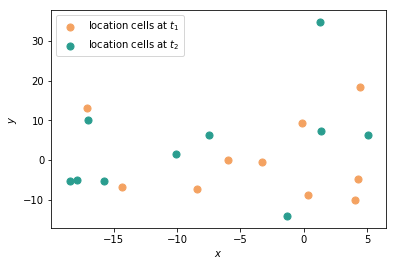

In [81]:
fig, ax = plot_cells(X1, X2)

In [38]:
def monge_brute_force(C):
    """
    Solves the Monge assignment problem using
    brute force.

    Inputs:
        - C: cost matrix (square, size n x n)

    Outputs:
        - best_perm: optimal assigments (list of n indices matching the rows
                to the columns)
        - best_cost: optimal cost corresponding to the best permutation

    DO NOT USE FOR PROBLEMS OF A SIZE LARGER THAN 12!!!
    """
    n, m = C.shape
    assert n==m  # C should be square
    best_perm = None
    best_cost = np.inf
    for perm in permutations(list(map(lambda x:x,range(0,n)))):
        cost = sum([C[i,perm[i]] for i in range(0,10)])
        if cost < best_cost:
            best_cost = cost
            best_perm = perm
    # loop over all permutations and to find the
    # matching with the lowest cost
    return best_perm, best_cost

In [ ]:
from optimal_transport import monge_brute_force

In [31]:
perm

(2, 1, 0)

In [39]:
# get the cost matrix (i.e. pairwise squared
# Euclidean distanc£es between the cells at the different times)

C = pairwise_distances(X1,X2)

In [40]:
# get matching

best_perm, best_cost = monge_brute_force(C)

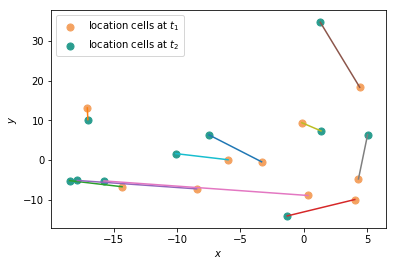

In [55]:
# make a plot with the connections of the cells
fig, ax = plot_cells(X1, X2)

for i in range(0,10):
    plt.plot([X1[i,0],X2[best_perm[i],0]],[X1[i,1],X2[best_perm[i],1]])

## Cell differentiation

Three types of cells are cultured together. At $t_1$ we know the expression of some cells of every type (two genes). After some time $t_2$, the cells have multiplied are have differentiated somewhat. A new gene expression analysis is done for a set of cells from the culture (without information about the type). How did the expression change for every type?

1. Link the cells from the two time points using OT. Use Sinkhorn with $\lambda=10$ and squared Euclidean distance for cost.
2. Plot the mapping (use the \texttt{alpha} argument to set the shade of a color).
3. Compute the `drift' (difference in average gene expression) in gene expression for every cell type. 

In [83]:
# X1 and X2 are gene expressions for the cells at time 1 and 2
# y1 is the indicator of the type of cells, only known at t1
from cell_differentiation import X1, X2, y1, plot_cells

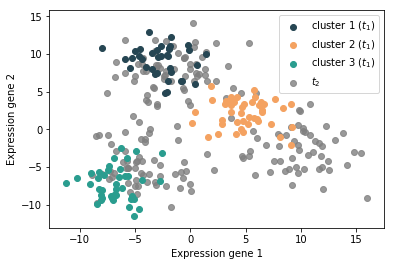

In [85]:
fig, ax = plt.subplots()
plot_cells(ax)

In [67]:
def compute_optimal_transport(C, a, b, lam, epsilon=1e-8,
                verbose=False, return_iterations=False):
    """
    Computes the optimal transport matrix and Slinkhorn distance using the
    Sinkhorn-Knopp algorithm

    Inputs:
        - C : cost matrix (n x m)
        - a : vector of marginals (n, )
        - b : vector of marginals (m, )
        - lam : strength of the entropic regularization
        - epsilon : convergence parameter
        - verbose : report number of steps while running
        - return_iterations : report number of iterations till convergence,
                default False

    Output:
        - P : optimal transport matrix (n x m)
        - dist : Sinkhorn distance
        - n_iterations : number of iterations, if `return_iterations` is set to
                        True
    """
    n, m = C.shape
    P = np.exp(- lam * C)
    iteration = 0
    while True:
        iteration += 1
        u = P.sum(1)  # marginals of rows
        max_deviation = np.max(np.abs(u - a))
        if verbose: print('Iteration {}: max deviation={}'.format(
                            iteration, max_deviation
                        ))
        if max_deviation < epsilon:
            break
        # scale rows        
        P *= (a / u).reshape((-1, 1))
        # scale columns
        P *= (b / P.sum(0)).reshape((1, -1))    
    
    if return_iterations:
        return P, np.sum(P * C), iteration
    else:
        return P, np.sum(P * C)

In [ ]:
from optimal_transport import compute_optimal_transport

In [68]:
# get the cost matrix (i.e. pairwise squared
# Euclidean distances of the expression vectors
# of the cells at the different times)

C = pairwise_distances(X1,X2)

In [75]:
# get matching
n, m = C.shape
a = np.ones(n)*1/n
b = np.ones(m)*1/m
P, _ = compute_optimal_transport(C,a,b, lam=10)

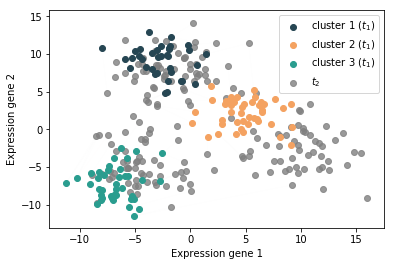

In [89]:
# plot the cells with the mapping between the times
fig, ax = plt.subplots()
plot_cells(ax)

for i in range(0,n):
    for j in range(0,m):
        alpha = P[i,j]*m 
        if P[i,j] > 1e-5:
            plt.plot([X1[i,0],X2[j,0]],[X1[i,1],X2[j,1]],alpha=P[i,j])

In [ ]:
# compute the drift (average change in gene expression
# for different classes between the two time points)